# EDA y obtención de insights

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import calendar
import nltk
from wordcloud import WordCloud
from nltk.corpus import stopwords

## Carga de datos y merge para consolidar el DataFrame

In [2]:
rv = pd.read_csv('reviews.csv', sep=';')
rv.head()

,review_id,lodging_id,guest_id,date,review,rating
0,1,1,1,2021-08-08,Good for when you're in a pinch. More availabi...,3.0
1,2,1,2,2021-03-16,Getting much better very sweet receptionists. ...,5.0
2,3,1,3,2021-02-04,This is the best I've seen their property in y...,4.0
3,4,1,4,2021-01-12,The true name is Budget Suites. I lived here f...,5.0
4,5,1,5,2021-01-12,MY FRIEND LIVE HERE AND IT CLEAN OUTSIDE PARKI...,3.0


In [3]:
guest = pd.read_csv('guests.csv', sep=';')
guest.head()

,guest_id,guest_code,guest_name
0,1,104214820746282089464,Aja Suarez
1,2,110938691322071223313,Mrs Smith
2,3,106763631676192487454,Shanell Bucks
3,4,107783679376826107125,Heidi Refior
4,5,109823833033500520389,Melissa Redmond


In [4]:
hotels = pd.read_csv('lodgings.csv', sep=';')
hotels.head()

,lodging_id,lodging_code,lodging_name,latitude,longitude,state
0,1,0x80c8dae62e7dbaaf:0xd30feda3d0851444,The Suites Boulder Highway,36.116725,-115.067942,NV
1,2,0x80990aa2fd553e63:0x151102a1b673901c,Silver Queen Inn,39.167694,-119.768219,NV
2,3,0x80990abda2db4213:0x7a05c184f1d87001,Roundhouse Inn,39.172948,-119.767093,NV
3,4,0x8099225f746c934d:0x275b77de4045461a,World Famous Mustang Ranch,39.544155,-119.555359,NV
4,5,0x80c8cdfde192106f:0x3c9f129657bafe14,Allure Floatspa,35.995655,-115.100067,NV


In [5]:
df = pd.merge(rv, guest, on='guest_id')
df.head()

,review_id,lodging_id,guest_id,date,review,rating,guest_code,guest_name
0,1,1,1,2021-08-08,Good for when you're in a pinch. More availabi...,3.0,104214820746282089464,Aja Suarez
1,2,1,2,2021-03-16,Getting much better very sweet receptionists. ...,5.0,110938691322071223313,Mrs Smith
2,3,1,3,2021-02-04,This is the best I've seen their property in y...,4.0,106763631676192487454,Shanell Bucks
3,4,1,4,2021-01-12,The true name is Budget Suites. I lived here f...,5.0,107783679376826107125,Heidi Refior
4,5,1,5,2021-01-12,MY FRIEND LIVE HERE AND IT CLEAN OUTSIDE PARKI...,3.0,109823833033500520389,Melissa Redmond


In [6]:
df = pd.merge(df, hotels, on='lodging_id')
df.head()

,review_id,lodging_id,guest_id,date,review,rating,guest_code,guest_name,lodging_code,lodging_name,latitude,longitude,state
0,1,1,1,2021-08-08,Good for when you're in a pinch. More availabi...,3.0,104214820746282089464,Aja Suarez,0x80c8dae62e7dbaaf:0xd30feda3d0851444,The Suites Boulder Highway,36.116725,-115.067942,NV
1,2,1,2,2021-03-16,Getting much better very sweet receptionists. ...,5.0,110938691322071223313,Mrs Smith,0x80c8dae62e7dbaaf:0xd30feda3d0851444,The Suites Boulder Highway,36.116725,-115.067942,NV
2,3,1,3,2021-02-04,This is the best I've seen their property in y...,4.0,106763631676192487454,Shanell Bucks,0x80c8dae62e7dbaaf:0xd30feda3d0851444,The Suites Boulder Highway,36.116725,-115.067942,NV
3,4,1,4,2021-01-12,The true name is Budget Suites. I lived here f...,5.0,107783679376826107125,Heidi Refior,0x80c8dae62e7dbaaf:0xd30feda3d0851444,The Suites Boulder Highway,36.116725,-115.067942,NV
4,5,1,5,2021-01-12,MY FRIEND LIVE HERE AND IT CLEAN OUTSIDE PARKI...,3.0,109823833033500520389,Melissa Redmond,0x80c8dae62e7dbaaf:0xd30feda3d0851444,The Suites Boulder Highway,36.116725,-115.067942,NV


In [7]:
df.drop(columns=['guest_code', 'lodging_code'], inplace=True)

In [8]:
df

,review_id,lodging_id,guest_id,date,review,rating,guest_name,lodging_name,latitude,longitude,state
0,1,1,1,2021-08-08,Good for when you're in a pinch. More availabi...,3.0,Aja Suarez,The Suites Boulder Highway,36.116725,-115.067942,NV
1,2,1,2,2021-03-16,Getting much better very sweet receptionists. ...,5.0,Mrs Smith,The Suites Boulder Highway,36.116725,-115.067942,NV
2,3,1,3,2021-02-04,This is the best I've seen their property in y...,4.0,Shanell Bucks,The Suites Boulder Highway,36.116725,-115.067942,NV
3,4,1,4,2021-01-12,The true name is Budget Suites. I lived here f...,5.0,Heidi Refior,The Suites Boulder Highway,36.116725,-115.067942,NV
4,5,1,5,2021-01-12,MY FRIEND LIVE HERE AND IT CLEAN OUTSIDE PARKI...,3.0,Melissa Redmond,The Suites Boulder Highway,36.116725,-115.067942,NV
...,...,...,...,...,...,...,...,...,...,...,...
36234,34883,1366,32897,2023-06-22,Woken up by a fire alarm at 7:15 am. No explan...,2.0,Jackson Thompson,"Holiday Inn Express Manhattan Midtown West, an...",40.763988,-73.994593,NY
36235,34884,1366,32898,2021-03-08,Wonderful holiday inn hotel,4.0,Harper Harris,"Holiday Inn Express Manhattan Midtown West, an...",40.763988,-73.994593,NY
36236,34885,1366,32899,2023-04-02,Wonderful time for our one night stay. The f...,5.0,Natalie Myers,"Holiday Inn Express Manhattan Midtown West, an...",40.763988,-73.994593,NY
36237,34886,1366,32900,2020-11-20,Worst in parking and room clean the shower is ...,3.0,Hailey Myers,"Holiday Inn Express Manhattan Midtown West, an...",40.763988,-73.994593,NY


# EDA - Análisis exploratorio de datos

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36239 entries, 0 to 36238
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   review_id     36239 non-null  int64  
 1   lodging_id    36239 non-null  int64  
 2   guest_id      36239 non-null  int64  
 3   date          36239 non-null  object 
 4   review        36239 non-null  object 
 5   rating        36238 non-null  float64
 6   guest_name    36239 non-null  object 
 7   lodging_name  36239 non-null  object 
 8   latitude      36239 non-null  float64
 9   longitude     36239 non-null  float64
 10  state         36239 non-null  object 
dtypes: float64(3), int64(3), object(5)
memory usage: 3.0+ MB


## Convertimos la columna date al tipo de dato requerido y se crean las columnas mes y año

In [10]:
# Convertir la columna 'date' a tipo de dato de fecha
df['date'] = pd.to_datetime(df['date'])

In [11]:
# Extraer mes y año en columnas separadas
df['month'] = df['date'].dt.month
df['year'] = df['date'].dt.year

In [12]:
df.head()

,review_id,lodging_id,guest_id,date,review,rating,guest_name,lodging_name,latitude,longitude,state,month,year
0,1,1,1,2021-08-08,Good for when you're in a pinch. More availabi...,3.0,Aja Suarez,The Suites Boulder Highway,36.116725,-115.067942,NV,8,2021
1,2,1,2,2021-03-16,Getting much better very sweet receptionists. ...,5.0,Mrs Smith,The Suites Boulder Highway,36.116725,-115.067942,NV,3,2021
2,3,1,3,2021-02-04,This is the best I've seen their property in y...,4.0,Shanell Bucks,The Suites Boulder Highway,36.116725,-115.067942,NV,2,2021
3,4,1,4,2021-01-12,The true name is Budget Suites. I lived here f...,5.0,Heidi Refior,The Suites Boulder Highway,36.116725,-115.067942,NV,1,2021
4,5,1,5,2021-01-12,MY FRIEND LIVE HERE AND IT CLEAN OUTSIDE PARKI...,3.0,Melissa Redmond,The Suites Boulder Highway,36.116725,-115.067942,NV,1,2021


## Encontramos 1027 hoteles diferentes en los datos de los 5 estados bajo estudio

In [13]:
# Cantidad de Hoteles en todo EEUU en los datos de GoogleMaps
len(df['lodging_name'].unique())

1027

## Obtenemos el número de Reviews y Hoteles presente por cada estado en el DataSet

In [14]:
#  Cantidad de reviews por estado

nrv = df.groupby('state')['review'].count().reset_index(name='N_Reviews')
nrv

,state,N_Reviews
0,CA,6424
1,FL,12656
2,NV,5976
3,NY,4900
4,TX,6283


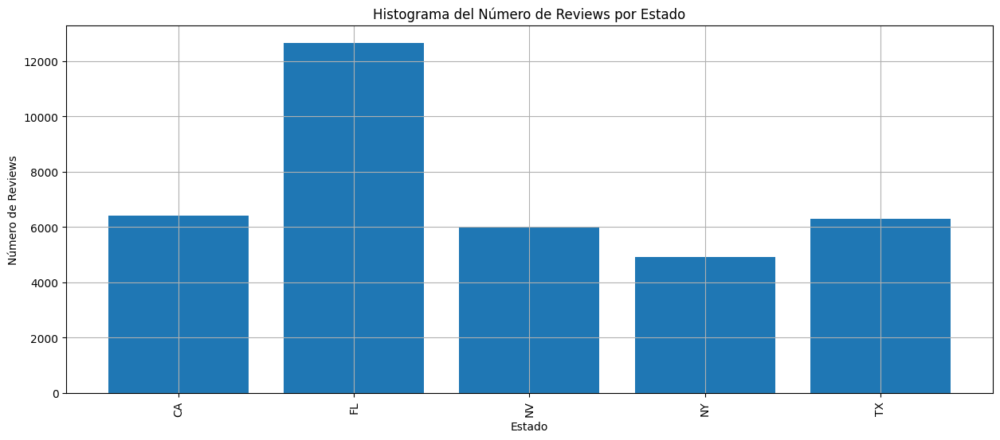

In [15]:
# Histograma de cantidad de reviews por Estado
# Crear el histograma
plt.figure(figsize=(15, 6))
plt.bar(nrv['state'], nrv['N_Reviews'])
plt.xlabel('Estado')
plt.ylabel('Número de Reviews')
plt.title('Histograma del Número de Reviews por Estado')
plt.xticks(rotation=90)
plt.grid(True)
plt.show()

In [16]:
# N de Hoteles por Estado
nhoteles = df.groupby('state')['lodging_name'].nunique().reset_index(name='N_Hoteles')
nhoteles

,state,N_Hoteles
0,CA,242
1,FL,339
2,NV,96
3,NY,168
4,TX,195


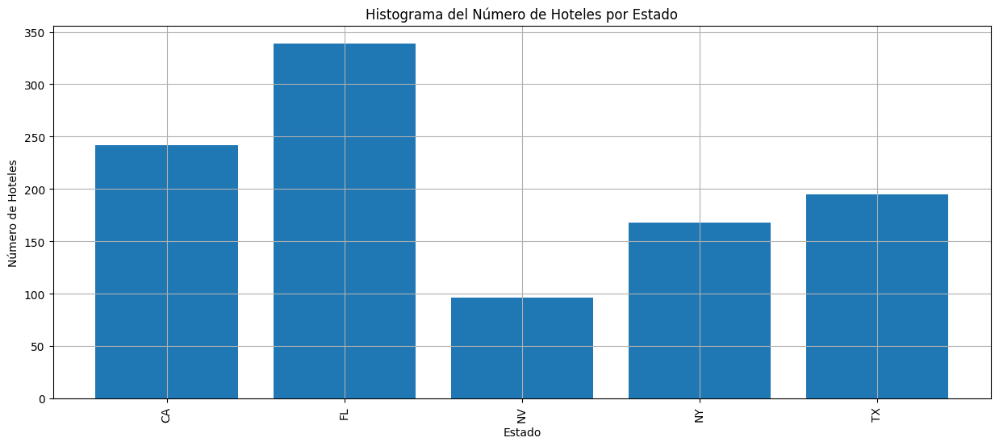

In [17]:
# Histograma de cantidad de hoteles por Estado
# Crear el histograma
plt.figure(figsize=(15, 6))
plt.bar(nhoteles['state'], nhoteles['N_Hoteles'])
plt.xlabel('Estado')
plt.ylabel('Número de Hoteles')
plt.title('Histograma del Número de Hoteles por Estado')
plt.xticks(rotation=90)
plt.grid(True)
plt.show()

In [18]:
df_combined = pd.merge(nrv, nhoteles, on='state')
df_combined

,state,N_Reviews,N_Hoteles
0,CA,6424,242
1,FL,12656,339
2,NV,5976,96
3,NY,4900,168
4,TX,6283,195


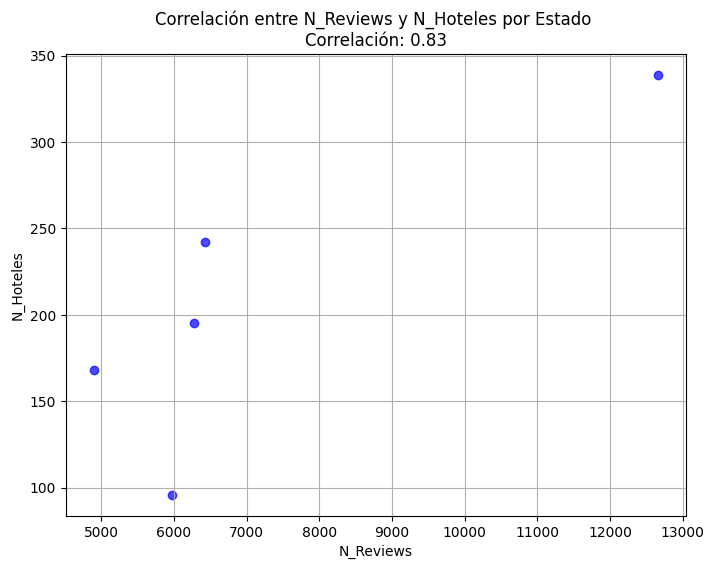

In [19]:
# Correlación entre N de Hoteles y N de Reviews:
corr = df_combined['N_Reviews'].corr(df_combined['N_Hoteles'])
plt.figure(figsize=(8, 6))
plt.scatter(df_combined['N_Reviews'], df_combined['N_Hoteles'], color='blue', alpha=0.7)
plt.title(f'Correlación entre N_Reviews y N_Hoteles por Estado \nCorrelación: {corr:.2f}')
plt.xlabel('N_Reviews')
plt.ylabel('N_Hoteles')
plt.grid(True)
plt.show()

### En términos generales hay una alta correlación entre el número de hoteles y el número de reviews dentro de los estados. 
### El caso de menor correspondencia es el de Nevada que con 96 hoteles tiene 5.976 reviews	

/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


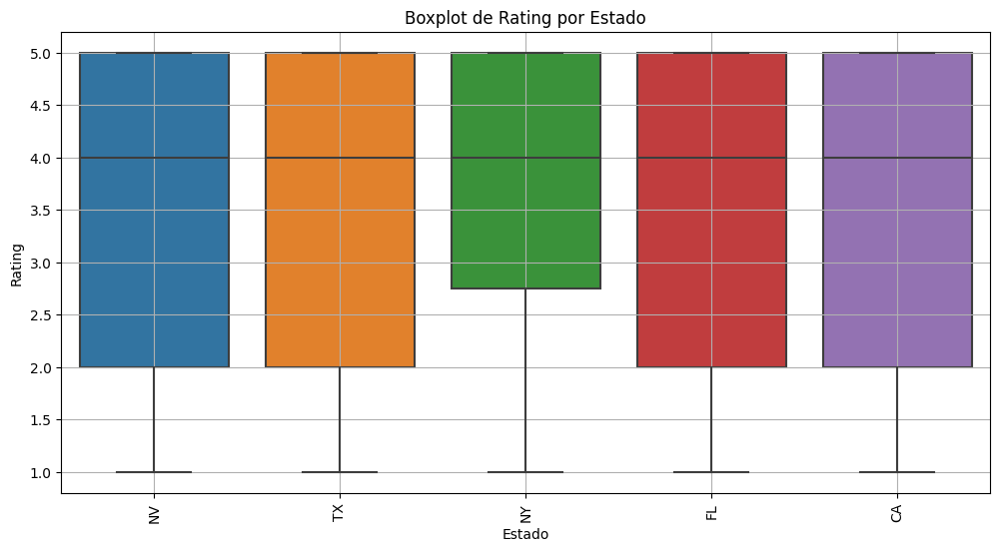

In [20]:
# Rating por Estado
plt.figure(figsize=(12, 6))
sns.boxplot(x='state', y='rating',data=df)
plt.xlabel('Estado')
plt.ylabel('Rating')
plt.title('Boxplot de Rating por Estado')
plt.xticks(rotation=90)
plt.grid(True)
plt.show()

In [21]:
# Ratio N. reviews / N. Hoteles
df_combined['Ratio rv_hotel'] = df_combined['N_Reviews'] / df_combined['N_Hoteles']
df_combined

,state,N_Reviews,N_Hoteles,Ratio rv_hotel
0,CA,6424,242,26.545455
1,FL,12656,339,37.333333
2,NV,5976,96,62.250000
3,NY,4900,168,29.166667
4,TX,6283,195,32.220513


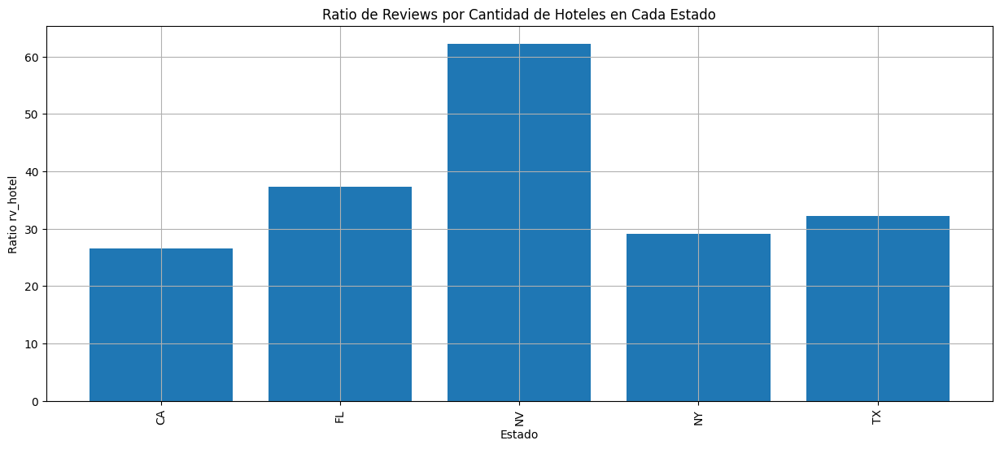

In [22]:
# Crear el gráfico de barras
plt.figure(figsize=(15, 6))
plt.bar(df_combined['state'], df_combined['Ratio rv_hotel'])
plt.xlabel('Estado')
plt.ylabel('Ratio rv_hotel')
plt.title('Ratio de Reviews por Cantidad de Hoteles en Cada Estado')
plt.xticks(rotation=90)
plt.grid(True)
plt.show()

In [23]:
# cantidad de reviews por año
# Reviews por año
reviewsanio = df.groupby(df['date'].dt.year)['review'].count().reset_index(name='N_Reviews')
reviewsanio

,date,N_Reviews
0,2005,1
1,2006,2
2,2007,30
3,2008,58
4,2009,130
5,2010,201
6,2011,376
7,2012,471
8,2013,617
9,2014,906


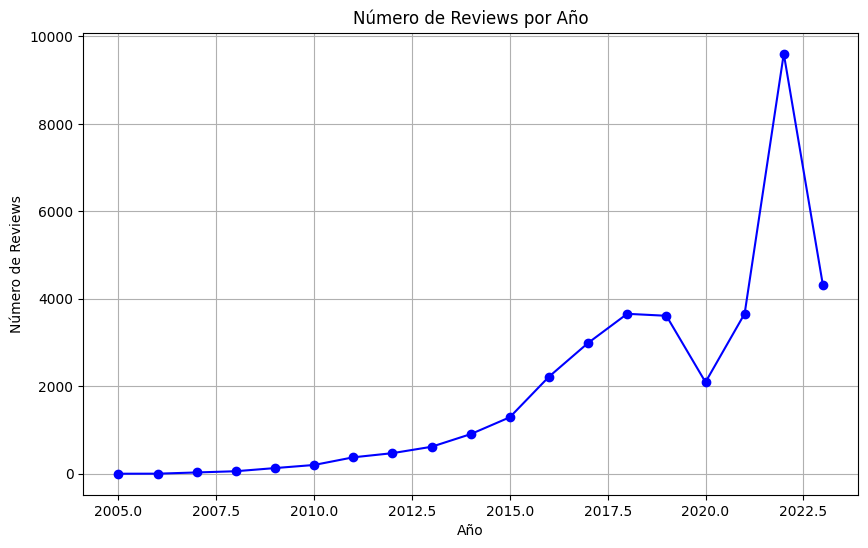

In [24]:
# Crear el gráfico de línea
plt.figure(figsize=(10, 6))
plt.plot(reviewsanio['date'], reviewsanio['N_Reviews'], marker='o', linestyle='-', color='b')
plt.xlabel('Año')
plt.ylabel('Número de Reviews')
plt.title('Número de Reviews por Año')
plt.grid(True)
plt.show()

### De acuerdo a la cantidad de reviews por año en los datos estudiados, se observa una caida fuerte en el año 2020 debido a la pandemia del covid19, y una vez se abrieron los servicios de nuevo hay una recuperación importante. 

In [25]:
# Obtener el nombre del mes y ordenarlos por el orden deseado
month_order = list(calendar.month_name)[1:]  # Lista de meses sin el primer elemento vacío
df['month_name'] = df['date'].dt.month.map(lambda x: calendar.month_name[x])
df['month_name'] = pd.Categorical(df['month_name'], categories=month_order, ordered=True)

# Reviews por mes ordenados por el orden deseado
reviewsmes = df.groupby('month_name')['review'].count().reset_index(name='N_Reviews')
print(reviewsmes)

   month_name  N_Reviews
0     January       2064
1    February       2097
2       March       2545
3       April       2400
4         May       2546
5        June       3319
6        July       4959
7      August       4644
8   September       2319
9     October       2455
10   November       2606
11   December       4285


/var/folders/7b/x372r2jn4b95xj0_xs49ys4h0000gn/T/ipykernel_13079/472388049.py:7: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  reviewsmes = df.groupby('month_name')['review'].count().reset_index(name='N_Reviews')


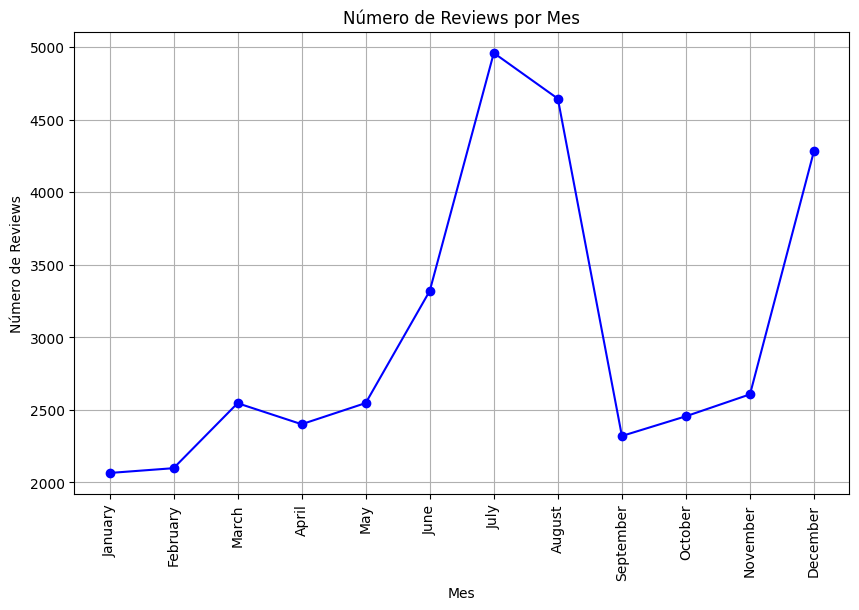

In [26]:
# Crear el gráfico de línea
plt.figure(figsize=(10, 6))
plt.plot(reviewsmes['month_name'], reviewsmes['N_Reviews'], marker='o', linestyle='-', color='b')
plt.xlabel('Mes')
plt.ylabel('Número de Reviews')
plt.title('Número de Reviews por Mes')
plt.xticks(rotation=90)
plt.grid(True)
plt.show()

# KPI: 
## El número de reviews mes por mes nos indica que los meses de mayor ocupación en Hoteles en Estados Unidos se da en periodos vacacionales. Encontramos un pequeño pico en Marzo que concide con Spring Break y en vacaciones de Verano entre Julio y Agosto, la caída en septiembre por la finalización de vacaciones. En el mes de Noviembre hay una pequeña recuperación, coincidiendo con Thanks Giving, y en diciembre vuelte a haber una alta ocupación, coincidiendo con navidad.

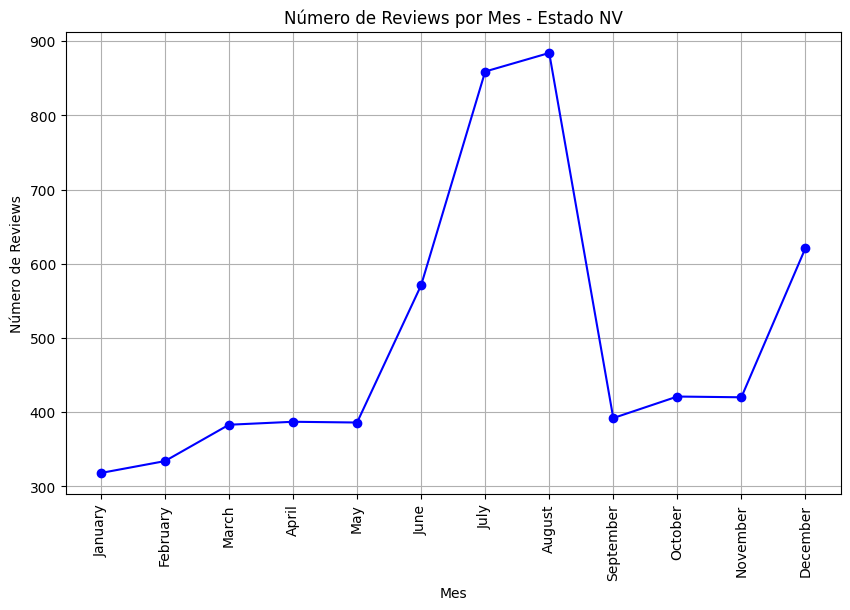

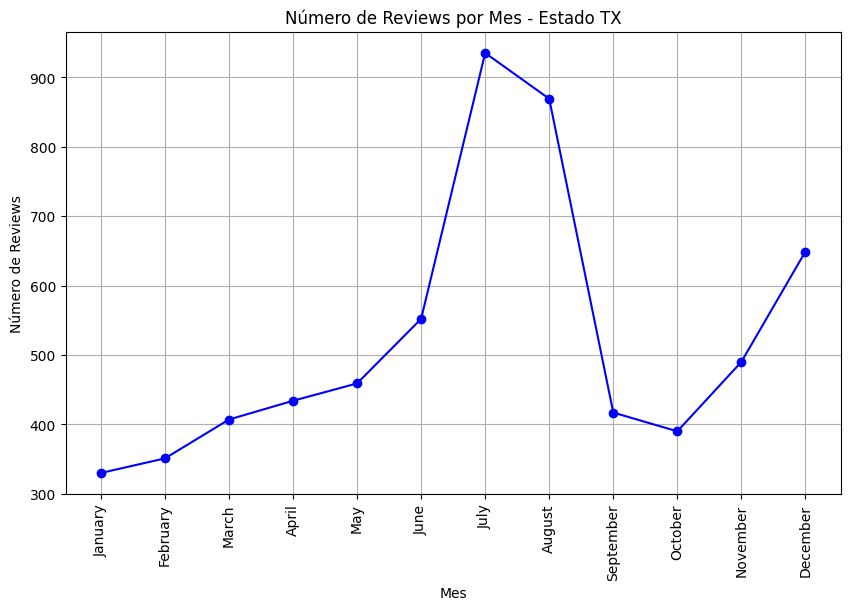

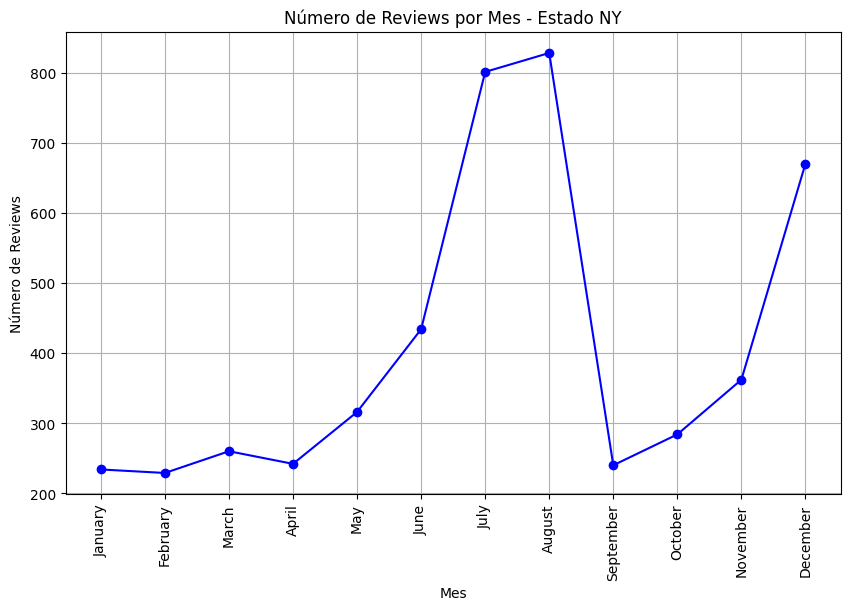

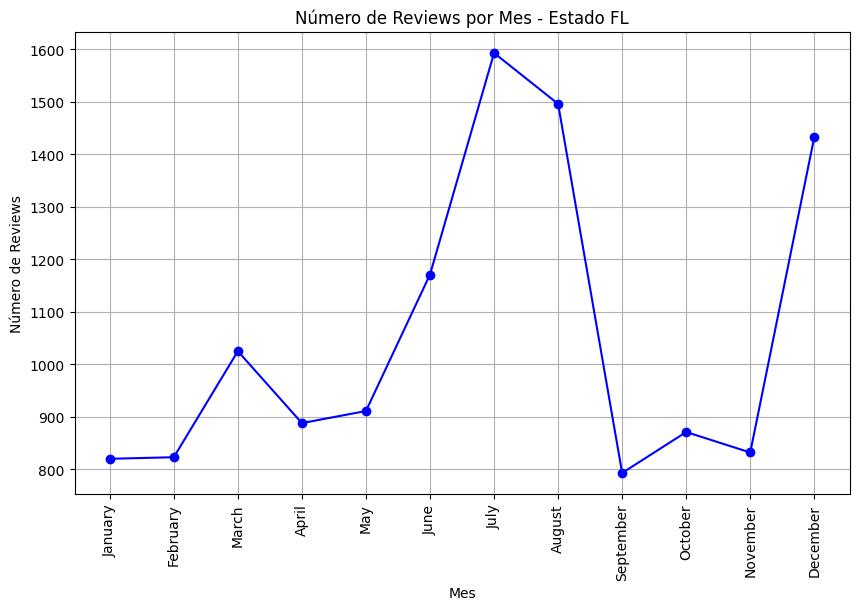

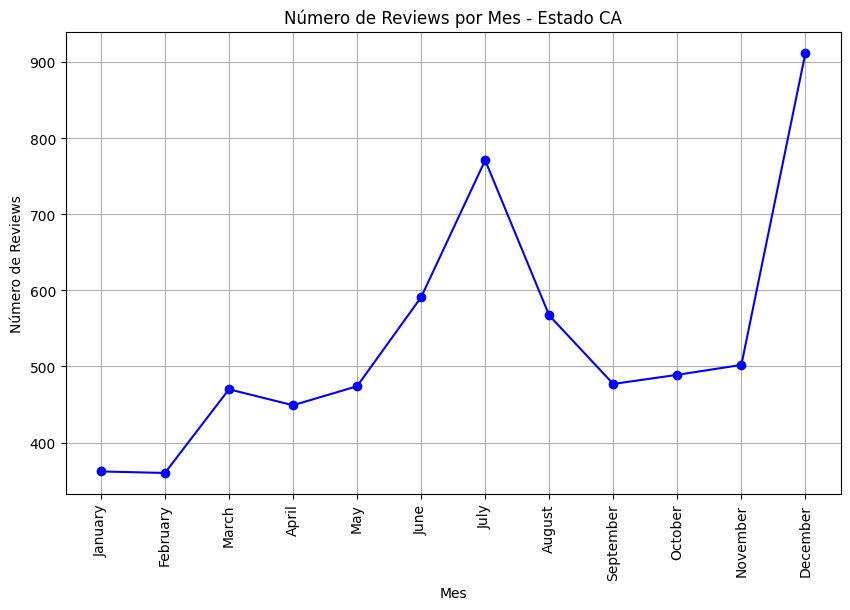

In [27]:
# Graficar número de reviews por mes en cada estado

# Obtener una lista única de estados presentes en la columna 'state'
states = df['state'].unique()

# Iterar a través de los estados y crear gráficos para cada uno
for state in states:
    state_df = df[df['state'] == state].copy()  # Hacer una copia para evitar SettingWithCopyWarning

    # Obtener el nombre del mes y ordenarlos por el orden deseado
    month_order = list(calendar.month_name)[1:]
    state_df['month_name'] = state_df['date'].dt.month.map(lambda x: calendar.month_name[x])
    state_df['month_name'] = pd.Categorical(state_df['month_name'], categories=month_order)

    # Contar el número de reviews por mes
    reviewsmes = state_df.groupby('month_name', observed=True)['review'].count().reset_index(name='N_Reviews')

    # Crear el gráfico de línea para el estado actual
    plt.figure(figsize=(10, 6))
    plt.plot(reviewsmes['month_name'], reviewsmes['N_Reviews'], marker='o', linestyle='-', color='b')
    plt.xlabel('Mes')
    plt.ylabel('Número de Reviews')
    plt.title(f'Número de Reviews por Mes - Estado {state}')
    plt.xticks(rotation=90)
    plt.grid(True)
    plt.show()

## En términos generales el comportamiento de la ocupación en los 5 estados es parecido. Sin embargo se destacan California y Florida como los dos estados en los que hay una mayor ocupación para los meses de marzo y diciembre, coincidiendo con Spring Break y Navidad

In [28]:
# sotpwords por rangos de ratings, malo (entre 1y2), neutro(3), bueno(4 y 5)
rt1 = df[(df['rating'] >= 1) & (df['rating'] <= 2)].copy()

[nltk_data] Downloading package stopwords to /Users/hugo/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


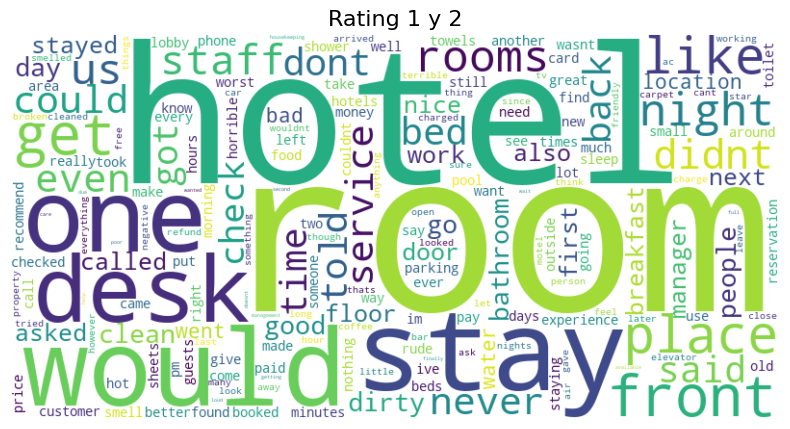

In [29]:
# tokenizando
text = rt1['review'].str.cat()
text = text.lower()  # Convierte a minúsculas
text = ''.join([c for c in text if c.isalpha() or c.isspace()])  # Elimina caracteres no alfabéticos
# Tokenización
nltk.download('stopwords')
words = nltk.word_tokenize(text)
stop_words = set(stopwords.words('english'))
words = [word for word in words if word not in stop_words]  # Elimina palabras vacías

# Análisis de frecuencia de palabras
freq_dist = nltk.FreqDist(words)

# Creación de la Word Cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(freq_dist)

# Visualización
plt.figure(figsize=(10, 5))
plt.title('Rating 1 y 2', fontsize=16)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

### Para este caso consideramos como malo el servicio en aquellos hoteles con rating 1 y 2. Aquí se puede observar dentro de las palabras más repetidas hotel, personal, servicio, desayuno, cama, baño. De acuerdo con el rating, podría inferirse que hay una mala calificación frente a estos aspectos

In [30]:
# Descargar los datos de NLTK
nltk.download('punkt')

# Tokenización
words = nltk.word_tokenize(text)

[nltk_data] Downloading package punkt to /Users/hugo/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


[nltk_data] Downloading package stopwords to /Users/hugo/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


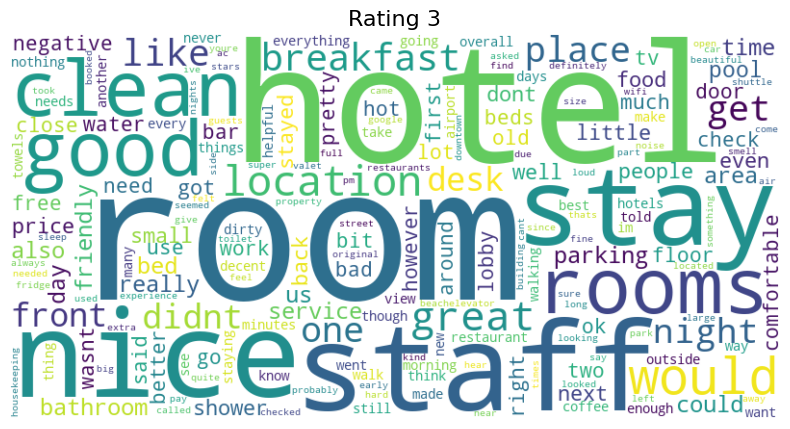

In [31]:
rt3 = df[df['rating'] == 3].copy()
# tokenizando
text = rt3['review'].str.cat()
text = text.lower()  # Convierte a minúsculas
text = ''.join([c for c in text if c.isalpha() or c.isspace()])  # Elimina caracteres no alfabéticos
# Tokenización
nltk.download('stopwords')
words = nltk.word_tokenize(text)
stop_words = set(stopwords.words('english'))
words = [word for word in words if word not in stop_words]  # Elimina palabras vacías

# Análisis de frecuencia de palabras
freq_dist = nltk.FreqDist(words)

# Creación de la Word Cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(freq_dist)

# Visualización
plt.figure(figsize=(10, 5))
plt.title('Rating 3', fontsize=16)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

### Para este caso consideramos como neutro el servicio en aquellos hoteles con rating 3. En la nube de palabras puede observarse cuales son los temas más tratados por los clientes

[nltk_data] Downloading package stopwords to /Users/hugo/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


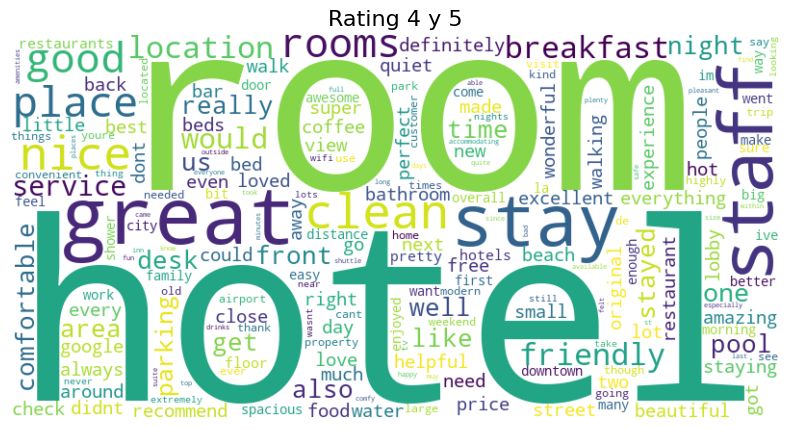

In [32]:
rt4 = df[(df['rating'] >= 4) & (df['rating'] <= 5)].copy()
# tokenizando
text = rt4['review'].str.cat()
text = text.lower()  # Convierte a minúsculas
text = ''.join([c for c in text if c.isalpha() or c.isspace()])  # Elimina caracteres no alfabéticos
# Tokenización
nltk.download('stopwords')
words = nltk.word_tokenize(text)
stop_words = set(stopwords.words('english'))
words = [word for word in words if word not in stop_words]  # Elimina palabras vacías

# Análisis de frecuencia de palabras
freq_dist = nltk.FreqDist(words)

# Creación de la Word Cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(freq_dist)

# Visualización
plt.figure(figsize=(10, 5))
plt.title('Rating 4 y 5', fontsize=16)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

### Para este caso consideramos como bueno el servicio en aquellos hoteles con rating 4 y 5. Y nuevamente puede observarse las palabras más mencionadas en los reviews de los clientes, y en teste caso, podría inferirse que se trata de aspectos positivos de los hoteles

In [33]:
rt4.shape

(19913, 14)

## Cargamos el Data Set con el modelo de análisis de sentimiento para los 5 Hoteles de la compañía, con los hoteles de la competencia

In [34]:
openai = pd.read_csv('reviews-model.csv', sep=',')
openai.head()

,review_id,lodging_id,guest_id,date,review,rating,overall_sentiment,room_sentiment,guest_service_sentiment,cleaning_sentiment,breakfast_sentiment,sentiment_score,clean_review
0,43,811,42,2020-10-19,Decent location good prices and diamonds casin...,4,1,0,0,0,0,0.7003,decent location good price diamond casino plac...
1,140,811,135,2017-03-16,Nice hotel friendly check in staff. Cocktail s...,4,-1,1,-1,0,0,0.9022,nice hotel friendly check staff cocktail serve...
2,240,811,223,2017-03-16,The check in was fast and the receptionist giv...,5,1,1,1,1,0,0.9292,check fast receptionist give we information go...
3,246,811,230,2017-03-17,We make many trips to Reno and are4 delighted ...,5,1,1,1,1,0,0.2732,make many trip reno are4 delight find ramada p...
4,443,811,425,2022-12-21,"Homeless everywhere, did not feel safe. Shower...",3,-1,-1,0,-1,0,-0.7781,homeless everywhere feel safe shower mold sham...


In [35]:
openai.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9050 entries, 0 to 9049
Data columns (total 13 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   review_id                9050 non-null   int64  
 1   lodging_id               9050 non-null   int64  
 2   guest_id                 9050 non-null   int64  
 3   date                     9050 non-null   object 
 4   review                   9050 non-null   object 
 5   rating                   9050 non-null   int64  
 6   overall_sentiment        9050 non-null   int64  
 7   room_sentiment           9050 non-null   int64  
 8   guest_service_sentiment  9050 non-null   int64  
 9   cleaning_sentiment       9050 non-null   int64  
 10  breakfast_sentiment      9050 non-null   int64  
 11  sentiment_score          9050 non-null   float64
 12  clean_review             9050 non-null   object 
dtypes: float64(1), int64(9), object(3)
memory usage: 919.3+ KB


In [36]:
openai['date'] = pd.to_datetime(openai['date'])

In [37]:
model = pd.merge(df, openai, on=['review_id', 'lodging_id', 'guest_id', 'date', 'review', 'rating'])
model.shape

(9049, 21)

## El modelo arroja valores de -1, 0 y 1 para Negativo, Neutro y Positivo. Para un mejor entendimiento de los gráficos se hacen los cambios correspondientes en las columnas

In [38]:
model[['overall_sentiment', 'room_sentiment', 'guest_service_sentiment', 'cleaning_sentiment', 'breakfast_sentiment']] = model[['overall_sentiment', 'room_sentiment', 'guest_service_sentiment', 'cleaning_sentiment', 'breakfast_sentiment']].astype(str)

In [39]:
model[['overall_sentiment', 'room_sentiment', 'guest_service_sentiment', 'cleaning_sentiment', 'breakfast_sentiment']] = model[['overall_sentiment', 'room_sentiment', 'guest_service_sentiment', 'cleaning_sentiment', 'breakfast_sentiment']].replace('-1', 'Negativo')
model[['overall_sentiment', 'room_sentiment', 'guest_service_sentiment', 'cleaning_sentiment', 'breakfast_sentiment']] = model[['overall_sentiment', 'room_sentiment', 'guest_service_sentiment', 'cleaning_sentiment', 'breakfast_sentiment']].replace('0', 'Neutro')
model[['overall_sentiment', 'room_sentiment', 'guest_service_sentiment', 'cleaning_sentiment', 'breakfast_sentiment']] = model[['overall_sentiment', 'room_sentiment', 'guest_service_sentiment', 'cleaning_sentiment', 'breakfast_sentiment']].replace('1', 'Positivo')

In [40]:
model.head()

,review_id,lodging_id,guest_id,date,review,rating,guest_name,lodging_name,latitude,longitude,...,month,year,month_name,overall_sentiment,room_sentiment,guest_service_sentiment,cleaning_sentiment,breakfast_sentiment,sentiment_score,clean_review
0,43,811,42,2020-10-19,Decent location good prices and diamonds casin...,4.0,Mark Stevenson,Ramada by Wyndham Reno Hotel & Casino,39.534134,-119.799592,...,10,2020,October,Positivo,Neutro,Neutro,Neutro,Neutro,0.7003,decent location good price diamond casino plac...
1,140,811,135,2017-03-16,Nice hotel friendly check in staff. Cocktail s...,4.0,jeremy alexander,Ramada by Wyndham Reno Hotel & Casino,39.534134,-119.799592,...,3,2017,March,Negativo,Positivo,Negativo,Neutro,Neutro,0.9022,nice hotel friendly check staff cocktail serve...
2,240,811,223,2017-03-16,The check in was fast and the receptionist giv...,5.0,stephanie bennett,Ramada by Wyndham Reno Hotel & Casino,39.534134,-119.799592,...,3,2017,March,Positivo,Positivo,Positivo,Positivo,Neutro,0.9292,check fast receptionist give we information go...
3,246,811,230,2017-03-17,We make many trips to Reno and are4 delighted ...,5.0,Patricia Thomas,Ramada by Wyndham Reno Hotel & Casino,39.534134,-119.799592,...,3,2017,March,Positivo,Positivo,Positivo,Positivo,Neutro,0.2732,make many trip reno are4 delight find ramada p...
4,443,811,425,2022-12-21,"Homeless everywhere, did not feel safe. Shower...",3.0,Gabi Kinkead,Ramada by Wyndham Reno Hotel & Casino,39.534134,-119.799592,...,12,2022,December,Negativo,Negativo,Neutro,Negativo,Neutro,-0.7781,homeless everywhere feel safe shower mold sham...


## Filtramos los hoteles de la compañía para hacer un análisis inicial

In [41]:
cliente = ['Ramada by Wyndham Reno Hotel & Casino', 'Ramada Plaza by Wyndham Orlando Resort & Suites Intl Drive', 'Ramada Plaza by Wyndham West Hollywood Hotel & Suites', 'Ramada by Wyndham New York Times Square West', 'Ramada by Wyndham Houston Intercontinental Airport East']

In [42]:
cliente_filtrado = model[model['lodging_name'].isin(cliente)].copy()
cliente_filtrado.shape

(5102, 21)

### El promedio de rating de los hoteles de la compañía es de 3

In [43]:
cliente_filtrado['rating'].mean()

3.0339082712661702

[nltk_data] Downloading package stopwords to /Users/hugo/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


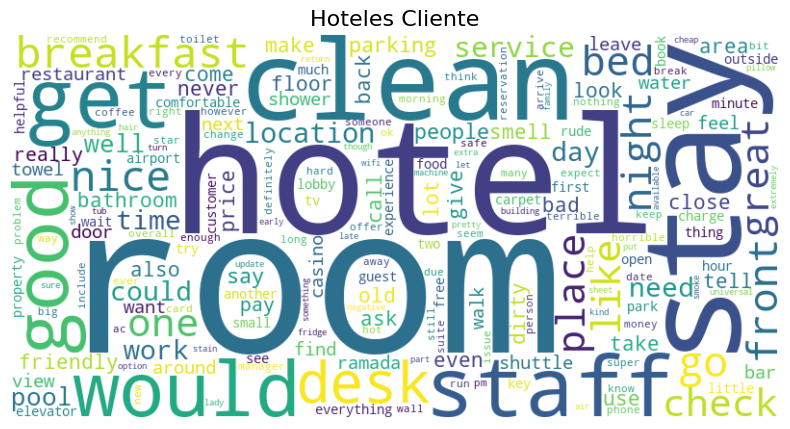

In [44]:
# tokenizando
text = cliente_filtrado['clean_review'].str.cat()
text = text.lower()  # Convierte a minúsculas
text = ''.join([c for c in text if c.isalpha() or c.isspace()])  # Elimina caracteres no alfabéticos
# Tokenización
nltk.download('stopwords')
words = nltk.word_tokenize(text)
stop_words = set(stopwords.words('english'))
words = [word for word in words if word not in stop_words]  # Elimina palabras vacías

# Análisis de frecuencia de palabras
freq_dist = nltk.FreqDist(words)

# Creación de la Word Cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(freq_dist)

# Visualización
plt.figure(figsize=(10, 5))
plt.title('Hoteles Cliente', fontsize=16)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

### Una primera aproximación de los temas más frecuentes que tocan los clientes de los 5 hoteles: cuarto, personal, desayuno, limpieza

In [45]:
# Número de reviews por hotel y rating promedio de cada uno
result = cliente_filtrado.groupby(['state', 'lodging_name']).agg({'review': 'count', 'rating': 'mean'}).reset_index()
result

,state,lodging_name,review,rating
0,CA,Ramada Plaza by Wyndham West Hollywood Hotel &...,915,3.230601
1,FL,Ramada Plaza by Wyndham Orlando Resort & Suite...,1575,3.003175
2,NV,Ramada by Wyndham Reno Hotel & Casino,1301,2.714066
3,NY,Ramada by Wyndham New York Times Square West,301,3.109635
4,TX,Ramada by Wyndham Houston Intercontinental Air...,1010,3.293069


/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a futu

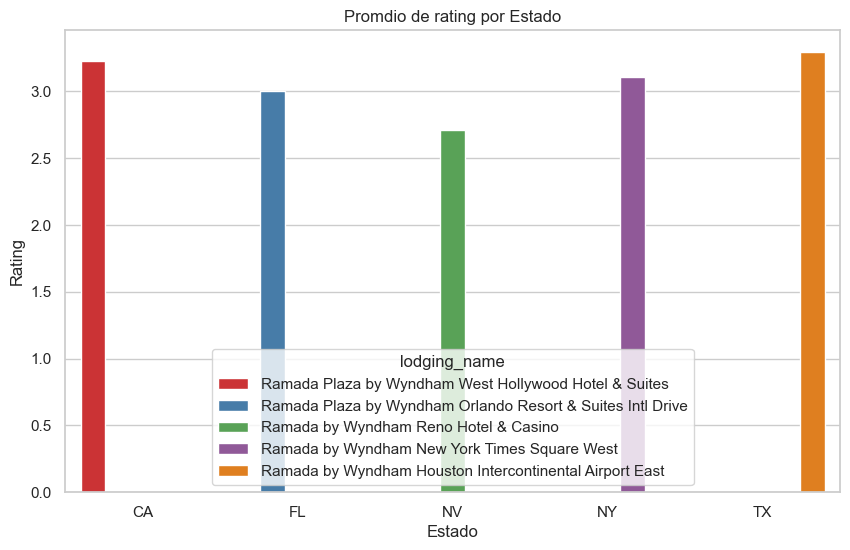

In [46]:
# Gráfico por sentimiento General
# Crear un gráfico de barras apiladas
sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))

# Agrupar por 'state' y 'overall_sentiment' y calcular la suma del conteo
data = cliente_filtrado.groupby(['state', 'lodging_name']).agg({'review': 'count', 'rating': 'mean'}).reset_index()

# Crear el gráfico de barras apiladas
ax = sns.barplot(x='state', y='rating', hue='lodging_name', data=data, palette='Set1')

# Personalizar el gráfico
plt.title('Promdio de rating por Estado')
plt.xlabel('Estado')
plt.ylabel('Rating')
# Mostrar el gráfico
plt.show()

### Los hoteles que están por debajo de 3 en el rating de los clientes son los de Nevada y Florida.

In [47]:
# Conteo de sentimiento General por Hotel
cliente_filtrado.groupby(['state', 'lodging_name'])['overall_sentiment'].value_counts().reset_index(name='conteo')

,state,lodging_name,overall_sentiment,conteo
0,CA,Ramada Plaza by Wyndham West Hollywood Hotel &...,Negativo,469
1,CA,Ramada Plaza by Wyndham West Hollywood Hotel &...,Positivo,400
2,CA,Ramada Plaza by Wyndham West Hollywood Hotel &...,Neutro,46
3,FL,Ramada Plaza by Wyndham Orlando Resort & Suite...,Negativo,902
4,FL,Ramada Plaza by Wyndham Orlando Resort & Suite...,Positivo,607
5,FL,Ramada Plaza by Wyndham Orlando Resort & Suite...,Neutro,66
6,NV,Ramada by Wyndham Reno Hotel & Casino,Negativo,844
7,NV,Ramada by Wyndham Reno Hotel & Casino,Positivo,376
8,NV,Ramada by Wyndham Reno Hotel & Casino,Neutro,81
9,NY,Ramada by Wyndham New York Times Square West,Positivo,143


/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a futu

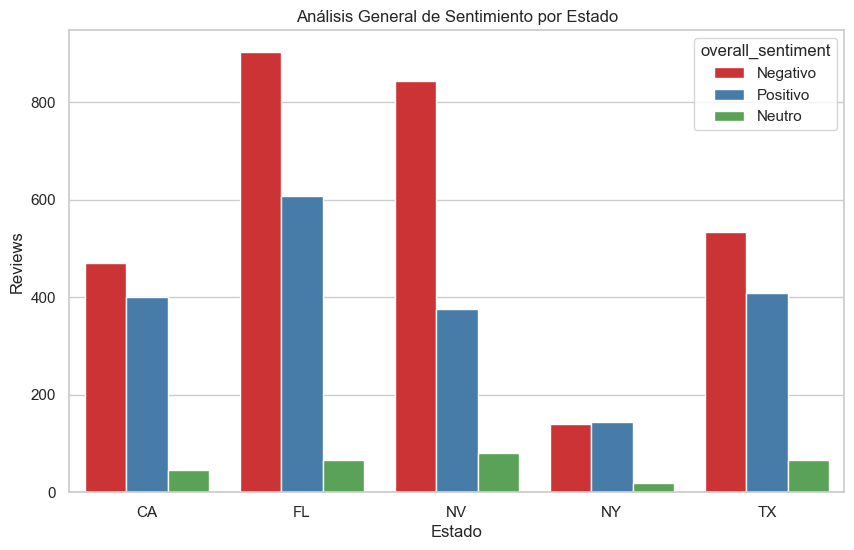

In [48]:
# Gráfico por sentimiento General
# Crear un gráfico de barras apiladas
sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))

# Agrupar por 'state' y 'overall_sentiment' y calcular la suma del conteo
dataov = cliente_filtrado.groupby(['state', 'lodging_name'])['overall_sentiment'].value_counts().reset_index(name='conteo')

# Crear el gráfico de barras apiladas
ax = sns.barplot(x='state', y='conteo', hue='overall_sentiment', data=dataov, palette='Set1')

# Personalizar el gráfico
plt.title('Análisis General de Sentimiento por Estado')
plt.xlabel('Estado')
plt.ylabel('Reviews')

# Mostrar el gráfico
plt.show()

### En general los hoteles de la compañía tienen un sentimiento negativo en los reviews de los clientes. El Hotel de Nevada es el que tiene un mayor negativo frente a los demás sentimientos. Mientras que en Nueva York el sentimiento negativo es ligeramente menor al positivo.

/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a futu

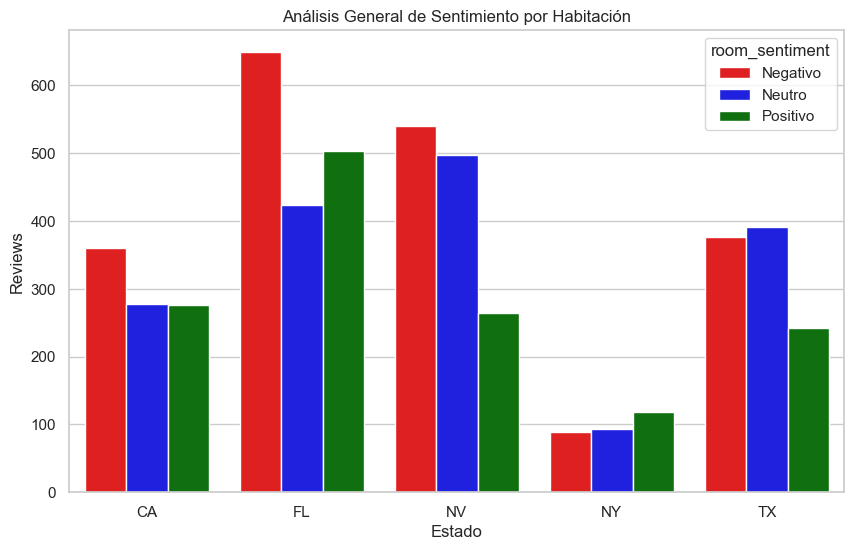

In [49]:
# Gráfico por room_sentiment
# Crear una paleta de colores personalizada
colores = {'Neutro': 'blue', 'Positivo': 'green', 'Negativo': 'red'}
# Definir los colores de las barras utilizando la columna 'Sentimiento'
# Crear un gráfico de barras apiladas
sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))

# Agrupar por 'state' y 'overall_sentiment' y calcular la suma del conteo
datarom = cliente_filtrado.groupby(['state', 'lodging_name'])['room_sentiment'].value_counts().reset_index(name='conteo')
# Definir los colores de las barras utilizando la columna 'Sentimiento'
datarom['Color'] = datarom['room_sentiment'].map(colores)
# Crear el gráfico de barras apiladas
ax = sns.barplot(x='state', y='conteo', hue='room_sentiment', data=datarom, palette=datarom['Color'])

# Personalizar el gráfico
plt.title('Análisis General de Sentimiento por Habitación')
plt.xlabel('Estado')
plt.ylabel('Reviews')

# Mostrar el gráfico
plt.show()

### Cuando hacemos el análisis de sentimiento por habitación, solamente en Nueva York es superior el sentimiento positivo, en los demás estados el sentimient negativo prevalece en este punto

/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a futu

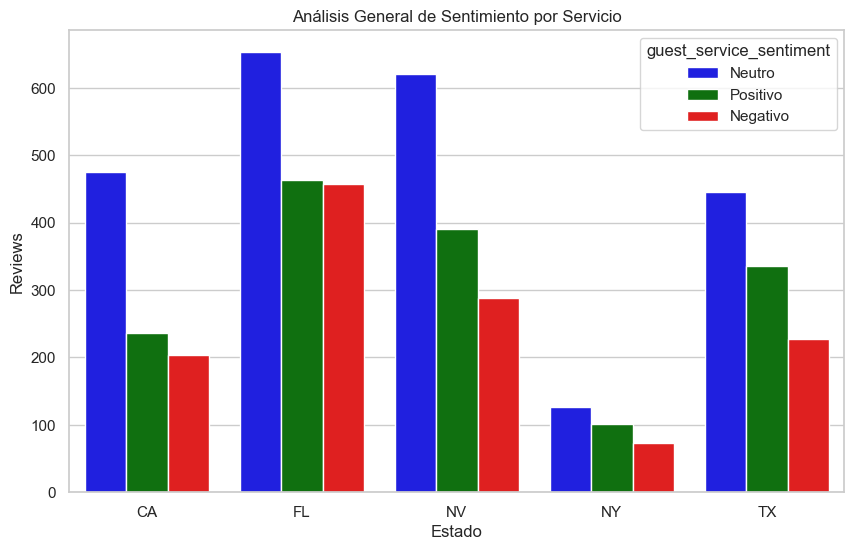

In [50]:
# Gráfico por guest_service_sentiment
# Crear una paleta de colores personalizada
colores = {'Neutro': 'blue', 'Positivo': 'green', 'Negativo': 'red'}
# Crear un gráfico de barras apiladas
sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))

# Agrupar por guest_service_sentiment y calcular la suma del conteo
dataser = cliente_filtrado.groupby(['state', 'lodging_name'])['guest_service_sentiment'].value_counts().reset_index(name='conteo')
# Definir los colores de las barras utilizando la columna 'Sentimiento'
dataser['Color'] = dataser['guest_service_sentiment'].map(colores)
# Crear el gráfico de barras apiladas
ax = sns.barplot(x='state', y='conteo', hue='guest_service_sentiment', data=dataser, palette=dataser['Color'])

# Personalizar el gráfico
plt.title('Análisis General de Sentimiento por Servicio')
plt.xlabel('Estado')
plt.ylabel('Reviews')

# Mostrar el gráfico
plt.show()

### Aunque predomina el sentimiento neutro en todos los estados, también se observa que el sentimiento positivo es ligeramente superior al negativo

In [51]:
# Agrupar por cleaning_sentiment y calcular la suma del conteo
datalod = cliente_filtrado.groupby(['state', 'lodging_name'])['cleaning_sentiment'].value_counts().reset_index(name='conteo')
datalod

,state,lodging_name,cleaning_sentiment,conteo
0,CA,Ramada Plaza by Wyndham West Hollywood Hotel &...,Neutro,376
1,CA,Ramada Plaza by Wyndham West Hollywood Hotel &...,Negativo,323
2,CA,Ramada Plaza by Wyndham West Hollywood Hotel &...,Positivo,216
3,FL,Ramada Plaza by Wyndham Orlando Resort & Suite...,Negativo,608
4,FL,Ramada Plaza by Wyndham Orlando Resort & Suite...,Neutro,553
5,FL,Ramada Plaza by Wyndham Orlando Resort & Suite...,Positivo,414
6,NV,Ramada by Wyndham Reno Hotel & Casino,Neutro,556
7,NV,Ramada by Wyndham Reno Hotel & Casino,Negativo,520
8,NV,Ramada by Wyndham Reno Hotel & Casino,Positivo,225
9,NY,Ramada by Wyndham New York Times Square West,Neutro,116


/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a futu

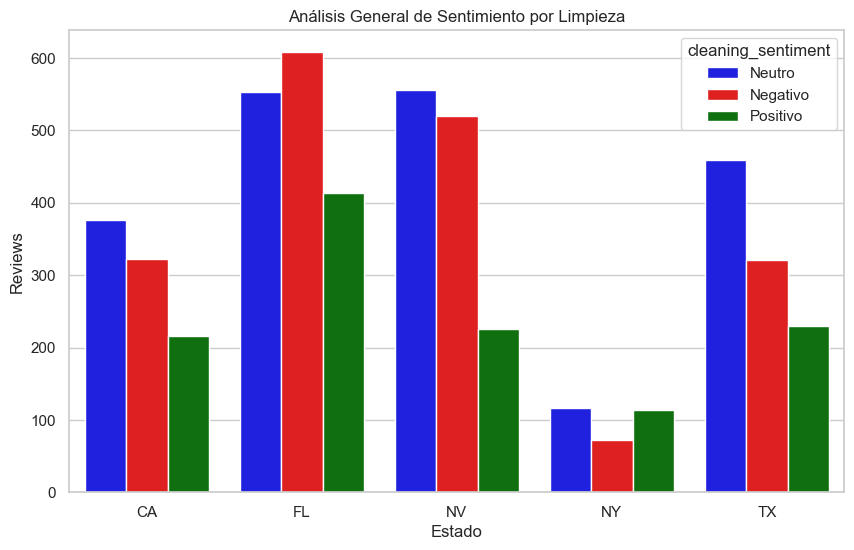

In [52]:
# Gráfico por cleaning_sentiment
# Crear una paleta de colores personalizada
colores = {'Neutro': 'blue', 'Positivo': 'green', 'Negativo': 'red'}
# Crear un gráfico de barras apiladas
sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))

# Agrupar por cleaning_sentiment y calcular la suma del conteo
datalod = cliente_filtrado.groupby(['state', 'lodging_name'])['cleaning_sentiment'].value_counts().reset_index(name='conteo')
# Definir los colores de las barras utilizando la columna 'Sentimiento'
datalod['Color'] = datalod['cleaning_sentiment'].map(colores)
# Crear el gráfico de barras apiladas
ax = sns.barplot(x='state', y='conteo', hue='cleaning_sentiment', data=datalod, palette=datalod['Color'])

# Personalizar el gráfico
plt.title('Análisis General de Sentimiento por Limpieza')
plt.xlabel('Estado')
plt.ylabel('Reviews')

# Mostrar el gráfico
plt.show()

## Si bien frente a la limpieza puede observarse mayor neutralidad que en los otros aspectos estudiados, también se encuentra un alto sentimiento negativo en todos los Hoteles, exceptuando Nueva York

/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a futu

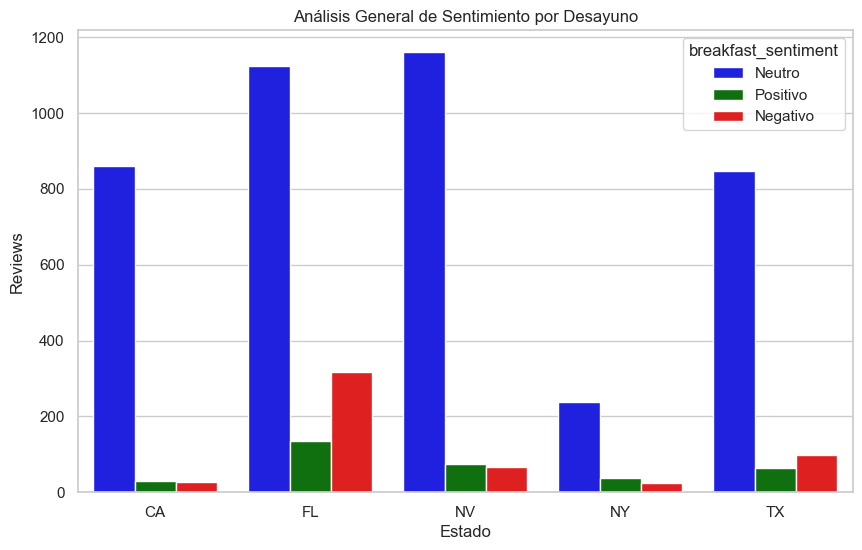

In [53]:
# Gráfico por breakfast_sentiment
# Crear una paleta de colores personalizada
colores = {'Neutro': 'blue', 'Positivo': 'green', 'Negativo': 'red'}
# Crear un gráfico de barras apiladas
sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))

# Agrupar por breakfast_sentiment y calcular la suma del conteo
databreak = cliente_filtrado.groupby(['state', 'lodging_name'])['breakfast_sentiment'].value_counts().reset_index(name='conteo')
# Definir los colores de las barras utilizando la columna 'Sentimiento'
databreak['Color'] = databreak['breakfast_sentiment'].map(colores)
# Crear el gráfico de barras apiladas
ax = sns.barplot(x='state', y='conteo', hue='breakfast_sentiment', data=databreak, palette=databreak['Color'])

# Personalizar el gráfico
plt.title('Análisis General de Sentimiento por Desayuno')
plt.xlabel('Estado')
plt.ylabel('Reviews')

# Mostrar el gráfico
plt.show()

### En cuanto a Desayuno, la alta neutralidad en todos los Hoteles indica que es un tema un poco menos importante para los huespedes. no obstante se resalta el alto negativo para el Hotel de Fl y en menor medida para los de Texas y Nevada.

/var/folders/7b/x372r2jn4b95xj0_xs49ys4h0000gn/T/ipykernel_13079/4131121227.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  rvm = cliente_filtrado.groupby(['month_name'])['rating'].agg(['mean', 'count']).sort_index()


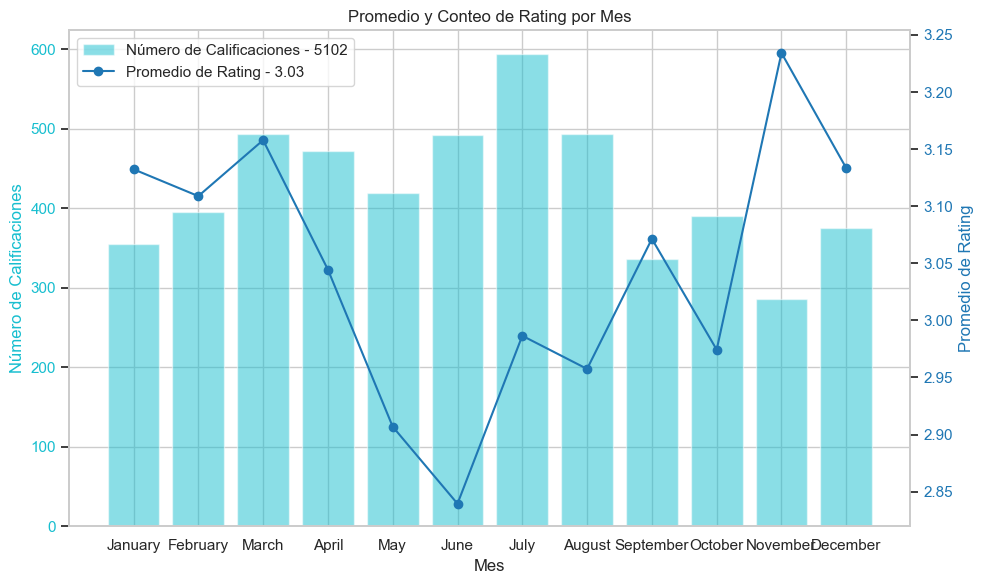

In [54]:
# Calcular el promedio del rating por mes y año en los hoteles de la compañía
rvm = cliente_filtrado.groupby(['month_name'])['rating'].agg(['mean', 'count']).sort_index()
rvm.reset_index()

# Calcular el conteo y promedio de calificaciones
contca = cliente_filtrado['rating'].count()
avgca = round(cliente_filtrado['rating'].mean(), 2)

# Crear una figura y ejes
fig, ax1 = plt.subplots(figsize=(10, 6))

# Configurar el primer eje y agregar el gráfico de barras para el conteo de ratings por mes
color = 'tab:cyan'
ax1.set_xlabel('Mes')
ax1.set_ylabel('Número de Calificaciones', color=color)
ax1.bar(rvm.index, rvm['count'], color=color, alpha=0.5, label=f'Número de Calificaciones - {contca}')
ax1.tick_params(axis='y', labelcolor=color)

# Crear un segundo eje compartiendo el mismo eje x
ax2 = ax1.twinx()

# Agregar el gráfico de línea para el promedio de rating por mes en el segundo eje
color = 'tab:blue'
ax2.set_ylabel('Promedio de Rating', color=color)
ax2.plot(rvm.index, rvm['mean'], marker='o', linestyle='-', color=color, label=f'Promedio de Rating - {avgca}')
ax2.tick_params(axis='y', labelcolor=color)

# Establecer título
plt.title('Promedio y Conteo de Rating por Mes')

# Rotar las etiquetas del eje x 90 grados
plt.xticks(rotation=90)

plt.tight_layout()

# Agregar una leyenda combinada para ambos ejes
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
lines = lines1 + lines2
labels = labels1 + labels2
ax1.legend(lines, labels, loc='upper left')

# Mostrar el gráfico
plt.grid()
plt.show()


En términos de promedio de rating según el mes, encontramos el pico más bajo en junio y la mejor calificación en Noviembre

In [55]:
cliente_filtrado['sentiment_score']

0       0.7003
1       0.9022
2       0.9292
3       0.2732
4      -0.7781
         ...  
8684    0.5553
8685   -0.6249
8686   -0.9345
8687   -0.9524
8688    0.9739
Name: sentiment_score, Length: 5102, dtype: float64

/var/folders/7b/x372r2jn4b95xj0_xs49ys4h0000gn/T/ipykernel_13079/574104510.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  rvm = cliente_filtrado.groupby(['month_name'])['sentiment_score'].agg(['mean', 'count']).sort_index()


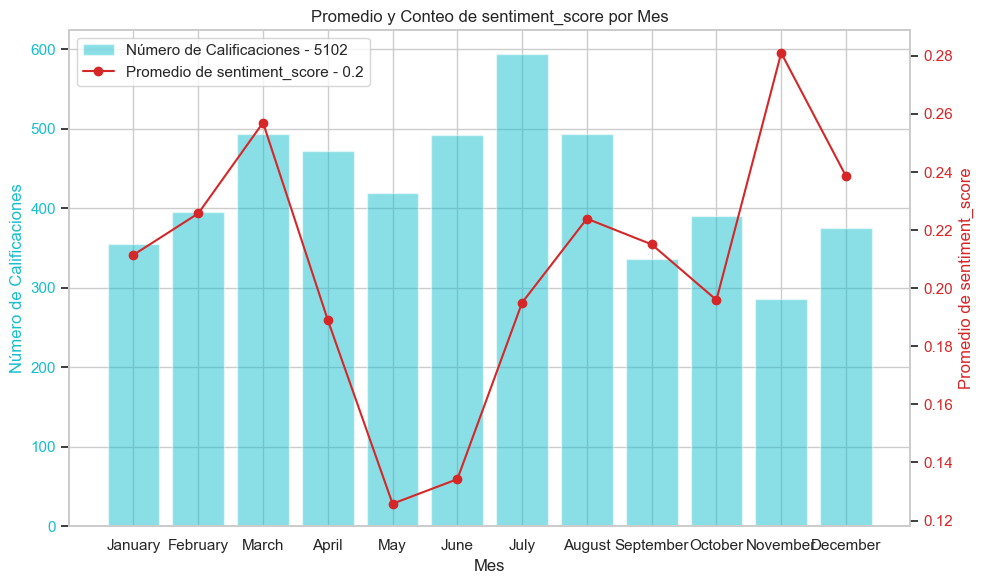

In [56]:
# Calcular el promedio del puntaje de sentimiento por mes en los hoteles de la compañía
rvm = cliente_filtrado.groupby(['month_name'])['sentiment_score'].agg(['mean', 'count']).sort_index()
rvm.reset_index()

# Calcular el conteo y promedio de calificaciones
contca = cliente_filtrado['sentiment_score'].count()
avgca = round(cliente_filtrado['sentiment_score'].mean(), 2)

# Crear una figura y ejes
fig, ax1 = plt.subplots(figsize=(10, 6))

# Configurar el primer eje y agregar el gráfico de barras para el conteo de ratings por mes
color = 'tab:cyan'
ax1.set_xlabel('Mes')
ax1.set_ylabel('Número de Calificaciones', color=color)
ax1.bar(rvm.index, rvm['count'], color=color, alpha=0.5, label=f'Número de Calificaciones - {contca}')
ax1.tick_params(axis='y', labelcolor=color)

# Crear un segundo eje compartiendo el mismo eje x
ax2 = ax1.twinx()

# Agregar el gráfico de línea para el promedio de rating por mes en el segundo eje
color = 'tab:red'
ax2.set_ylabel('Promedio de sentiment_score', color=color)
ax2.plot(rvm.index, rvm['mean'], marker='o', linestyle='-', color=color, label=f'Promedio de sentiment_score - {avgca}')
ax2.tick_params(axis='y', labelcolor=color)

# Establecer título
plt.title('Promedio y Conteo de sentiment_score por Mes')

# Rotar las etiquetas del eje x 90 grados
plt.xticks(rotation=90)

plt.tight_layout()

# Agregar una leyenda combinada para ambos ejes
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
lines = lines1 + lines2
labels = labels1 + labels2
ax1.legend(lines, labels, loc='upper left')

# Mostrar el gráfico
plt.grid()
plt.show()

En términos de promedio de sentiment_score según el mes, encontramos un comportamiento parecido al rating. No obstante el sentimiento puede calificarse como NEUTROj por su cercanía a 0

[nltk_data] Downloading package stopwords to /Users/hugo/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


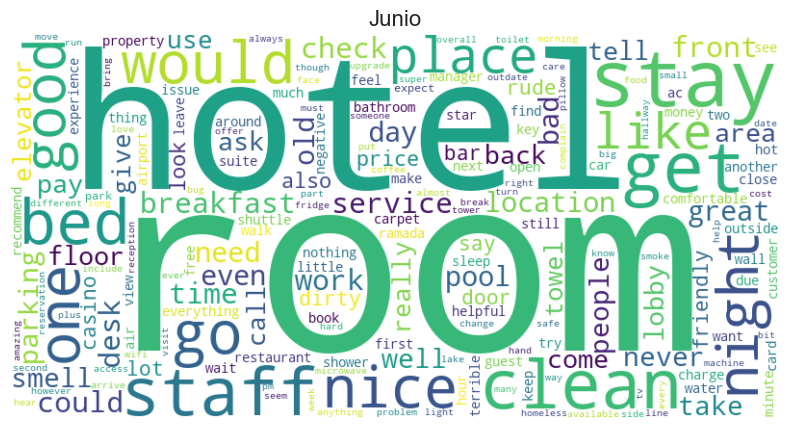

In [57]:
# Filtrar por Junio para hacer nube de palabras

junio = cliente_filtrado[cliente_filtrado['month']==6]
# tokenizando
text = junio['clean_review'].str.cat()
text = text.lower()  # Convierte a minúsculas
text = ''.join([c for c in text if c.isalpha() or c.isspace()])  # Elimina caracteres no alfabéticos
# Tokenización
nltk.download('stopwords')
words = nltk.word_tokenize(text)
stop_words = set(stopwords.words('english'))
words = [word for word in words if word not in stop_words]  # Elimina palabras vacías

# Análisis de frecuencia de palabras
freq_dist = nltk.FreqDist(words)

# Creación de la Word Cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(freq_dist)

# Visualización
plt.figure(figsize=(10, 5))
plt.title('Junio', fontsize=16)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

[nltk_data] Downloading package stopwords to /Users/hugo/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


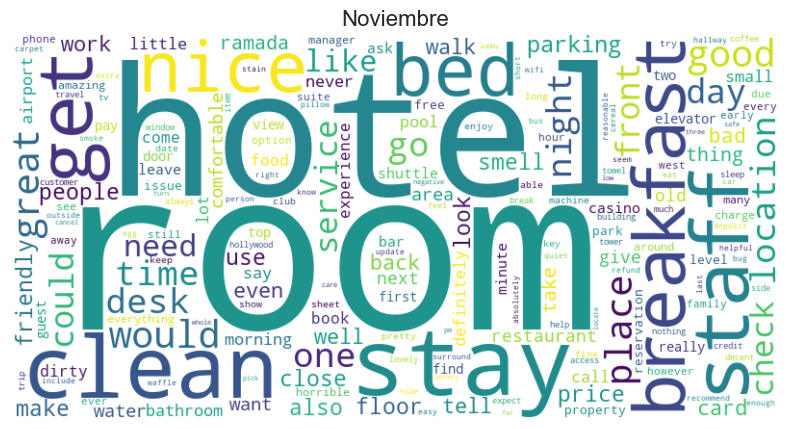

In [58]:
# Filtrar por Noviembre para hacer nube de palabras

noviembre = cliente_filtrado[cliente_filtrado['month']==11]
# tokenizando
text = noviembre['clean_review'].str.cat()
text = text.lower()  # Convierte a minúsculas
text = ''.join([c for c in text if c.isalpha() or c.isspace()])  # Elimina caracteres no alfabéticos
# Tokenización
nltk.download('stopwords')
words = nltk.word_tokenize(text)
stop_words = set(stopwords.words('english'))
words = [word for word in words if word not in stop_words]  # Elimina palabras vacías

# Análisis de frecuencia de palabras
freq_dist = nltk.FreqDist(words)

# Creación de la Word Cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(freq_dist)

# Visualización
plt.figure(figsize=(10, 5))
plt.title('Noviembre', fontsize=16)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a futu

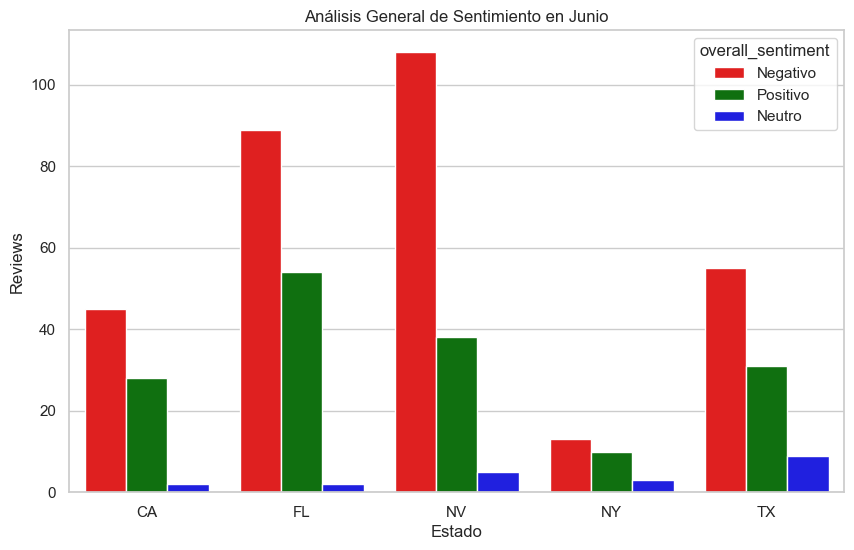

In [59]:
# Gráfico por sentimiento General en el mes de Junio
# Crear una paleta de colores personalizada
colores = {'Neutro': 'blue', 'Positivo': 'green', 'Negativo': 'red'}
# Crear un gráfico de barras apiladas
sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))

# Agrupar por 'state' y 'overall_sentiment' y calcular la suma del conteo
dataov = junio.groupby(['state', 'lodging_name'])['overall_sentiment'].value_counts().reset_index(name='conteo')
dataov['Color'] = dataov['overall_sentiment'].map(colores)
# Crear el gráfico de barras apiladas
ax = sns.barplot(x='state', y='conteo', hue='overall_sentiment', data=dataov, palette=dataov['Color'])

# Personalizar el gráfico
plt.title('Análisis General de Sentimiento en Junio')
plt.xlabel('Estado')
plt.ylabel('Reviews')

# Mostrar el gráfico
plt.show()

/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a futu

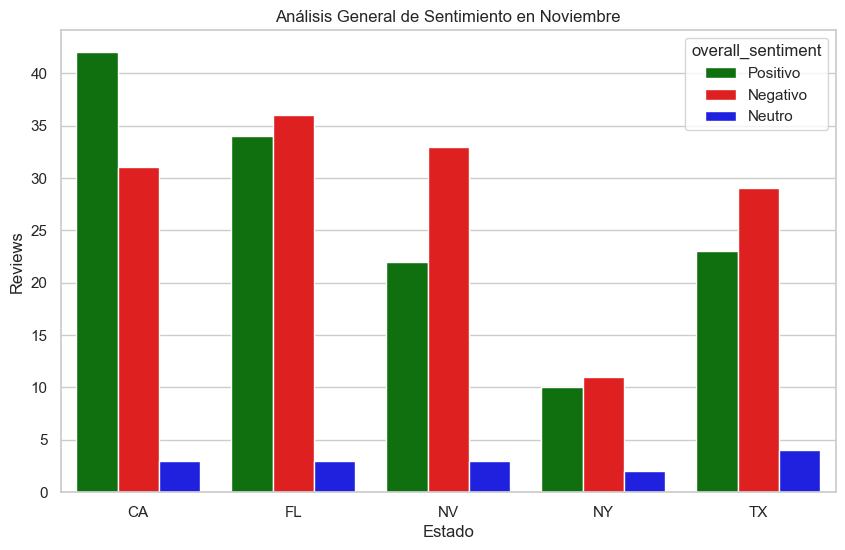

In [60]:
# Gráfico por sentimiento General en el mes de Noviembre
# Crear una paleta de colores personalizada
colores = {'Neutro': 'blue', 'Positivo': 'green', 'Negativo': 'red'}
# Crear un gráfico de barras apiladas
sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))

# Agrupar por 'state' y 'overall_sentiment' y calcular la suma del conteo
dataov = noviembre.groupby(['state', 'lodging_name'])['overall_sentiment'].value_counts().reset_index(name='conteo')
dataov['Color'] = dataov['overall_sentiment'].map(colores)
# Crear el gráfico de barras apiladas
ax = sns.barplot(x='state', y='conteo', hue='overall_sentiment', data=dataov, palette=dataov['Color'])

# Personalizar el gráfico
plt.title('Análisis General de Sentimiento en Noviembre')
plt.xlabel('Estado')
plt.ylabel('Reviews')

# Mostrar el gráfico
plt.show()

Efectivamente se observa más reviews y rating negativo en el mes de Junio y comentarios y rating más positivo en el mes de Diciembre.
Debe investigarse que es lo que afecta el estado de anímo de los huespedes y cuales son los puntos a mejorar en los meses de menor satisfacción. Así mismo afianzar las fortalezas de los meses de mayor satisfacción

/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a futu

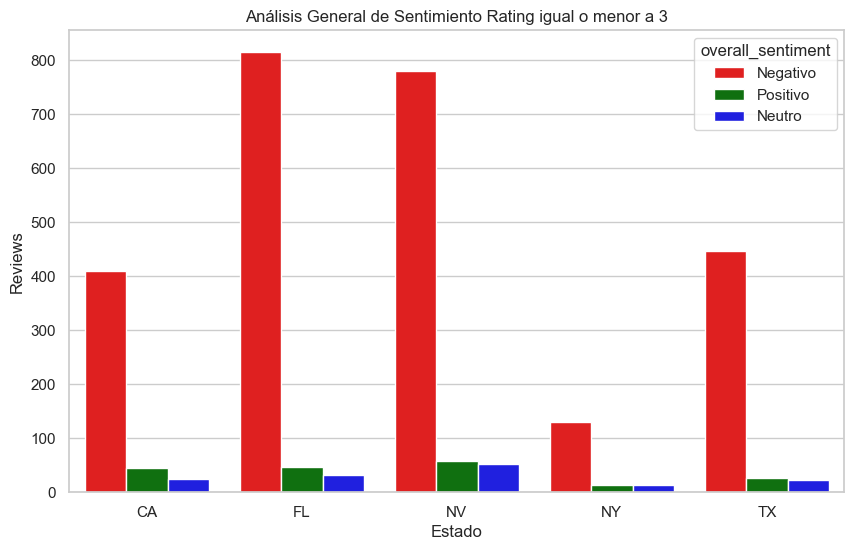

In [61]:
neg = cliente_filtrado[cliente_filtrado['rating'] <= 3]
# Gráfico por sentimiento General en el mes de Junio
# Crear una paleta de colores personalizada
colores = {'Neutro': 'blue', 'Positivo': 'green', 'Negativo': 'red'}
# Crear un gráfico de barras apiladas
sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))

# Agrupar por 'state' y 'overall_sentiment' y calcular la suma del conteo
dataov = neg.groupby(['state', 'lodging_name'])['overall_sentiment'].value_counts().reset_index(name='conteo')
dataov['Color'] = dataov['overall_sentiment'].map(colores)
# Crear el gráfico de barras apiladas
ax = sns.barplot(x='state', y='conteo', hue='overall_sentiment', data=dataov, palette=dataov['Color'])

# Personalizar el gráfico
plt.title('Análisis General de Sentimiento Rating igual o menor a 3')
plt.xlabel('Estado')
plt.ylabel('Reviews')

# Mostrar el gráfico
plt.show()

In [62]:
neg.shape

(2919, 21)

/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a futu

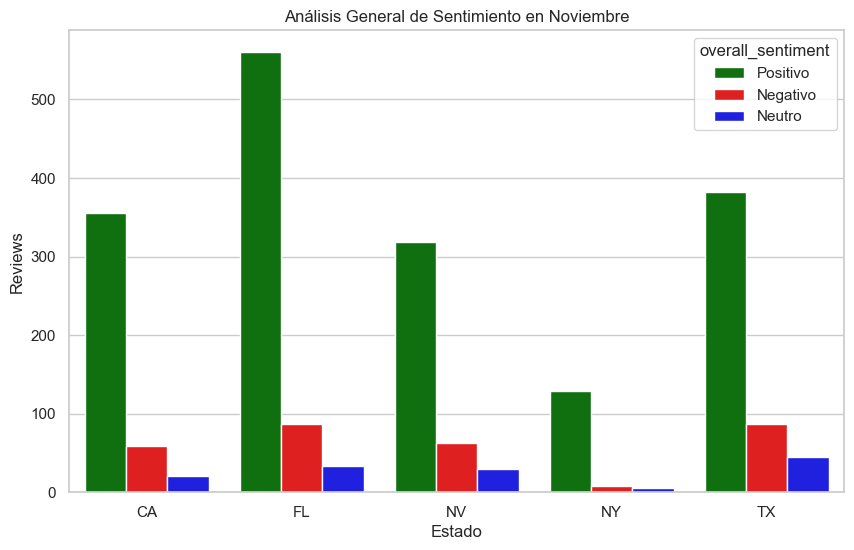

In [63]:
pos = cliente_filtrado[cliente_filtrado['rating'] > 3]
# Gráfico por sentimiento General en el mes de Junio
# Crear una paleta de colores personalizada
colores = {'Neutro': 'blue', 'Positivo': 'green', 'Negativo': 'red'}
# Crear un gráfico de barras apiladas
sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))

# Agrupar por 'state' y 'overall_sentiment' y calcular la suma del conteo
dataov = pos.groupby(['state', 'lodging_name'])['overall_sentiment'].value_counts().reset_index(name='conteo')
dataov['Color'] = dataov['overall_sentiment'].map(colores)
# Crear el gráfico de barras apiladas
ax = sns.barplot(x='state', y='conteo', hue='overall_sentiment', data=dataov, palette=dataov['Color'])

# Personalizar el gráfico
plt.title('Análisis General de Sentimiento en Noviembre')
plt.xlabel('Estado')
plt.ylabel('Reviews')

# Mostrar el gráfico
plt.show()

In [64]:
pos.shape

(2183, 21)

El rating entre 1 y 3 es considerado como una calificación mala, teniendo en cuenta que viene acompañado de reviews con sentimiento negativo.
El rating entre 4 y 5 es considerado como una calificación buena, viene acompañado de reviews con sentimiento positivo

# KPI 1

    Reviews positivas: porcentaje de reviews positivas según el rating. Esto permite entender la satisfacción general de los huéspedes.

% Reviews positivas=  (Cantidad reviews positivas)/(Cantidad total reviews)*100


In [65]:
len(cliente_filtrado[cliente_filtrado['rating'] > 3])/len(cliente_filtrado['review'])

0.42787142297138375

# KPI 2

	Reviews negativas: 
Así como las positivas, medir las reviews negativas ayuda a identificar los aspectos que generan insatisfacción en los huéspedes.

% Reviews negativas=  (Cantidad reviews negativas)/(Cantidad total de reviews)*100


In [66]:
len(cliente_filtrado[cliente_filtrado['rating'] < 3])/len(cliente_filtrado['review'])

0.39592316738533906

In [67]:
len(cliente_filtrado[cliente_filtrado['rating'] == 3])/len(cliente_filtrado['review'])

0.17620540964327713

In [68]:
# Calcular las proporciones
proporcion_positivo = len(cliente_filtrado[cliente_filtrado['rating'] > 3])/len(cliente_filtrado['review'])
proporcion_neutro = len(cliente_filtrado[cliente_filtrado['rating'] == 3])/len(cliente_filtrado['review'])
proporcion_negativo = len(cliente_filtrado[cliente_filtrado['rating'] < 3])/len(cliente_filtrado['review'])


# Crear un DataFrame con las proporciones
data = {'Sentimiento': ['Neutro', 'Negativo', 'Positivo'],
        'Proporcion': [proporcion_neutro, proporcion_negativo, proporcion_positivo]}

df_proporcionesrv = pd.DataFrame(data)

# Ahora 'df_proporciones' contiene las proporciones calculadas
df_proporcionesrv

,Sentimiento,Proporcion
0,Neutro,0.176205
1,Negativo,0.395923
2,Positivo,0.427871


# GRÁFICO KPIS 1 Y 2

/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


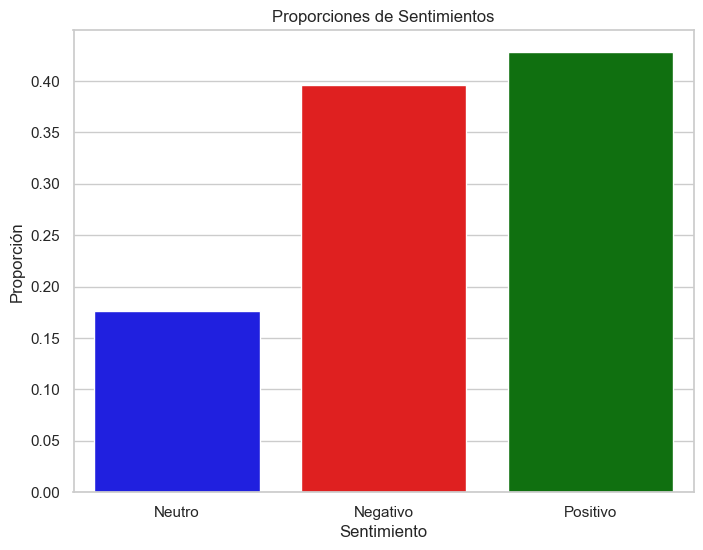

In [69]:
# Crear un gráfico de barras
sns.set(style="whitegrid")
plt.figure(figsize=(8, 6))
# Crear una paleta de colores personalizada
colores = {'Neutro': 'blue', 'Positivo': 'green', 'Negativo': 'red'}
# Definir los colores de las barras utilizando la columna 'Sentimiento'
df_proporcionesrv['Color'] = df_proporcionesrv['Sentimiento'].map(colores)
# Usar seaborn para crear el gráfico de barras
sns.barplot(x='Sentimiento', y='Proporcion', data=df_proporcionesrv, palette=df_proporcionesrv['Color'])

# Personalizar el gráfico
plt.title('Proporciones de Sentimientos')
plt.xlabel('Sentimiento')
plt.ylabel('Proporción')

# Mostrar el gráfico
plt.show()

# KPI 3

	Promedio de sentimiento: 
Puntuación promedio de sentimiento de las reviews, asignando valores a las palabras clave o frases, que reflejen emociones positivas o negativas, permite medir el nivel general de satisfacción y detectar tendencias.

Puntuacion promedio de sentimiento=  (∑▒〖Puntuación de sentimiento〗)/(Cantidad total de reviews)


In [70]:
cliente_filtrado['sentiment_score'].sum() / len(cliente_filtrado['review'])

0.20467120736965896

In [71]:
cliente_filtrado['sentiment_score'].mean()

0.20467120736965896

En general el promedio de sentimiento de las reviews de los 5 hoteles es Neutro, debido a que está más cerca a 0 que a 1

# KPI 4

	Ratio por categoría de servicio: 
Analizar las reviews en función de las diferentes categorías de servicios del hotel ayuda a identificar las áreas específicas que están generando más comentarios emocionales.
Las categorías serían: comodidad de habitación, desayuno, limpieza y atención al cliente.


Habitación

In [72]:
# Calcular las proporciones
proporcion_neutro = len(cliente_filtrado[cliente_filtrado['room_sentiment'] == 'Neutro'])/len(cliente_filtrado['review'])
proporcion_negativo = len(cliente_filtrado[cliente_filtrado['room_sentiment'] == 'Negativo'])/len(cliente_filtrado['review'])
proporcion_positivo = len(cliente_filtrado[cliente_filtrado['room_sentiment'] == 'Positivo'])/len(cliente_filtrado['review'])

# Crear un DataFrame con las proporciones
data = {'Sentimiento': ['Neutro', 'Negativo', 'Positivo'],
        'Proporcion': [proporcion_neutro, proporcion_negativo, proporcion_positivo]}

df_proporciones = pd.DataFrame(data)

# Ahora 'df_proporciones' contiene las proporciones calculadas
df_proporciones

,Sentimiento,Proporcion
0,Neutro,0.329675
1,Negativo,0.394943
2,Positivo,0.275382


/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


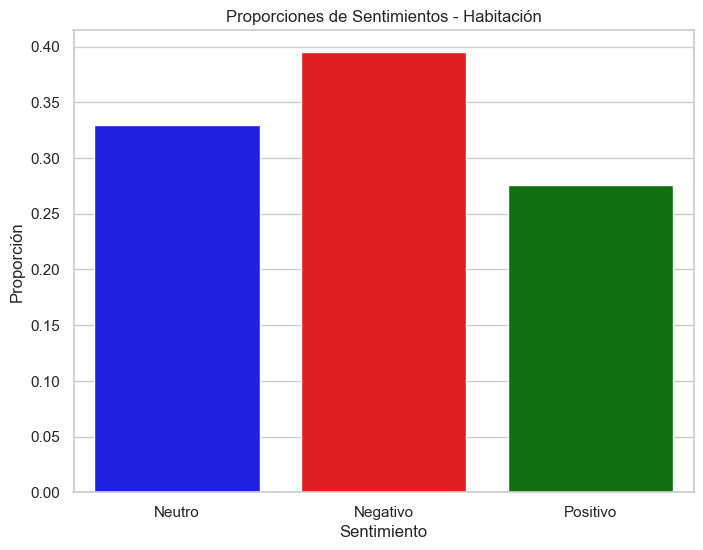

In [73]:
# Crear una paleta de colores personalizada
colores = {'Neutro': 'blue', 'Positivo': 'green', 'Negativo': 'red'}

# Definir los colores de las barras utilizando la columna 'Sentimiento'
df_proporciones['Color'] = df_proporciones['Sentimiento'].map(colores)

# Configurar el estilo de Seaborn
sns.set(style="whitegrid")

# Crear el gráfico de barras utilizando la paleta personalizada
plt.figure(figsize=(8, 6))
sns.barplot(x='Sentimiento', y='Proporcion', data=df_proporciones, palette=df_proporciones['Color'])

# Personalizar el gráfico
plt.title('Proporciones de Sentimientos - Habitación')
plt.xlabel('Sentimiento')
plt.ylabel('Proporción')

# Mostrar el gráfico
plt.show()

Servicio

In [74]:
# Calcular las proporciones
proporcion_neutro = len(cliente_filtrado[cliente_filtrado['guest_service_sentiment'] == 'Neutro'])/len(cliente_filtrado['review'])
proporcion_negativo = len(cliente_filtrado[cliente_filtrado['guest_service_sentiment'] == 'Negativo'])/len(cliente_filtrado['review'])
proporcion_positivo = len(cliente_filtrado[cliente_filtrado['guest_service_sentiment'] == 'Positivo'])/len(cliente_filtrado['review'])

# Crear un DataFrame con las proporciones
data = {'Sentimiento': ['Neutro', 'Negativo', 'Positivo'],
        'Proporcion': [proporcion_neutro, proporcion_negativo, proporcion_positivo]}

df_proporciones = pd.DataFrame(data)

# Ahora 'df_proporciones' contiene las proporciones calculadas
df_proporciones

,Sentimiento,Proporcion
0,Neutro,0.454920
1,Negativo,0.245394
2,Positivo,0.299686


/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


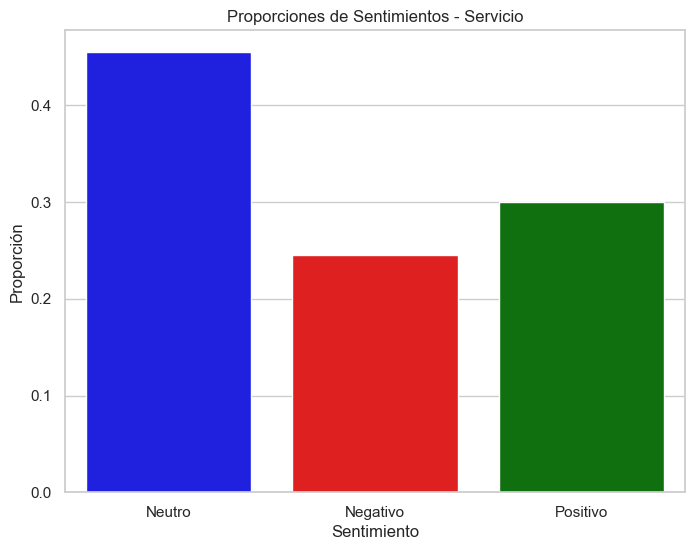

In [75]:
# Crear una paleta de colores personalizada
colores = {'Neutro': 'blue', 'Positivo': 'green', 'Negativo': 'red'}

# Definir los colores de las barras utilizando la columna 'Sentimiento'
df_proporciones['Color'] = df_proporciones['Sentimiento'].map(colores)

# Configurar el estilo de Seaborn
sns.set(style="whitegrid")

# Crear el gráfico de barras utilizando la paleta personalizada
plt.figure(figsize=(8, 6))
sns.barplot(x='Sentimiento', y='Proporcion', data=df_proporciones, palette=df_proporciones['Color'])

# Personalizar el gráfico
plt.title('Proporciones de Sentimientos - Servicio')
plt.xlabel('Sentimiento')
plt.ylabel('Proporción')

# Mostrar el gráfico
plt.show()

Limpieza

In [76]:
# Calcular las proporciones
proporcion_neutro = len(cliente_filtrado[cliente_filtrado['cleaning_sentiment'] == 'Neutro'])/len(cliente_filtrado['review'])
proporcion_negativo = len(cliente_filtrado[cliente_filtrado['cleaning_sentiment'] == 'Negativo'])/len(cliente_filtrado['review'])
proporcion_positivo = len(cliente_filtrado[cliente_filtrado['cleaning_sentiment'] == 'Positivo'])/len(cliente_filtrado['review'])

# Crear un DataFrame con las proporciones
data = {'Sentimiento': ['Neutro', 'Negativo', 'Positivo'],
        'Proporcion': [proporcion_neutro, proporcion_negativo, proporcion_positivo]}

df_proporciones = pd.DataFrame(data)

# Ahora 'df_proporciones' contiene las proporciones calculadas
df_proporciones

,Sentimiento,Proporcion
0,Neutro,0.403763
1,Negativo,0.361427
2,Positivo,0.234810


/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


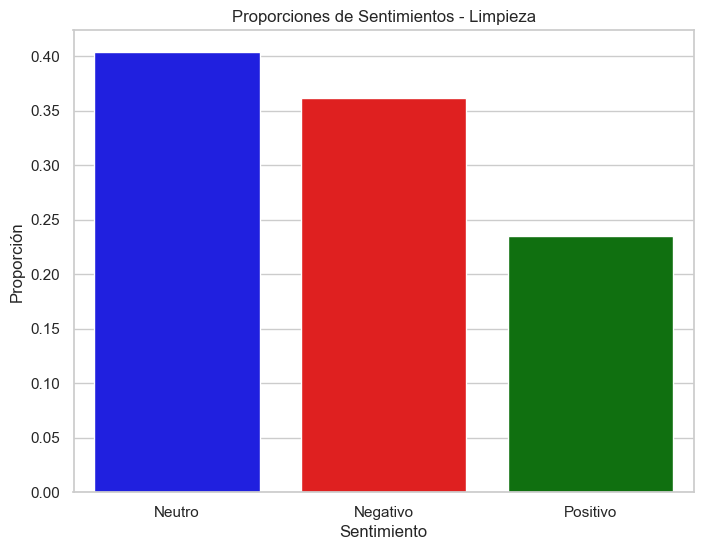

In [77]:
# Crear una paleta de colores personalizada
colores = {'Neutro': 'blue', 'Positivo': 'green', 'Negativo': 'red'}

# Definir los colores de las barras utilizando la columna 'Sentimiento'
df_proporciones['Color'] = df_proporciones['Sentimiento'].map(colores)

# Configurar el estilo de Seaborn
sns.set(style="whitegrid")

# Crear el gráfico de barras utilizando la paleta personalizada
plt.figure(figsize=(8, 6))
sns.barplot(x='Sentimiento', y='Proporcion', data=df_proporciones, palette=df_proporciones['Color'])

# Personalizar el gráfico
plt.title('Proporciones de Sentimientos - Limpieza')
plt.xlabel('Sentimiento')
plt.ylabel('Proporción')

# Mostrar el gráfico
plt.show()

Desayuno

In [78]:
# Calcular las proporciones
proporcion_neutro = len(cliente_filtrado[cliente_filtrado['breakfast_sentiment'] == 'Neutro'])/len(cliente_filtrado['review'])
proporcion_negativo = len(cliente_filtrado[cliente_filtrado['breakfast_sentiment'] == 'Negativo'])/len(cliente_filtrado['review'])
proporcion_positivo = len(cliente_filtrado[cliente_filtrado['breakfast_sentiment'] == 'Positivo'])/len(cliente_filtrado['review'])

# Crear un DataFrame con las proporciones
data = {'Sentimiento': ['Neutro', 'Negativo', 'Positivo'],
        'Proporcion': [proporcion_neutro, proporcion_negativo, proporcion_positivo]}

df_proporciones = pd.DataFrame(data)

# Ahora 'df_proporciones' contiene las proporciones calculadas
df_proporciones

,Sentimiento,Proporcion
0,Neutro,0.828695
1,Negativo,0.104273
2,Positivo,0.067033


/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


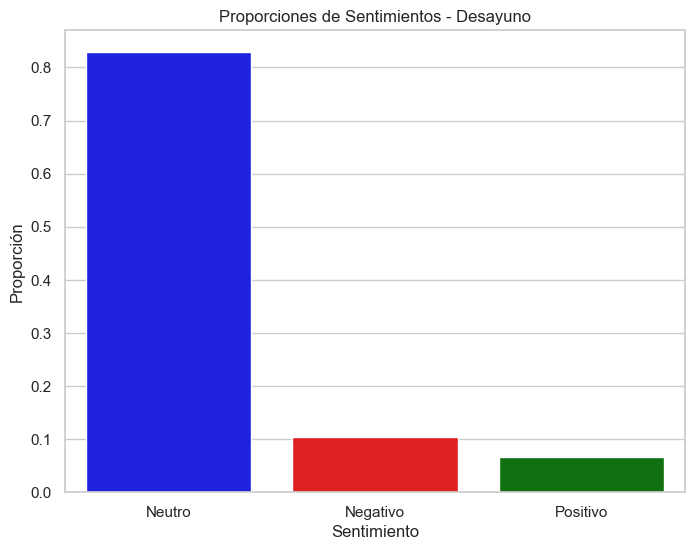

In [79]:
# Crear una paleta de colores personalizada
colores = {'Neutro': 'blue', 'Positivo': 'green', 'Negativo': 'red'}

# Definir los colores de las barras utilizando la columna 'Sentimiento'
df_proporciones['Color'] = df_proporciones['Sentimiento'].map(colores)

# Configurar el estilo de Seaborn
sns.set(style="whitegrid")

# Crear el gráfico de barras utilizando la paleta personalizada
plt.figure(figsize=(8, 6))
sns.barplot(x='Sentimiento', y='Proporcion', data=df_proporciones, palette=df_proporciones['Color'])

# Personalizar el gráfico
plt.title('Proporciones de Sentimientos - Desayuno')
plt.xlabel('Sentimiento')
plt.ylabel('Proporción')

# Mostrar el gráfico
plt.show()

# KPI 5

	Comparación de sentimiento: Comparar el sentimiento de las reviews de tu hotel con el de los competidores directos proporciona una visión comparativa y ayuda a identificar áreas en las que se puede aprender de la competencia o destacar por encima de ella.


Ratio de promedios de nuestro cliente sobre competencia

=  (Promedio de sentimiento de nuestro cliente)/(Promedio de sentimiento de la competencia)



In [80]:
# filtrar clientes de la competencia

competencia = model[~model['lodging_name'].isin(cliente)].copy()
competencia.shape

(3947, 21)

In [81]:
cl = cliente_filtrado['sentiment_score'].mean() 
com = competencia['sentiment_score'].mean()

# Crear un DataFrame con las proporciones
data = {'Holetes': ['Cliente', 'Competencia'],
        'Avg_Sentimiento': [cl, com]}

ratio = pd.DataFrame(data)

# Ahora 'df_proporciones' contiene las proporciones calculadas
ratio

,Holetes,Avg_Sentimiento
0,Cliente,0.204671
1,Competencia,0.445045


# KPIS análizando los hoteles de nuestro cliente uno por uno

# Ramada by Wyndham Reno Hotel & Casino - NV

In [82]:
nv = model[model['lodging_name']==(cliente[0])]

## Nube de palabras

[nltk_data] Downloading package stopwords to /Users/hugo/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


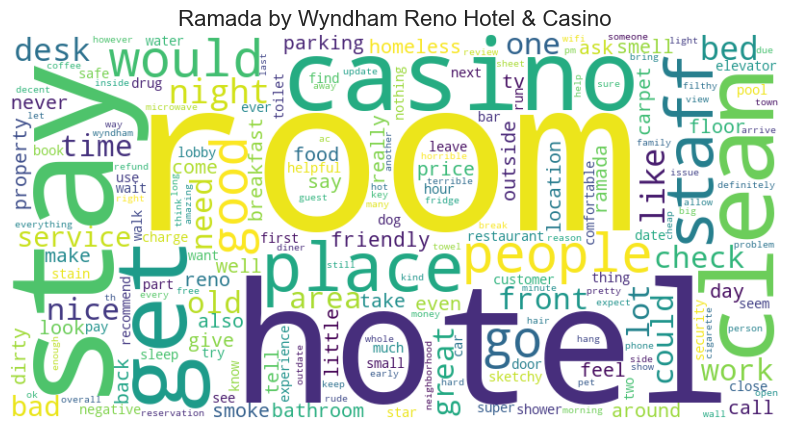

In [83]:
# tokenizando
text = nv['clean_review'].str.cat()
text = text.lower()  # Convierte a minúsculas
text = ''.join([c for c in text if c.isalpha() or c.isspace()])  # Elimina caracteres no alfabéticos
# Tokenización
nltk.download('stopwords')
words = nltk.word_tokenize(text)
stop_words = set(stopwords.words('english'))
words = [word for word in words if word not in stop_words]  # Elimina palabras vacías

# Análisis de frecuencia de palabras
freq_dist = nltk.FreqDist(words)

# Creación de la Word Cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(freq_dist)

# Visualización
plt.figure(figsize=(10, 5))
plt.title('Ramada by Wyndham Reno Hotel & Casino', fontsize=16)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

# KPI 1

    Reviews positivas: porcentaje de reviews positivas según el rating. Esto permite entender la satisfacción general de los huéspedes.

% Reviews positivas=  (Cantidad reviews positivas)/(Cantidad total reviews)*100

In [84]:
len(nv[nv['rating'] > 3])/len(nv['review'])

0.3159108378170638

# KPI 2

	Reviews negativas: 
Así como las positivas, medir las reviews negativas ayuda a identificar los aspectos que generan insatisfacción en los huéspedes.

% Reviews negativas=  (Cantidad reviews negativas)/(Cantidad total de reviews)*100

In [85]:
len(nv[nv['rating'] < 3])/len(nv['review'])

0.504227517294389

In [86]:
# Calcular las proporciones
proporcion_positivo = len(nv[nv['rating'] > 3])/len(nv['review'])
proporcion_neutro = len(nv[nv['rating'] == 3])/len(nv['review'])
proporcion_negativo = len(nv[nv['rating'] < 3])/len(nv['review'])


# Crear un DataFrame con las proporciones
data = {'Sentimiento': ['Neutro', 'Negativo', 'Positivo'],
        'Proporcion': [proporcion_neutro, proporcion_negativo, proporcion_positivo]}

df_proporcionesrv = pd.DataFrame(data)

# Ahora 'df_proporciones' contiene las proporciones calculadas
df_proporcionesrv

,Sentimiento,Proporcion
0,Neutro,0.179862
1,Negativo,0.504228
2,Positivo,0.315911


# GRÁFICO KPIS 1 Y 2

/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


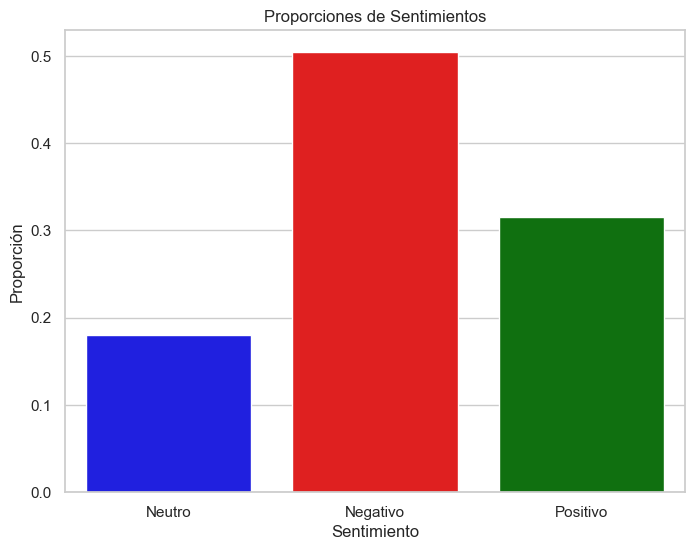

In [87]:
# Crear un gráfico de barras
sns.set(style="whitegrid")
plt.figure(figsize=(8, 6))
# Crear una paleta de colores personalizada
colores = {'Neutro': 'blue', 'Positivo': 'green', 'Negativo': 'red'}
# Definir los colores de las barras utilizando la columna 'Sentimiento'
df_proporcionesrv['Color'] = df_proporcionesrv['Sentimiento'].map(colores)
# Usar seaborn para crear el gráfico de barras
sns.barplot(x='Sentimiento', y='Proporcion', data=df_proporcionesrv, palette=df_proporcionesrv['Color'])

# Personalizar el gráfico
plt.title('Proporciones de Sentimientos')
plt.xlabel('Sentimiento')
plt.ylabel('Proporción')

# Mostrar el gráfico
plt.show()

# KPI 3

	Promedio de sentimiento: 
Puntuación promedio de sentimiento de las reviews, asignando valores a las palabras clave o frases, que reflejen emociones positivas o negativas, permite medir el nivel general de satisfacción y detectar tendencias.

Puntuacion promedio de sentimiento=  (∑▒〖Puntuación de sentimiento〗)/(Cantidad total de reviews)

In [88]:
nv['sentiment_score'].mean()

0.13597886241352805

# KPI 4

	Ratio por categoría de servicio: 
Analizar las reviews en función de las diferentes categorías de servicios del hotel ayuda a identificar las áreas específicas que están generando más comentarios emocionales.
Las categorías serían: comodidad de habitación, desayuno, limpieza y atención al cliente.

Habitación

In [89]:
# Calcular las proporciones
proporcion_neutro = len(nv[nv['room_sentiment'] == 'Neutro'])/len(nv['review'])
proporcion_negativo = len(nv[nv['room_sentiment'] == 'Negativo'])/len(nv['review'])
proporcion_positivo = len(nv[nv['room_sentiment'] == 'Positivo'])/len(nv['review'])

# Crear un DataFrame con las proporciones
data = {'Sentimiento': ['Neutro', 'Negativo', 'Positivo'],
        'Proporcion': [proporcion_neutro, proporcion_negativo, proporcion_positivo]}

df_proporciones = pd.DataFrame(data)

# Ahora 'df_proporciones' contiene las proporciones calculadas
df_proporciones

,Sentimiento,Proporcion
0,Neutro,0.382014
1,Negativo,0.415065
2,Positivo,0.202921


/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


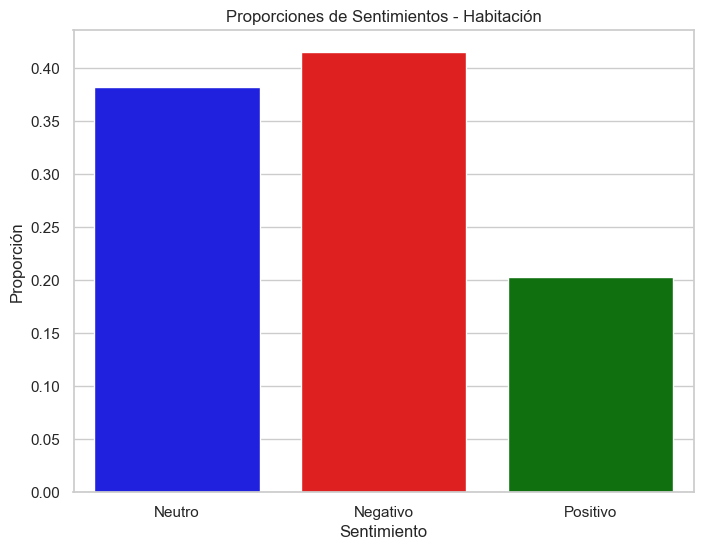

In [90]:
# Crear una paleta de colores personalizada
colores = {'Neutro': 'blue', 'Positivo': 'green', 'Negativo': 'red'}

# Definir los colores de las barras utilizando la columna 'Sentimiento'
df_proporciones['Color'] = df_proporciones['Sentimiento'].map(colores)

# Configurar el estilo de Seaborn
sns.set(style="whitegrid")

# Crear el gráfico de barras utilizando la paleta personalizada
plt.figure(figsize=(8, 6))
sns.barplot(x='Sentimiento', y='Proporcion', data=df_proporciones, palette=df_proporciones['Color'])

# Personalizar el gráfico
plt.title('Proporciones de Sentimientos - Habitación')
plt.xlabel('Sentimiento')
plt.ylabel('Proporción')

# Mostrar el gráfico
plt.show()

Servicio

In [91]:
# Calcular las proporciones
proporcion_neutro = len(nv[nv['guest_service_sentiment'] == 'Neutro'])/len(nv['review'])
proporcion_negativo = len(nv[nv['guest_service_sentiment'] == 'Negativo'])/len(nv['review'])
proporcion_positivo = len(nv[nv['guest_service_sentiment'] == 'Positivo'])/len(nv['review'])

# Crear un DataFrame con las proporciones
data = {'Sentimiento': ['Neutro', 'Negativo', 'Positivo'],
        'Proporcion': [proporcion_neutro, proporcion_negativo, proporcion_positivo]}

df_proporciones = pd.DataFrame(data)

# Ahora 'df_proporciones' contiene las proporciones calculadas
df_proporciones

,Sentimiento,Proporcion
0,Neutro,0.477325
1,Negativo,0.222137
2,Positivo,0.300538


/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


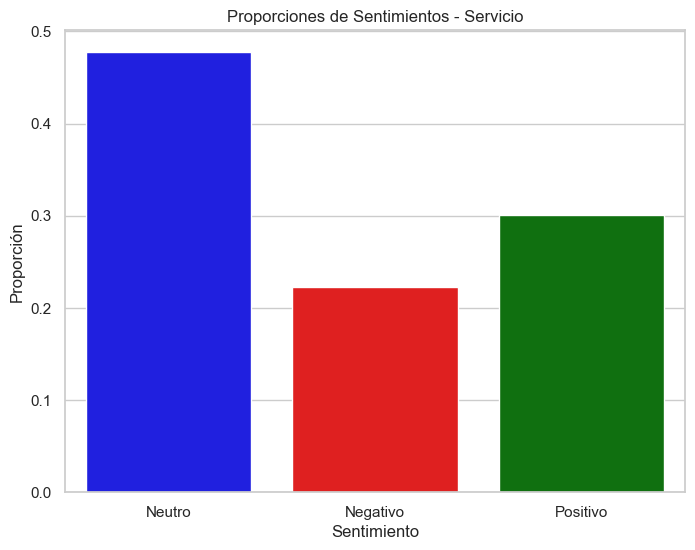

In [92]:
# Crear una paleta de colores personalizada
colores = {'Neutro': 'blue', 'Positivo': 'green', 'Negativo': 'red'}

# Definir los colores de las barras utilizando la columna 'Sentimiento'
df_proporciones['Color'] = df_proporciones['Sentimiento'].map(colores)

# Configurar el estilo de Seaborn
sns.set(style="whitegrid")

# Crear el gráfico de barras utilizando la paleta personalizada
plt.figure(figsize=(8, 6))
sns.barplot(x='Sentimiento', y='Proporcion', data=df_proporciones, palette=df_proporciones['Color'])

# Personalizar el gráfico
plt.title('Proporciones de Sentimientos - Servicio')
plt.xlabel('Sentimiento')
plt.ylabel('Proporción')

# Mostrar el gráfico
plt.show()

Limpieza

In [93]:
# Calcular las proporciones
proporcion_neutro = len(nv[nv['cleaning_sentiment'] == 'Neutro'])/len(nv['review'])
proporcion_negativo = len(nv[nv['cleaning_sentiment'] == 'Negativo'])/len(nv['review'])
proporcion_positivo = len(nv[nv['cleaning_sentiment'] == 'Positivo'])/len(nv['review'])

# Crear un DataFrame con las proporciones
data = {'Sentimiento': ['Neutro', 'Negativo', 'Positivo'],
        'Proporcion': [proporcion_neutro, proporcion_negativo, proporcion_positivo]}

df_proporciones = pd.DataFrame(data)

# Ahora 'df_proporciones' contiene las proporciones calculadas
df_proporciones

,Sentimiento,Proporcion
0,Neutro,0.427364
1,Negativo,0.399693
2,Positivo,0.172944


/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


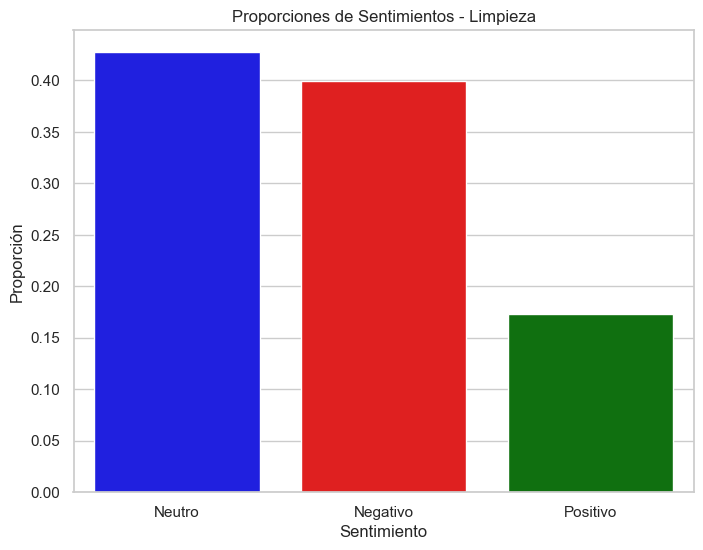

In [94]:
# Crear una paleta de colores personalizada
colores = {'Neutro': 'blue', 'Positivo': 'green', 'Negativo': 'red'}

# Definir los colores de las barras utilizando la columna 'Sentimiento'
df_proporciones['Color'] = df_proporciones['Sentimiento'].map(colores)

# Configurar el estilo de Seaborn
sns.set(style="whitegrid")

# Crear el gráfico de barras utilizando la paleta personalizada
plt.figure(figsize=(8, 6))
sns.barplot(x='Sentimiento', y='Proporcion', data=df_proporciones, palette=df_proporciones['Color'])

# Personalizar el gráfico
plt.title('Proporciones de Sentimientos - Limpieza')
plt.xlabel('Sentimiento')
plt.ylabel('Proporción')

# Mostrar el gráfico
plt.show()

Desayuno

In [95]:
# Calcular las proporciones
proporcion_neutro = len(nv[nv['breakfast_sentiment'] == 'Neutro'])/len(nv['review'])
proporcion_negativo = len(nv[nv['breakfast_sentiment'] == 'Negativo'])/len(nv['review'])
proporcion_positivo = len(nv[nv['breakfast_sentiment'] == 'Positivo'])/len(nv['review'])

# Crear un DataFrame con las proporciones
data = {'Sentimiento': ['Neutro', 'Negativo', 'Positivo'],
        'Proporcion': [proporcion_neutro, proporcion_negativo, proporcion_positivo]}

df_proporciones = pd.DataFrame(data)

# Ahora 'df_proporciones' contiene las proporciones calculadas
df_proporciones

,Sentimiento,Proporcion
0,Neutro,0.891622
1,Negativo,0.050730
2,Positivo,0.057648


/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


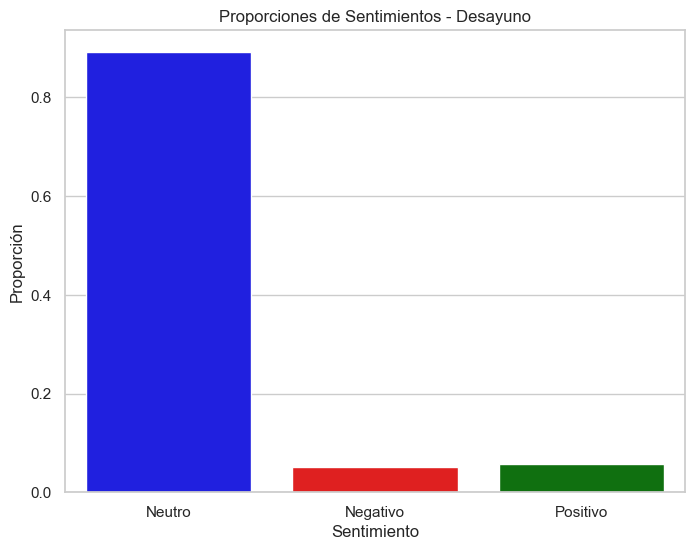

In [96]:
# Crear una paleta de colores personalizada
colores = {'Neutro': 'blue', 'Positivo': 'green', 'Negativo': 'red'}

# Definir los colores de las barras utilizando la columna 'Sentimiento'
df_proporciones['Color'] = df_proporciones['Sentimiento'].map(colores)

# Configurar el estilo de Seaborn
sns.set(style="whitegrid")

# Crear el gráfico de barras utilizando la paleta personalizada
plt.figure(figsize=(8, 6))
sns.barplot(x='Sentimiento', y='Proporcion', data=df_proporciones, palette=df_proporciones['Color'])

# Personalizar el gráfico
plt.title('Proporciones de Sentimientos - Desayuno')
plt.xlabel('Sentimiento')
plt.ylabel('Proporción')

# Mostrar el gráfico
plt.show()

# KPI 5

	Comparación de sentimiento: Comparar el sentimiento de las reviews de tu hotel con el de los competidores directos proporciona una visión comparativa y ayuda a identificar áreas en las que se puede aprender de la competencia o destacar por encima de ella.


Ratio de promedios de nuestro cliente sobre competencia

=  (Promedio de sentimiento de nuestro cliente)/(Promedio de sentimiento de la competencia)

In [97]:
# filtrar clientes de la competencia

competencianv = model[(model['state'] == 'NV') & (model['lodging_name'] != cliente[0])]
competencianv.shape

(390, 21)

In [98]:
clnv = nv['sentiment_score'].mean() 
comnv = competencianv['sentiment_score'].mean()

# Crear un DataFrame con las proporciones
data = {'Holetes': ['Cliente', 'Competencia'],
        'Avg_Sentimiento': [clnv, comnv]}

ratio = pd.DataFrame(data)

# Ahora 'ratio' contiene las proporciones calculadas
ratio

,Holetes,Avg_Sentimiento
0,Cliente,0.135979
1,Competencia,0.526994


# Ramada Plaza by Wyndham Orlando Resort & Suites Intl Drive - FL

In [99]:
fl = model[model['lodging_name']==(cliente[1])]

## Nube de palabras

[nltk_data] Downloading package stopwords to /Users/hugo/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


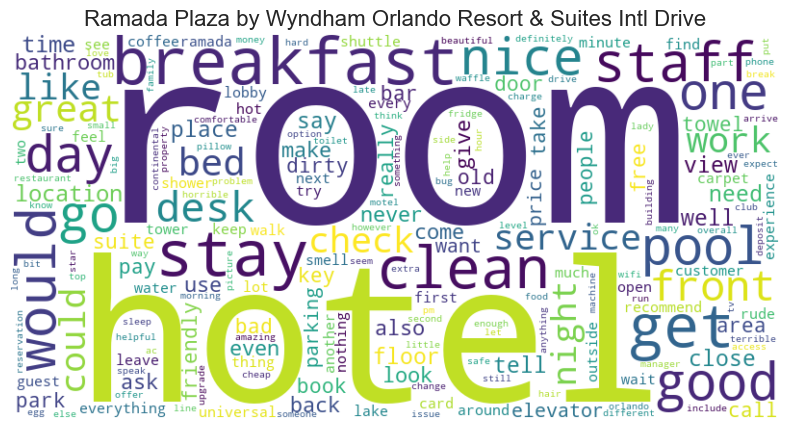

In [100]:
# tokenizando
text = fl['clean_review'].str.cat()
text = text.lower()  # Convierte a minúsculas
text = ''.join([c for c in text if c.isalpha() or c.isspace()])  # Elimina caracteres no alfabéticos
# Tokenización
nltk.download('stopwords')
words = nltk.word_tokenize(text)
stop_words = set(stopwords.words('english'))
words = [word for word in words if word not in stop_words]  # Elimina palabras vacías

# Análisis de frecuencia de palabras
freq_dist = nltk.FreqDist(words)

# Creación de la Word Cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(freq_dist)

# Visualización
plt.figure(figsize=(10, 5))
plt.title('Ramada Plaza by Wyndham Orlando Resort & Suites Intl Drive', fontsize=16)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

# KPI 1

    Reviews positivas: porcentaje de reviews positivas según el rating. Esto permite entender la satisfacción general de los huéspedes.

% Reviews positivas=  (Cantidad reviews positivas)/(Cantidad total reviews)*100

In [101]:
len(fl[fl['rating'] > 3])/len(fl['review'])

0.43238095238095237

# KPI 2

	Reviews negativas: 
Así como las positivas, medir las reviews negativas ayuda a identificar los aspectos que generan insatisfacción en los huéspedes.

% Reviews negativas=  (Cantidad reviews negativas)/(Cantidad total de reviews)*100

In [102]:
len(fl[fl['rating'] < 3])/len(fl['review'])

0.4146031746031746

In [103]:
# Calcular las proporciones
proporcion_positivo = len(fl[fl['rating'] > 3])/len(fl['review'])
proporcion_neutro = len(fl[fl['rating'] == 3])/len(fl['review'])
proporcion_negativo = len(fl[fl['rating'] < 3])/len(fl['review'])
# Crear un DataFrame con las proporciones
data = {'Sentimiento': ['Neutro', 'Negativo', 'Positivo'],
        'Proporcion': [proporcion_neutro, proporcion_negativo, proporcion_positivo]}

df_proporcionesfl = pd.DataFrame(data)

# Ahora 'df_proporciones' contiene las proporciones calculadas
df_proporcionesfl

,Sentimiento,Proporcion
0,Neutro,0.153016
1,Negativo,0.414603
2,Positivo,0.432381


# GRÁFICO KPIS 1 Y 2

/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


Text(0, 0.5, 'Proporción')

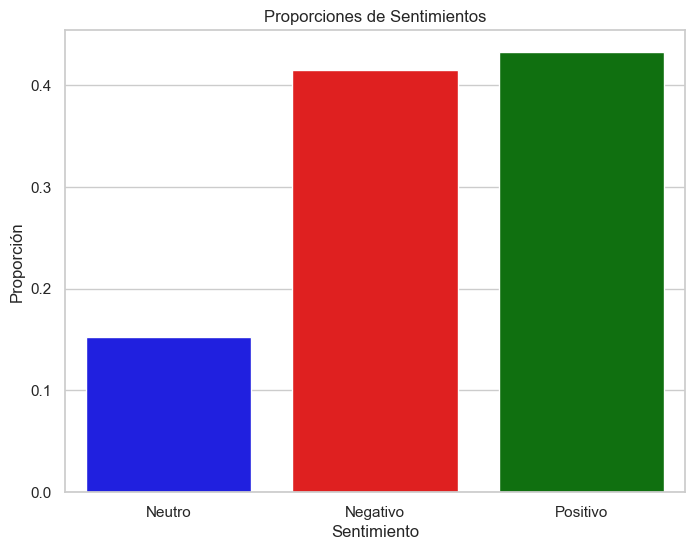

In [104]:
# Crear un gráfico de barras
sns.set(style="whitegrid")
plt.figure(figsize=(8, 6))
# Crear una paleta de colores personalizada
colores = {'Neutro': 'blue', 'Positivo': 'green', 'Negativo': 'red'}
# Definir los colores de las barras utilizando la columna 'Sentimiento'
df_proporcionesfl['Color'] = df_proporcionesfl['Sentimiento'].map(colores)
# Usar seaborn para crear el gráfico de barras
sns.barplot(x='Sentimiento', y='Proporcion', data=df_proporcionesfl, palette=df_proporcionesrv['Color'])

# Personalizar el gráfico
plt.title('Proporciones de Sentimientos')
plt.xlabel('Sentimiento')
plt.ylabel('Proporción')



# KPI 3

	Promedio de sentimiento: 
Puntuación promedio de sentimiento de las reviews, asignando valores a las palabras clave o frases, que reflejen emociones positivas o negativas, permite medir el nivel general de satisfacción y detectar tendencias.

Puntuacion promedio de sentimiento=  (∑▒〖Puntuación de sentimiento〗)/(Cantidad total de reviews)

In [105]:
fl['sentiment_score'].mean()

0.22577898412698416

# KPI 4

	Ratio por categoría de servicio: 
Analizar las reviews en función de las diferentes categorías de servicios del hotel ayuda a identificar las áreas específicas que están generando más comentarios emocionales.
Las categorías serían: comodidad de habitación, desayuno, limpieza y atención al cliente.

Habitación

In [106]:
# Calcular las proporciones
proporcion_neutro = len(fl[fl['room_sentiment'] == 'Neutro'])/len(fl['review'])
proporcion_negativo = len(fl[fl['room_sentiment'] == 'Negativo'])/len(fl['review'])
proporcion_positivo = len(fl[fl['room_sentiment'] == 'Positivo'])/len(fl['review'])

# Crear un DataFrame con las proporciones
data = {'Sentimiento': ['Neutro', 'Negativo', 'Positivo'],
        'Proporcion': [proporcion_neutro, proporcion_negativo, proporcion_positivo]}

df_proporciones = pd.DataFrame(data)

# Ahora 'df_proporciones' contiene las proporciones calculadas
df_proporciones

,Sentimiento,Proporcion
0,Neutro,0.268571
1,Negativo,0.412063
2,Positivo,0.319365


/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


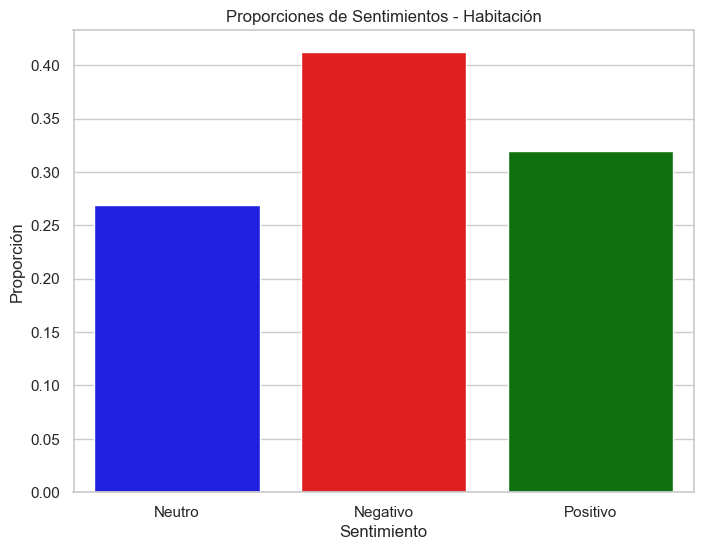

In [107]:
# Crear una paleta de colores personalizada
colores = {'Neutro': 'blue', 'Positivo': 'green', 'Negativo': 'red'}

# Definir los colores de las barras utilizando la columna 'Sentimiento'
df_proporciones['Color'] = df_proporciones['Sentimiento'].map(colores)

# Configurar el estilo de Seaborn
sns.set(style="whitegrid")

# Crear el gráfico de barras utilizando la paleta personalizada
plt.figure(figsize=(8, 6))
sns.barplot(x='Sentimiento', y='Proporcion', data=df_proporciones, palette=df_proporciones['Color'])

# Personalizar el gráfico
plt.title('Proporciones de Sentimientos - Habitación')
plt.xlabel('Sentimiento')
plt.ylabel('Proporción')

# Mostrar el gráfico
plt.show()

Servicio

In [108]:
# Calcular las proporciones
proporcion_neutro = len(fl[fl['guest_service_sentiment'] == 'Neutro'])/len(fl['review'])
proporcion_negativo = len(fl[fl['guest_service_sentiment'] == 'Negativo'])/len(fl['review'])
proporcion_positivo = len(fl[fl['guest_service_sentiment'] == 'Positivo'])/len(fl['review'])

# Crear un DataFrame con las proporciones
data = {'Sentimiento': ['Neutro', 'Negativo', 'Positivo'],
        'Proporcion': [proporcion_neutro, proporcion_negativo, proporcion_positivo]}

df_proporciones = pd.DataFrame(data)

# Ahora 'df_proporciones' contiene las proporciones calculadas
df_proporciones

,Sentimiento,Proporcion
0,Neutro,0.414603
1,Negativo,0.290794
2,Positivo,0.294603


/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


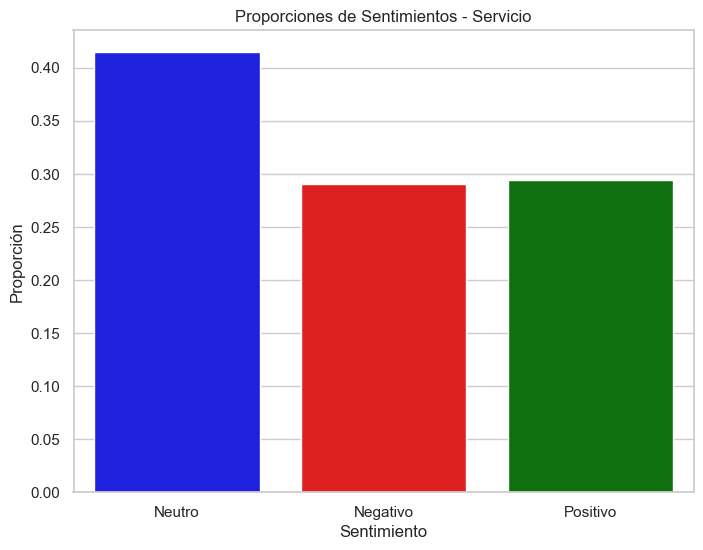

In [109]:
# Crear una paleta de colores personalizada
colores = {'Neutro': 'blue', 'Positivo': 'green', 'Negativo': 'red'}

# Definir los colores de las barras utilizando la columna 'Sentimiento'
df_proporciones['Color'] = df_proporciones['Sentimiento'].map(colores)

# Configurar el estilo de Seaborn
sns.set(style="whitegrid")

# Crear el gráfico de barras utilizando la paleta personalizada
plt.figure(figsize=(8, 6))
sns.barplot(x='Sentimiento', y='Proporcion', data=df_proporciones, palette=df_proporciones['Color'])

# Personalizar el gráfico
plt.title('Proporciones de Sentimientos - Servicio')
plt.xlabel('Sentimiento')
plt.ylabel('Proporción')

# Mostrar el gráfico
plt.show()

Limpieza

In [110]:
# Calcular las proporciones
proporcion_neutro = len(fl[fl['cleaning_sentiment'] == 'Neutro'])/len(fl['review'])
proporcion_negativo = len(fl[fl['cleaning_sentiment'] == 'Negativo'])/len(fl['review'])
proporcion_positivo = len(fl[fl['cleaning_sentiment'] == 'Positivo'])/len(fl['review'])

# Crear un DataFrame con las proporciones
data = {'Sentimiento': ['Neutro', 'Negativo', 'Positivo'],
        'Proporcion': [proporcion_neutro, proporcion_negativo, proporcion_positivo]}

df_proporciones = pd.DataFrame(data)

# Ahora 'df_proporciones' contiene las proporciones calculadas
df_proporciones

,Sentimiento,Proporcion
0,Neutro,0.351111
1,Negativo,0.386032
2,Positivo,0.262857


/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


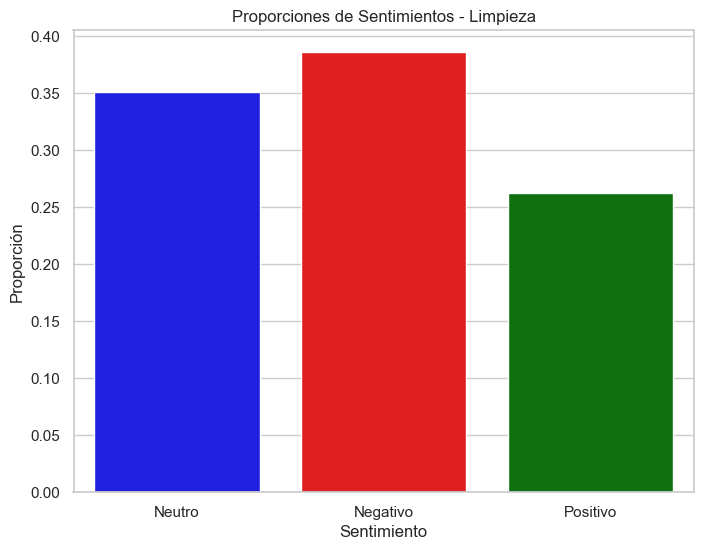

In [111]:
# Crear una paleta de colores personalizada
colores = {'Neutro': 'blue', 'Positivo': 'green', 'Negativo': 'red'}

# Definir los colores de las barras utilizando la columna 'Sentimiento'
df_proporciones['Color'] = df_proporciones['Sentimiento'].map(colores)

# Configurar el estilo de Seaborn
sns.set(style="whitegrid")

# Crear el gráfico de barras utilizando la paleta personalizada
plt.figure(figsize=(8, 6))
sns.barplot(x='Sentimiento', y='Proporcion', data=df_proporciones, palette=df_proporciones['Color'])

# Personalizar el gráfico
plt.title('Proporciones de Sentimientos - Limpieza')
plt.xlabel('Sentimiento')
plt.ylabel('Proporción')

# Mostrar el gráfico
plt.show()

Desayuno

In [112]:
# Calcular las proporciones
proporcion_neutro = len(fl[fl['breakfast_sentiment'] == 'Neutro'])/len(fl['review'])
proporcion_negativo = len(fl[fl['breakfast_sentiment'] == 'Negativo'])/len(fl['review'])
proporcion_positivo = len(fl[fl['breakfast_sentiment'] == 'Positivo'])/len(fl['review'])

# Crear un DataFrame con las proporciones
data = {'Sentimiento': ['Neutro', 'Negativo', 'Positivo'],
        'Proporcion': [proporcion_neutro, proporcion_negativo, proporcion_positivo]}

df_proporciones = pd.DataFrame(data)

# Ahora 'df_proporciones' contiene las proporciones calculadas
df_proporciones

,Sentimiento,Proporcion
0,Neutro,0.713651
1,Negativo,0.200635
2,Positivo,0.085714


/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


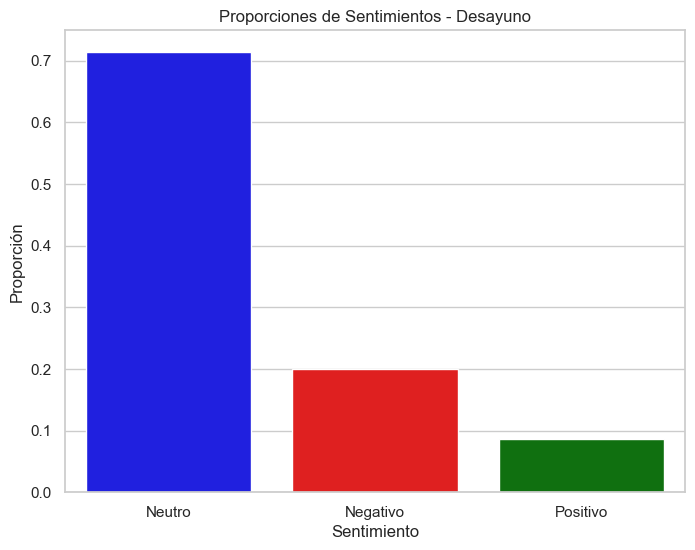

In [113]:
# Crear una paleta de colores personalizada
colores = {'Neutro': 'blue', 'Positivo': 'green', 'Negativo': 'red'}

# Definir los colores de las barras utilizando la columna 'Sentimiento'
df_proporciones['Color'] = df_proporciones['Sentimiento'].map(colores)

# Configurar el estilo de Seaborn
sns.set(style="whitegrid")

# Crear el gráfico de barras utilizando la paleta personalizada
plt.figure(figsize=(8, 6))
sns.barplot(x='Sentimiento', y='Proporcion', data=df_proporciones, palette=df_proporciones['Color'])

# Personalizar el gráfico
plt.title('Proporciones de Sentimientos - Desayuno')
plt.xlabel('Sentimiento')
plt.ylabel('Proporción')

# Mostrar el gráfico
plt.show()

# KPI 5

	Comparación de sentimiento: Comparar el sentimiento de las reviews de tu hotel con el de los competidores directos proporciona una visión comparativa y ayuda a identificar áreas en las que se puede aprender de la competencia o destacar por encima de ella.


Ratio de promedios de nuestro cliente sobre competencia

=  (Promedio de sentimiento de nuestro cliente)/(Promedio de sentimiento de la competencia)

In [114]:
# filtrar clientes de la competencia

competenciafl = model[(model['state'] == 'FL') & (model['lodging_name'] != cliente[1])]
competenciafl.shape

(705, 21)

In [115]:
clfl = fl['sentiment_score'].mean() 
comfl = competenciafl['sentiment_score'].mean()

# Crear un DataFrame con las proporciones
data = {'Holetes': ['Cliente', 'Competencia'],
        'Avg_Sentimiento': [clfl, comfl]}

ratio = pd.DataFrame(data)

# Ahora 'ratio' contiene las proporciones calculadas
ratio

,Holetes,Avg_Sentimiento
0,Cliente,0.225779
1,Competencia,0.248703


# Ramada Plaza by Wyndham West Hollywood Hotel & Suites - CA

In [116]:
ca = model[model['lodging_name']==(cliente[2])]

## Nube de palabras

[nltk_data] Downloading package stopwords to /Users/hugo/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


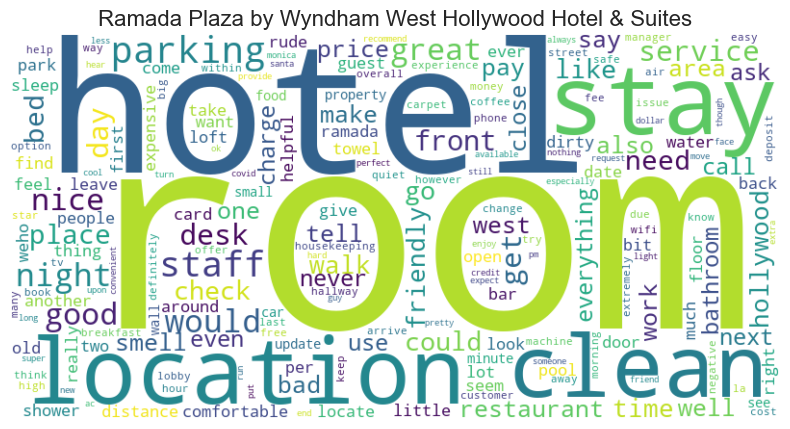

In [117]:
# tokenizando
text = ca['clean_review'].str.cat()
text = text.lower()  # Convierte a minúsculas
text = ''.join([c for c in text if c.isalpha() or c.isspace()])  # Elimina caracteres no alfabéticos
# Tokenización
nltk.download('stopwords')
words = nltk.word_tokenize(text)
stop_words = set(stopwords.words('english'))
words = [word for word in words if word not in stop_words]  # Elimina palabras vacías

# Análisis de frecuencia de palabras
freq_dist = nltk.FreqDist(words)

# Creación de la Word Cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(freq_dist)

# Visualización
plt.figure(figsize=(10, 5))
plt.title('Ramada Plaza by Wyndham West Hollywood Hotel & Suites', fontsize=16)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

# KPI 1

    Reviews positivas: porcentaje de reviews positivas según el rating. Esto permite entender la satisfacción general de los huéspedes.

% Reviews positivas=  (Cantidad reviews positivas)/(Cantidad total reviews)*100

In [118]:
len(ca[ca['rating'] > 3])/len(ca['review'])

0.47540983606557374

# KPI 2

	Reviews negativas: 
Así como las positivas, medir las reviews negativas ayuda a identificar los aspectos que generan insatisfacción en los huéspedes.

% Reviews negativas=  (Cantidad reviews negativas)/(Cantidad total de reviews)*100

In [119]:
len(ca[ca['rating'] < 3])/len(ca['review'])

0.2994535519125683

In [120]:
# Calcular las proporciones
proporcion_positivo = len(ca[ca['rating'] > 3])/len(ca['review'])
proporcion_neutro = len(ca[ca['rating'] == 3])/len(ca['review'])
proporcion_negativo = len(ca[ca['rating'] < 3])/len(ca['review'])
# Crear un DataFrame con las proporciones
data = {'Sentimiento': ['Neutro', 'Negativo', 'Positivo'],
        'Proporcion': [proporcion_neutro, proporcion_negativo, proporcion_positivo]}

df_proporcionesca = pd.DataFrame(data)

# Ahora 'df_proporciones' contiene las proporciones calculadas
df_proporcionesca

,Sentimiento,Proporcion
0,Neutro,0.225137
1,Negativo,0.299454
2,Positivo,0.475410


# GRÁFICOS KPIS 1 Y 2

/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


Text(0, 0.5, 'Proporción')

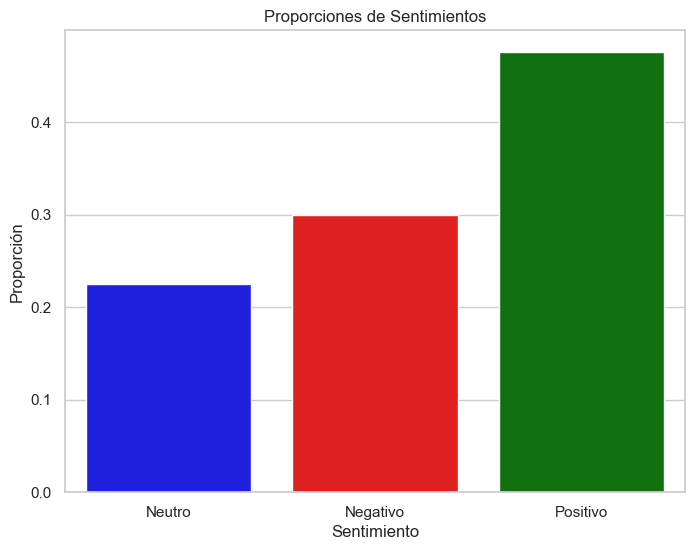

In [121]:
# Crear un gráfico de barras
sns.set(style="whitegrid")
plt.figure(figsize=(8, 6))
# Crear una paleta de colores personalizada
colores = {'Neutro': 'blue', 'Positivo': 'green', 'Negativo': 'red'}
# Definir los colores de las barras utilizando la columna 'Sentimiento'
df_proporcionesca['Color'] = df_proporcionesca['Sentimiento'].map(colores)
# Usar seaborn para crear el gráfico de barras
sns.barplot(x='Sentimiento', y='Proporcion', data=df_proporcionesca, palette=df_proporcionesrv['Color'])

# Personalizar el gráfico
plt.title('Proporciones de Sentimientos')
plt.xlabel('Sentimiento')
plt.ylabel('Proporción')

# KPI 3

In [122]:
ca.lodging_name.unique()

array(['Ramada Plaza by Wyndham West Hollywood Hotel & Suites'],
      dtype=object)

	Promedio de sentimiento: 
Puntuación promedio de sentimiento de las reviews, asignando valores a las palabras clave o frases, que reflejen emociones positivas o negativas, permite medir el nivel general de satisfacción y detectar tendencias.

Puntuacion promedio de sentimiento=  (∑▒〖Puntuación de sentimiento〗)/(Cantidad total de reviews)

In [123]:
ca['sentiment_score'].mean()

0.2682006557377049

# KPI 4

	Ratio por categoría de servicio: 
Analizar las reviews en función de las diferentes categorías de servicios del hotel ayuda a identificar las áreas específicas que están generando más comentarios emocionales.
Las categorías serían: comodidad de habitación, desayuno, limpieza y atención al cliente.

Habitación

In [124]:
# Calcular las proporciones
proporcion_neutro = len(ca[ca['room_sentiment'] == 'Neutro'])/len(ca['review'])
proporcion_negativo = len(ca[ca['room_sentiment'] == 'Negativo'])/len(ca['review'])
proporcion_positivo = len(ca[ca['room_sentiment'] == 'Positivo'])/len(ca['review'])

# Crear un DataFrame con las proporciones
data = {'Sentimiento': ['Neutro', 'Negativo', 'Positivo'],
        'Proporcion': [proporcion_neutro, proporcion_negativo, proporcion_positivo]}

df_proporciones = pd.DataFrame(data)

# Ahora 'df_proporciones' contiene las proporciones calculadas
df_proporciones

,Sentimiento,Proporcion
0,Neutro,0.303825
1,Negativo,0.394536
2,Positivo,0.301639


/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


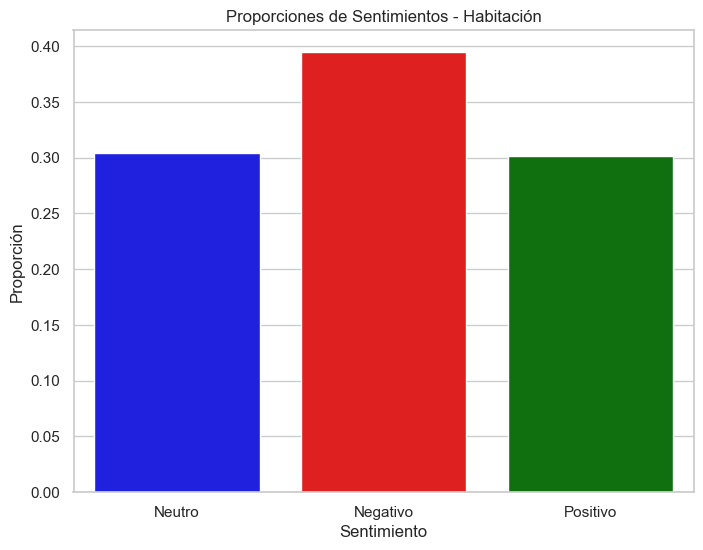

In [125]:
# Crear una paleta de colores personalizada
colores = {'Neutro': 'blue', 'Positivo': 'green', 'Negativo': 'red'}

# Definir los colores de las barras utilizando la columna 'Sentimiento'
df_proporciones['Color'] = df_proporciones['Sentimiento'].map(colores)

# Configurar el estilo de Seaborn
sns.set(style="whitegrid")

# Crear el gráfico de barras utilizando la paleta personalizada
plt.figure(figsize=(8, 6))
sns.barplot(x='Sentimiento', y='Proporcion', data=df_proporciones, palette=df_proporciones['Color'])

# Personalizar el gráfico
plt.title('Proporciones de Sentimientos - Habitación')
plt.xlabel('Sentimiento')
plt.ylabel('Proporción')

# Mostrar el gráfico
plt.show()

Servicio

In [126]:
# Calcular las proporciones
proporcion_neutro = len(ca[ca['guest_service_sentiment'] == 'Neutro'])/len(ca['review'])
proporcion_negativo = len(ca[ca['guest_service_sentiment'] == 'Negativo'])/len(ca['review'])
proporcion_positivo = len(ca[ca['guest_service_sentiment'] == 'Positivo'])/len(ca['review'])

# Crear un DataFrame con las proporciones
data = {'Sentimiento': ['Neutro', 'Negativo', 'Positivo'],
        'Proporcion': [proporcion_neutro, proporcion_negativo, proporcion_positivo]}

df_proporciones = pd.DataFrame(data)

# Ahora 'df_proporciones' contiene las proporciones calculadas
df_proporciones

,Sentimiento,Proporcion
0,Neutro,0.519126
1,Negativo,0.222951
2,Positivo,0.257923


/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


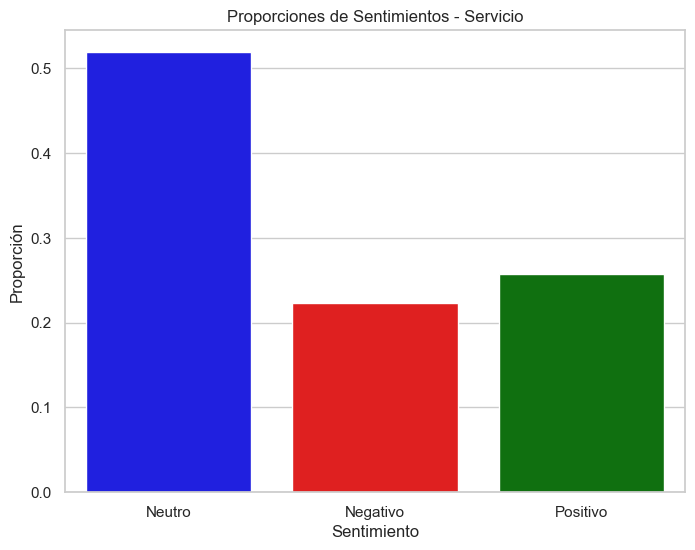

In [127]:
# Crear una paleta de colores personalizada
colores = {'Neutro': 'blue', 'Positivo': 'green', 'Negativo': 'red'}

# Definir los colores de las barras utilizando la columna 'Sentimiento'
df_proporciones['Color'] = df_proporciones['Sentimiento'].map(colores)

# Configurar el estilo de Seaborn
sns.set(style="whitegrid")

# Crear el gráfico de barras utilizando la paleta personalizada
plt.figure(figsize=(8, 6))
sns.barplot(x='Sentimiento', y='Proporcion', data=df_proporciones, palette=df_proporciones['Color'])

# Personalizar el gráfico
plt.title('Proporciones de Sentimientos - Servicio')
plt.xlabel('Sentimiento')
plt.ylabel('Proporción')

# Mostrar el gráfico
plt.show()

Limpieza

In [128]:
# Calcular las proporciones
proporcion_neutro = len(ca[ca['cleaning_sentiment'] == 'Neutro'])/len(ca['review'])
proporcion_negativo = len(ca[ca['cleaning_sentiment'] == 'Negativo'])/len(ca['review'])
proporcion_positivo = len(ca[ca['cleaning_sentiment'] == 'Positivo'])/len(ca['review'])

# Crear un DataFrame con las proporciones
data = {'Sentimiento': ['Neutro', 'Negativo', 'Positivo'],
        'Proporcion': [proporcion_neutro, proporcion_negativo, proporcion_positivo]}

df_proporciones = pd.DataFrame(data)

# Ahora 'df_proporciones' contiene las proporciones calculadas
df_proporciones

,Sentimiento,Proporcion
0,Neutro,0.410929
1,Negativo,0.353005
2,Positivo,0.236066


/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


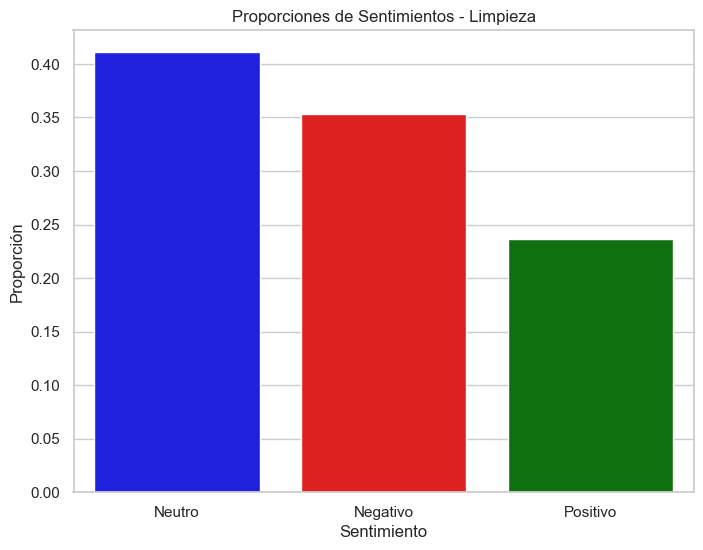

In [129]:
# Crear una paleta de colores personalizada
colores = {'Neutro': 'blue', 'Positivo': 'green', 'Negativo': 'red'}

# Definir los colores de las barras utilizando la columna 'Sentimiento'
df_proporciones['Color'] = df_proporciones['Sentimiento'].map(colores)

# Configurar el estilo de Seaborn
sns.set(style="whitegrid")

# Crear el gráfico de barras utilizando la paleta personalizada
plt.figure(figsize=(8, 6))
sns.barplot(x='Sentimiento', y='Proporcion', data=df_proporciones, palette=df_proporciones['Color'])

# Personalizar el gráfico
plt.title('Proporciones de Sentimientos - Limpieza')
plt.xlabel('Sentimiento')
plt.ylabel('Proporción')

# Mostrar el gráfico
plt.show()

Desayuno

In [130]:
# Calcular las proporciones
proporcion_neutro = len(ca[ca['breakfast_sentiment'] == 'Neutro'])/len(ca['review'])
proporcion_negativo = len(ca[ca['breakfast_sentiment'] == 'Negativo'])/len(ca['review'])
proporcion_positivo = len(ca[ca['breakfast_sentiment'] == 'Positivo'])/len(ca['review'])

# Crear un DataFrame con las proporciones
data = {'Sentimiento': ['Neutro', 'Negativo', 'Positivo'],
        'Proporcion': [proporcion_neutro, proporcion_negativo, proporcion_positivo]}

df_proporciones = pd.DataFrame(data)

# Ahora 'df_proporciones' contiene las proporciones calculadas
df_proporciones

,Sentimiento,Proporcion
0,Neutro,0.938798
1,Negativo,0.028415
2,Positivo,0.032787


/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


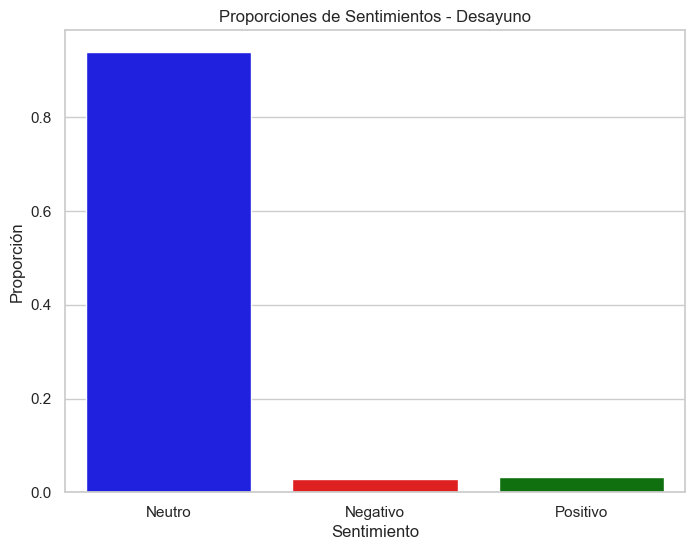

In [131]:
# Crear una paleta de colores personalizada
colores = {'Neutro': 'blue', 'Positivo': 'green', 'Negativo': 'red'}

# Definir los colores de las barras utilizando la columna 'Sentimiento'
df_proporciones['Color'] = df_proporciones['Sentimiento'].map(colores)

# Configurar el estilo de Seaborn
sns.set(style="whitegrid")

# Crear el gráfico de barras utilizando la paleta personalizada
plt.figure(figsize=(8, 6))
sns.barplot(x='Sentimiento', y='Proporcion', data=df_proporciones, palette=df_proporciones['Color'])

# Personalizar el gráfico
plt.title('Proporciones de Sentimientos - Desayuno')
plt.xlabel('Sentimiento')
plt.ylabel('Proporción')

# Mostrar el gráfico
plt.show()

# KPI 5

	Comparación de sentimiento: Comparar el sentimiento de las reviews de tu hotel con el de los competidores directos proporciona una visión comparativa y ayuda a identificar áreas en las que se puede aprender de la competencia o destacar por encima de ella.


Ratio de promedios de nuestro cliente sobre competencia

=  (Promedio de sentimiento de nuestro cliente)/(Promedio de sentimiento de la competencia)

In [132]:
# filtrar clientes de la competencia

competenciaca = model[(model['state'] == 'CA') & (model['lodging_name'] != cliente[2])]
competenciaca.shape

(992, 21)

In [133]:
clca = ca['sentiment_score'].mean() 
comca = competenciaca['sentiment_score'].mean()

# Crear un DataFrame con las proporciones
data = {'Holetes': ['Cliente', 'Competencia'],
        'Avg_Sentimiento': [clca, comca]}

ratio = pd.DataFrame(data)

# Ahora 'ratio' contiene las proporciones calculadas
ratio

,Holetes,Avg_Sentimiento
0,Cliente,0.268201
1,Competencia,0.562633


# Ramada by Wyndham New York Times Square West - NY

In [134]:
ny = model[model['lodging_name']==(cliente[3])]

## Nube de palabras

[nltk_data] Downloading package stopwords to /Users/hugo/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


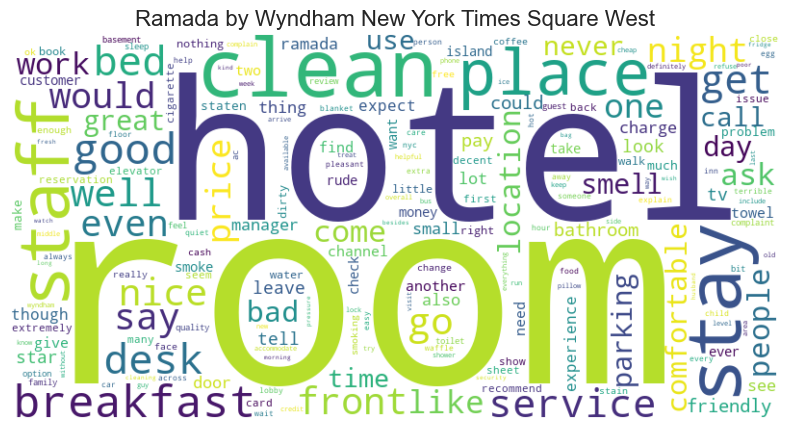

In [135]:
# tokenizando
text = ny['clean_review'].str.cat()
text = text.lower()  # Convierte a minúsculas
text = ''.join([c for c in text if c.isalpha() or c.isspace()])  # Elimina caracteres no alfabéticos
# Tokenización
nltk.download('stopwords')
words = nltk.word_tokenize(text)
stop_words = set(stopwords.words('english'))
words = [word for word in words if word not in stop_words]  # Elimina palabras vacías

# Análisis de frecuencia de palabras
freq_dist = nltk.FreqDist(words)

# Creación de la Word Cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(freq_dist)

# Visualización
plt.figure(figsize=(10, 5))
plt.title('Ramada by Wyndham New York Times Square West', fontsize=16)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

# KPI 1

    Reviews positivas: porcentaje de reviews positivas según el rating. Esto permite entender la satisfacción general de los huéspedes.

% Reviews positivas=  (Cantidad reviews positivas)/(Cantidad total reviews)*100

In [136]:
len(ny[ny['rating'] > 3])/len(ny['review'])

0.4717607973421927

# KPI 2

	Reviews negativas: 
Así como las positivas, medir las reviews negativas ayuda a identificar los aspectos que generan insatisfacción en los huéspedes.

% Reviews negativas=  (Cantidad reviews negativas)/(Cantidad total de reviews)*100

In [137]:
len(ny[ny['rating'] < 3])/len(ny['review'])

0.3554817275747508

In [138]:
# Calcular las proporciones
proporcion_positivo = len(ny[ny['rating'] > 3])/len(ny['review'])
proporcion_neutro = len(ny[ny['rating'] == 3])/len(ny['review'])
proporcion_negativo = len(ny[ny['rating'] < 3])/len(ny['review'])
# Crear un DataFrame con las proporciones
data = {'Sentimiento': ['Neutro', 'Negativo', 'Positivo'],
        'Proporcion': [proporcion_neutro, proporcion_negativo, proporcion_positivo]}

df_proporcionesny = pd.DataFrame(data)

# Ahora 'df_proporciones' contiene las proporciones nylculadas
df_proporcionesny

,Sentimiento,Proporcion
0,Neutro,0.172757
1,Negativo,0.355482
2,Positivo,0.471761


# GRÁFICOS KPIS 1 Y 2

/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


Text(0, 0.5, 'Proporción')

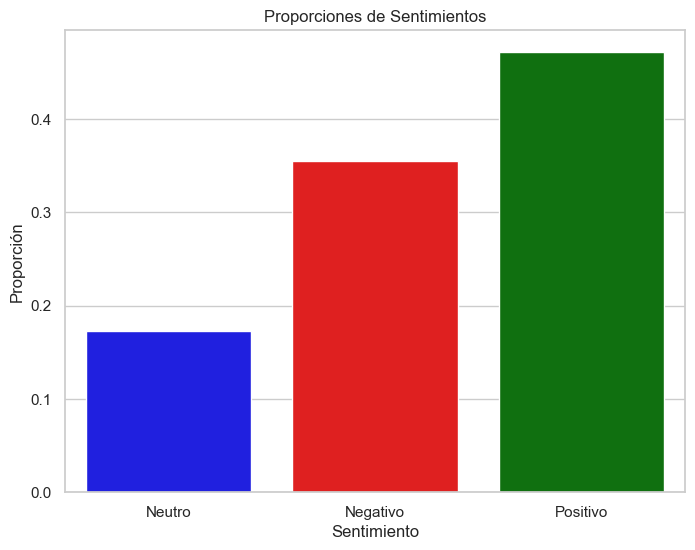

In [139]:
# Crear un gráfico de barras
sns.set(style="whitegrid")
plt.figure(figsize=(8, 6))
# Crear una paleta de colores personalizada
colores = {'Neutro': 'blue', 'Positivo': 'green', 'Negativo': 'red'}
# Definir los colores de las barras utilizando la columna 'Sentimiento'
df_proporcionesny['Color'] = df_proporcionesny['Sentimiento'].map(colores)
# Usar seaborn para crear el gráfico de barras
sns.barplot(x='Sentimiento', y='Proporcion', data=df_proporcionesny, palette=df_proporcionesrv['Color'])

# Personalizar el gráfico
plt.title('Proporciones de Sentimientos')
plt.xlabel('Sentimiento')
plt.ylabel('Proporción')

# KPI 3

	Promedio de sentimiento: 
Puntuación promedio de sentimiento de las reviews, asignando valores a las palabras clave o frases, que reflejen emociones positivas o negativas, permite medir el nivel general de satisfacción y detectar tendencias.

Puntuacion promedio de sentimiento=  (∑▒〖Puntuación de sentimiento〗)/(Cantidad total de reviews)

In [140]:
ny['sentiment_score'].mean()

0.26058139534883723

# KPI 4

	Ratio por categoría de servicio: 
Analizar las reviews en función de las diferentes categorías de servicios del hotel ayuda a identificar las áreas específicas que están generando más comentarios emocionales.
Las categorías serían: comodidad de habitación, desayuno, limpieza y atención al cliente.

Habitación

In [141]:
# nylcular las proporciones
proporcion_neutro = len(ny[ny['room_sentiment'] == 'Neutro'])/len(ny['review'])
proporcion_negativo = len(ny[ny['room_sentiment'] == 'Negativo'])/len(ny['review'])
proporcion_positivo = len(ny[ny['room_sentiment'] == 'Positivo'])/len(ny['review'])

# Crear un DataFrame con las proporciones
data = {'Sentimiento': ['Neutro', 'Negativo', 'Positivo'],
        'Proporcion': [proporcion_neutro, proporcion_negativo, proporcion_positivo]}

df_proporciones = pd.DataFrame(data)

# Ahora 'df_proporciones' contiene las proporciones nylculadas
df_proporciones

,Sentimiento,Proporcion
0,Neutro,0.308970
1,Negativo,0.295681
2,Positivo,0.395349


/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


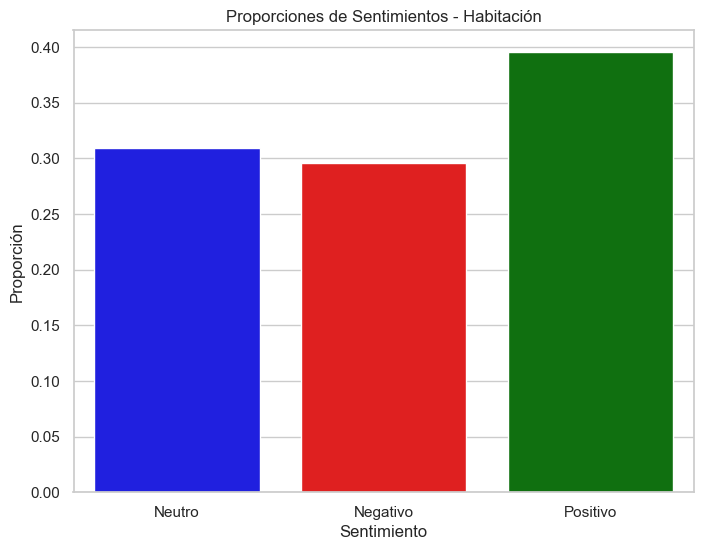

In [142]:
# Crear una paleta de colores personalizada
colores = {'Neutro': 'blue', 'Positivo': 'green', 'Negativo': 'red'}

# Definir los colores de las barras utilizando la columna 'Sentimiento'
df_proporciones['Color'] = df_proporciones['Sentimiento'].map(colores)

# Configurar el estilo de Seaborn
sns.set(style="whitegrid")

# Crear el gráfico de barras utilizando la paleta personalizada
plt.figure(figsize=(8, 6))
sns.barplot(x='Sentimiento', y='Proporcion', data=df_proporciones, palette=df_proporciones['Color'])

# Personalizar el gráfico
plt.title('Proporciones de Sentimientos - Habitación')
plt.xlabel('Sentimiento')
plt.ylabel('Proporción')

# Mostrar el gráfico
plt.show()

Servicio

In [143]:
# Calcular las proporciones
proporcion_neutro = len(ny[ny['guest_service_sentiment'] == 'Neutro'])/len(ny['review'])
proporcion_negativo = len(ny[ny['guest_service_sentiment'] == 'Negativo'])/len(ny['review'])
proporcion_positivo = len(ny[ny['guest_service_sentiment'] == 'Positivo'])/len(ny['review'])

# Crear un DataFrame con las proporciones
data = {'Sentimiento': ['Neutro', 'Negativo', 'Positivo'],
        'Proporcion': [proporcion_neutro, proporcion_negativo, proporcion_positivo]}

df_proporciones = pd.DataFrame(data)

# Ahora 'df_proporciones' contiene las proporciones calculadas
df_proporciones

,Sentimiento,Proporcion
0,Neutro,0.418605
1,Negativo,0.242525
2,Positivo,0.338870


/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


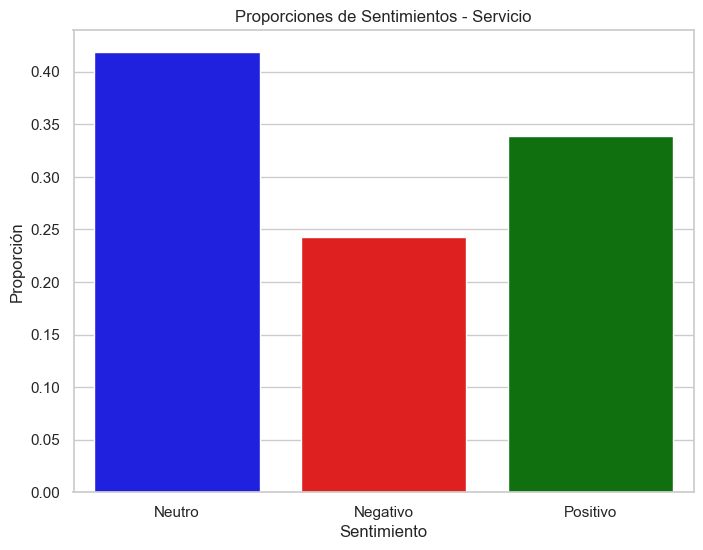

In [144]:
# Crear una paleta de colores personalizada
colores = {'Neutro': 'blue', 'Positivo': 'green', 'Negativo': 'red'}

# Definir los colores de las barras utilizando la columna 'Sentimiento'
df_proporciones['Color'] = df_proporciones['Sentimiento'].map(colores)

# Configurar el estilo de Seaborn
sns.set(style="whitegrid")

# Crear el gráfico de barras utilizando la paleta personalizada
plt.figure(figsize=(8, 6))
sns.barplot(x='Sentimiento', y='Proporcion', data=df_proporciones, palette=df_proporciones['Color'])

# Personalizar el gráfico
plt.title('Proporciones de Sentimientos - Servicio')
plt.xlabel('Sentimiento')
plt.ylabel('Proporción')

# Mostrar el gráfico
plt.show()

Limpieza

In [145]:
# Calcular las proporciones
proporcion_neutro = len(ny[ny['cleaning_sentiment'] == 'Neutro'])/len(ny['review'])
proporcion_negativo = len(ny[ny['cleaning_sentiment'] == 'Negativo'])/len(ny['review'])
proporcion_positivo = len(ny[ny['cleaning_sentiment'] == 'Positivo'])/len(ny['review'])

# Crear un DataFrame con las proporciones
data = {'Sentimiento': ['Neutro', 'Negativo', 'Positivo'],
        'Proporcion': [proporcion_neutro, proporcion_negativo, proporcion_positivo]}

df_proporciones = pd.DataFrame(data)

# Ahora 'df_proporciones' contiene las proporciones calculadas
df_proporciones

,Sentimiento,Proporcion
0,Neutro,0.385382
1,Negativo,0.239203
2,Positivo,0.375415


/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


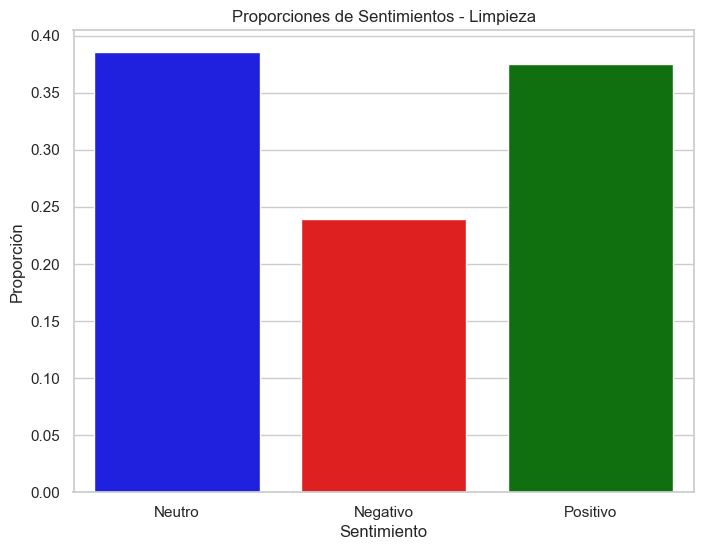

In [146]:
# Crear una paleta de colores personalizada
colores = {'Neutro': 'blue', 'Positivo': 'green', 'Negativo': 'red'}

# Definir los colores de las barras utilizando la columna 'Sentimiento'
df_proporciones['Color'] = df_proporciones['Sentimiento'].map(colores)

# Configurar el estilo de Seaborn
sns.set(style="whitegrid")

# Crear el gráfico de barras utilizando la paleta personalizada
plt.figure(figsize=(8, 6))
sns.barplot(x='Sentimiento', y='Proporcion', data=df_proporciones, palette=df_proporciones['Color'])

# Personalizar el gráfico
plt.title('Proporciones de Sentimientos - Limpieza')
plt.xlabel('Sentimiento')
plt.ylabel('Proporción')

# Mostrar el gráfico
plt.show()

Desayuno

In [147]:
# Calcular las proporciones
proporcion_neutro = len(ny[ny['breakfast_sentiment'] == 'Neutro'])/len(ny['review'])
proporcion_negativo = len(ny[ny['breakfast_sentiment'] == 'Negativo'])/len(ny['review'])
proporcion_positivo = len(ny[ny['breakfast_sentiment'] == 'Positivo'])/len(ny['review'])

# Crear un DataFrame con las proporciones
data = {'Sentimiento': ['Neutro', 'Negativo', 'Positivo'],
        'Proporcion': [proporcion_neutro, proporcion_negativo, proporcion_positivo]}

df_proporciones = pd.DataFrame(data)

# Ahora 'df_proporciones' contiene las proporciones calculadas
df_proporciones

,Sentimiento,Proporcion
0,Neutro,0.794020
1,Negativo,0.083056
2,Positivo,0.122924


/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


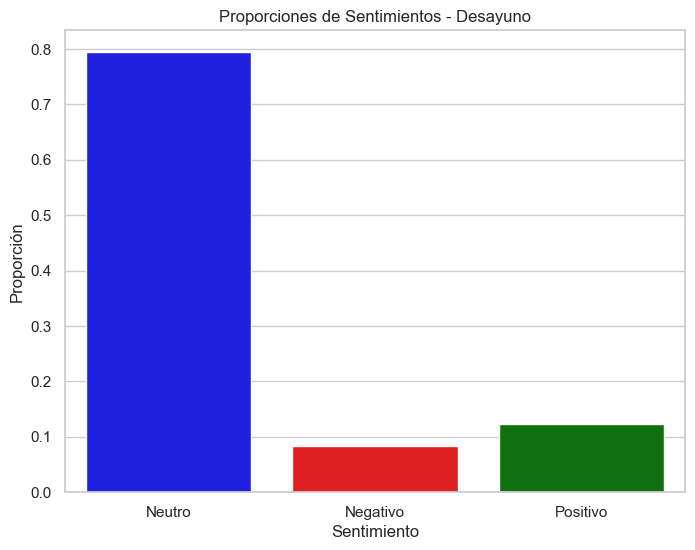

In [148]:
# Crear una paleta de colores personalizada
colores = {'Neutro': 'blue', 'Positivo': 'green', 'Negativo': 'red'}

# Definir los colores de las barras utilizando la columna 'Sentimiento'
df_proporciones['Color'] = df_proporciones['Sentimiento'].map(colores)

# Configurar el estilo de Seaborn
sns.set(style="whitegrid")

# Crear el gráfico de barras utilizando la paleta personalizada
plt.figure(figsize=(8, 6))
sns.barplot(x='Sentimiento', y='Proporcion', data=df_proporciones, palette=df_proporciones['Color'])

# Personalizar el gráfico
plt.title('Proporciones de Sentimientos - Desayuno')
plt.xlabel('Sentimiento')
plt.ylabel('Proporción')

# Mostrar el gráfico
plt.show()

# KPI 5

	Comparación de sentimiento: Comparar el sentimiento de las reviews de tu hotel con el de los competidores directos proporciona una visión comparativa y ayuda a identificar áreas en las que se puede aprender de la competencia o destacar por encima de ella.


Ratio de promedios de nuestro cliente sobre competencia

=  (Promedio de sentimiento de nuestro cliente)/(Promedio de sentimiento de la competencia)

In [149]:
# filtrar clientes de la competencia

competenciany = model[(model['state'] == 'NY') & (model['lodging_name'] != cliente[3])]
competenciany.shape

(1121, 21)

In [150]:
clny = ny['sentiment_score'].mean() 
comny = competenciany['sentiment_score'].mean()

# Crear un DataFrame con las proporciones
data = {'Holetes': ['Cliente', 'Competencia'],
        'Avg_Sentimiento': [clny, comny]}

ratio = pd.DataFrame(data)

# Ahora 'ratio' contiene las proporciones calculadas
ratio

,Holetes,Avg_Sentimiento
0,Cliente,0.260581
1,Competencia,0.425822


# Ramada by Wyndham Houston Intercontinental Airport East - TX

In [151]:
tx = model[model['lodging_name']==(cliente[4])]

## Nube de palabras

[nltk_data] Downloading package stopwords to /Users/hugo/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


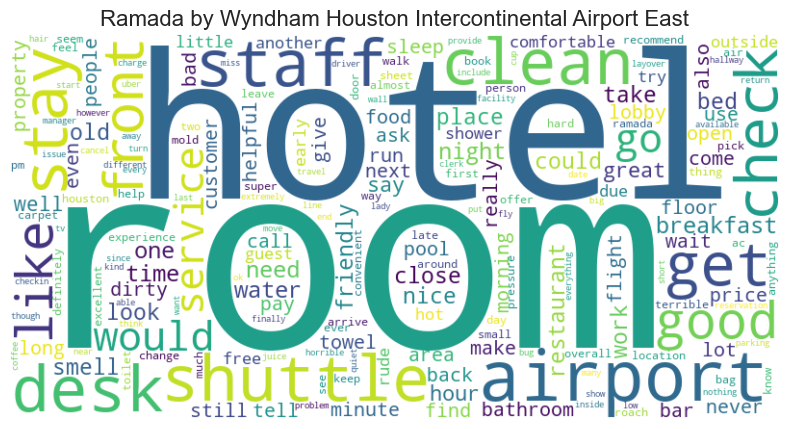

In [152]:
# tokenizando
text = tx['clean_review'].str.cat()
text = text.lower()  # Convierte a minúsculas
text = ''.join([c for c in text if c.isalpha() or c.isspace()])  # Elimina caracteres no alfabéticos
# Tokenización
nltk.download('stopwords')
words = nltk.word_tokenize(text)
stop_words = set(stopwords.words('english'))
words = [word for word in words if word not in stop_words]  # Elimina palabras vacías

# Análisis de frecuencia de palabras
freq_dist = nltk.FreqDist(words)

# Creación de la Word Cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(freq_dist)

# Visualización
plt.figure(figsize=(10, 5))
plt.title('Ramada by Wyndham Houston Intercontinental Airport East', fontsize=16)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

# KPI 1

    Reviews positivas: porcentaje de reviews positivas según el rating. Esto permite entender la satisfacción general de los huéspedes.

% Reviews positivas=  (Cantidad reviews positivas)/(Cantidad total reviews)*100

In [153]:
len(tx[tx['rating'] > 3])/len(tx['review'])

0.5089108910891089

# KPI 2

	Reviews negativas: 
Así como las positivas, medir las reviews negativas ayuda a identificar los aspectos que generan insatisfacción en los huéspedes.

% Reviews negativas=  (Cantidad reviews negativas)/(Cantidad total de reviews)*100

In [154]:
len(tx[tx['rating'] < 3])/len(tx['review'])

0.32673267326732675

In [155]:
# Calcular las proporciones
proporcion_positivo = len(tx[tx['rating'] > 3])/len(tx['review'])
proporcion_neutro = len(tx[tx['rating'] == 3])/len(tx['review'])
proporcion_negativo = len(tx[tx['rating'] < 3])/len(tx['review'])
# Crear un DataFrame con las proporciones
data = {'Sentimiento': ['Neutro', 'Negativo', 'Positivo'],
        'Proporcion': [proporcion_neutro, proporcion_negativo, proporcion_positivo]}

df_proporcionestx = pd.DataFrame(data)

# Ahora 'df_proporciones' contiene las proporciones txlculadas
df_proporcionestx

,Sentimiento,Proporcion
0,Neutro,0.164356
1,Negativo,0.326733
2,Positivo,0.508911


# GRÁFICOS KPIS 1 Y 2

/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


Text(0, 0.5, 'Proporción')

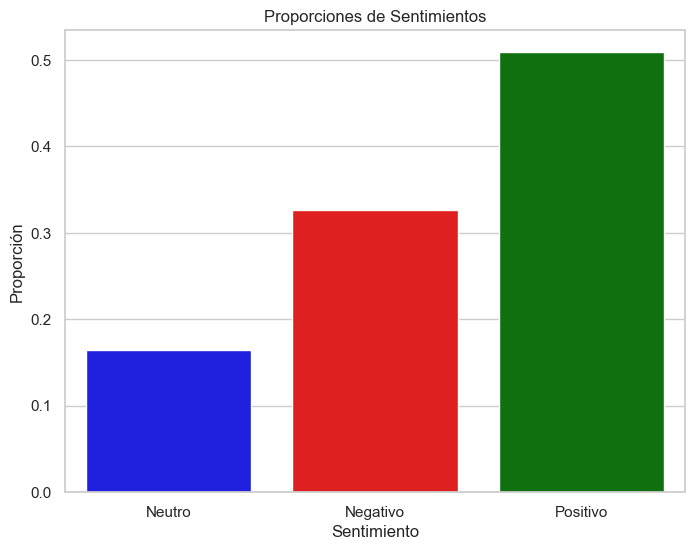

In [156]:
# Crear un gráfico de barras
sns.set(style="whitegrid")
plt.figure(figsize=(8, 6))
# Crear una paleta de colores personalizada
colores = {'Neutro': 'blue', 'Positivo': 'green', 'Negativo': 'red'}
# Definir los colores de las barras utilizando la columna 'Sentimiento'
df_proporcionestx['Color'] = df_proporcionestx['Sentimiento'].map(colores)
# Usar seaborn para crear el gráfico de barras
sns.barplot(x='Sentimiento', y='Proporcion', data=df_proporcionestx, palette=df_proporcionesrv['Color'])

# Personalizar el gráfico
plt.title('Proporciones de Sentimientos')
plt.xlabel('Sentimiento')
plt.ylabel('Proporción')

# KPI 3

	Promedio de sentimiento: 
Puntuación promedio de sentimiento de las reviews, asignando valores a las palabras clave o frases, que reflejen emociones positivas o negativas, permite medir el nivel general de satisfacción y detectar tendencias.

Puntuacion promedio de sentimiento=  (∑▒〖Puntuación de sentimiento〗)/(Cantidad total de reviews)

In [157]:
tx['sentiment_score'].mean()

0.18602326732673266

# KPI 4

	Ratio por categoría de servicio: 
Analizar las reviews en función de las diferentes categorías de servicios del hotel ayuda a identificar las áreas específicas que están generando más comentarios emocionales.
Las categorías serían: comodidad de habitación, desayuno, limpieza y atención al cliente.

Habitación

In [158]:
# nylcular las proporciones
proporcion_neutro = len(tx[tx['room_sentiment'] == 'Neutro'])/len(tx['review'])
proporcion_negativo = len(tx[tx['room_sentiment'] == 'Negativo'])/len(tx['review'])
proporcion_positivo = len(tx[tx['room_sentiment'] == 'Positivo'])/len(tx['review'])

# Crear un DataFrame con las proporciones
data = {'Sentimiento': ['Neutro', 'Negativo', 'Positivo'],
        'Proporcion': [proporcion_neutro, proporcion_negativo, proporcion_positivo]}

df_proporciones = pd.DataFrame(data)

# Ahora 'df_proporciones' contiene las proporciones nylculadas
df_proporciones

,Sentimiento,Proporcion
0,Neutro,0.387129
1,Negativo,0.372277
2,Positivo,0.240594


/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


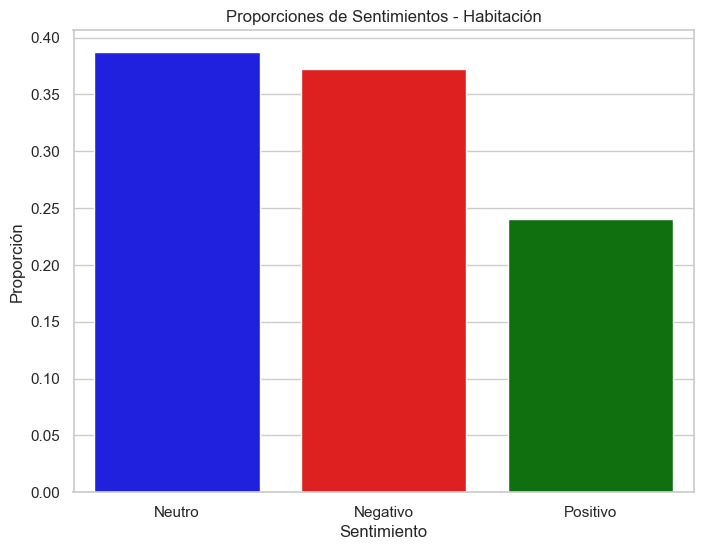

In [159]:
# Crear una paleta de colores personalizada
colores = {'Neutro': 'blue', 'Positivo': 'green', 'Negativo': 'red'}

# Definir los colores de las barras utilizando la columna 'Sentimiento'
df_proporciones['Color'] = df_proporciones['Sentimiento'].map(colores)

# Configurar el estilo de Seaborn
sns.set(style="whitegrid")

# Crear el gráfico de barras utilizando la paleta personalizada
plt.figure(figsize=(8, 6))
sns.barplot(x='Sentimiento', y='Proporcion', data=df_proporciones, palette=df_proporciones['Color'])

# Personalizar el gráfico
plt.title('Proporciones de Sentimientos - Habitación')
plt.xlabel('Sentimiento')
plt.ylabel('Proporción')

# Mostrar el gráfico
plt.show()

Servicio

In [160]:
# Calcular las proporciones
proporcion_neutro = len(tx[tx['guest_service_sentiment'] == 'Neutro'])/len(tx['review'])
proporcion_negativo = len(tx[tx['guest_service_sentiment'] == 'Negativo'])/len(tx['review'])
proporcion_positivo = len(tx[tx['guest_service_sentiment'] == 'Positivo'])/len(tx['review'])

# Crear un DataFrame con las proporciones
data = {'Sentimiento': ['Neutro', 'Negativo', 'Positivo'],
        'Proporcion': [proporcion_neutro, proporcion_negativo, proporcion_positivo]}

df_proporciones = pd.DataFrame(data)

# Ahora 'df_proporciones' contiene las proporciones calculadas
df_proporciones

,Sentimiento,Proporcion
0,Neutro,0.441584
1,Negativo,0.225743
2,Positivo,0.332673


/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


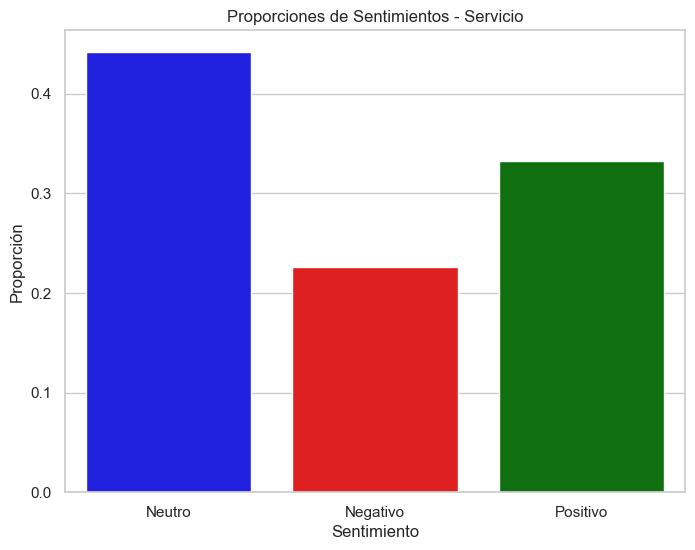

In [161]:
# Crear una paleta de colores personalizada
colores = {'Neutro': 'blue', 'Positivo': 'green', 'Negativo': 'red'}

# Definir los colores de las barras utilizando la columna 'Sentimiento'
df_proporciones['Color'] = df_proporciones['Sentimiento'].map(colores)

# Configurar el estilo de Seaborn
sns.set(style="whitegrid")

# Crear el gráfico de barras utilizando la paleta personalizada
plt.figure(figsize=(8, 6))
sns.barplot(x='Sentimiento', y='Proporcion', data=df_proporciones, palette=df_proporciones['Color'])

# Personalizar el gráfico
plt.title('Proporciones de Sentimientos - Servicio')
plt.xlabel('Sentimiento')
plt.ylabel('Proporción')

# Mostrar el gráfico
plt.show()

Limpieza

In [162]:
# Calcular las proporciones
proporcion_neutro = len(tx[tx['cleaning_sentiment'] == 'Neutro'])/len(tx['review'])
proporcion_negativo = len(tx[tx['cleaning_sentiment'] == 'Negativo'])/len(tx['review'])
proporcion_positivo = len(tx[tx['cleaning_sentiment'] == 'Positivo'])/len(tx['review'])

# Crear un DataFrame con las proporciones
data = {'Sentimiento': ['Neutro', 'Negativo', 'Positivo'],
        'Proporcion': [proporcion_neutro, proporcion_negativo, proporcion_positivo]}

df_proporciones = pd.DataFrame(data)

# Ahora 'df_proporciones' contiene las proporciones calculadas
df_proporciones

,Sentimiento,Proporcion
0,Neutro,0.454455
1,Negativo,0.317822
2,Positivo,0.227723


/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


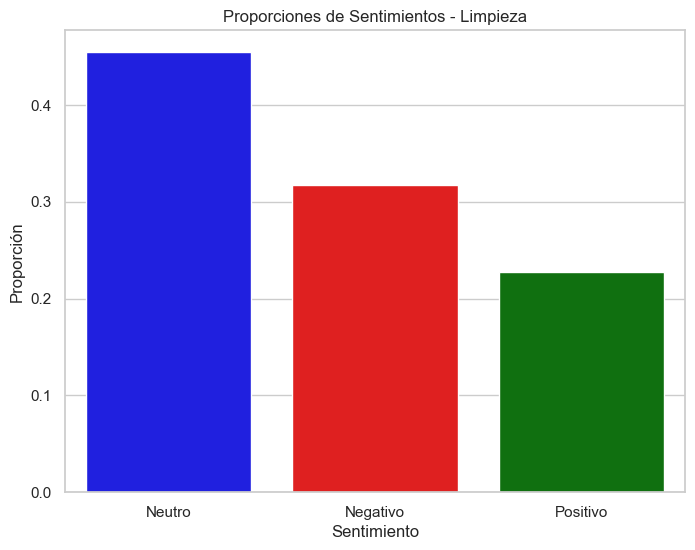

In [163]:
# Crear una paleta de colores personalizada
colores = {'Neutro': 'blue', 'Positivo': 'green', 'Negativo': 'red'}

# Definir los colores de las barras utilizando la columna 'Sentimiento'
df_proporciones['Color'] = df_proporciones['Sentimiento'].map(colores)

# Configurar el estilo de Seaborn
sns.set(style="whitegrid")

# Crear el gráfico de barras utilizando la paleta personalizada
plt.figure(figsize=(8, 6))
sns.barplot(x='Sentimiento', y='Proporcion', data=df_proporciones, palette=df_proporciones['Color'])

# Personalizar el gráfico
plt.title('Proporciones de Sentimientos - Limpieza')
plt.xlabel('Sentimiento')
plt.ylabel('Proporción')

# Mostrar el gráfico
plt.show()

Desayuno

In [164]:
# Calcular las proporciones
proporcion_neutro = len(tx[tx['breakfast_sentiment'] == 'Neutro'])/len(tx['review'])
proporcion_negativo = len(tx[tx['breakfast_sentiment'] == 'Negativo'])/len(tx['review'])
proporcion_positivo = len(tx[tx['breakfast_sentiment'] == 'Positivo'])/len(tx['review'])

# Crear un DataFrame con las proporciones
data = {'Sentimiento': ['Neutro', 'Negativo', 'Positivo'],
        'Proporcion': [proporcion_neutro, proporcion_negativo, proporcion_positivo]}

df_proporciones = pd.DataFrame(data)

# Ahora 'df_proporciones' contiene las proporciones calculadas
df_proporciones

,Sentimiento,Proporcion
0,Neutro,0.837624
1,Negativo,0.098020
2,Positivo,0.064356


/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


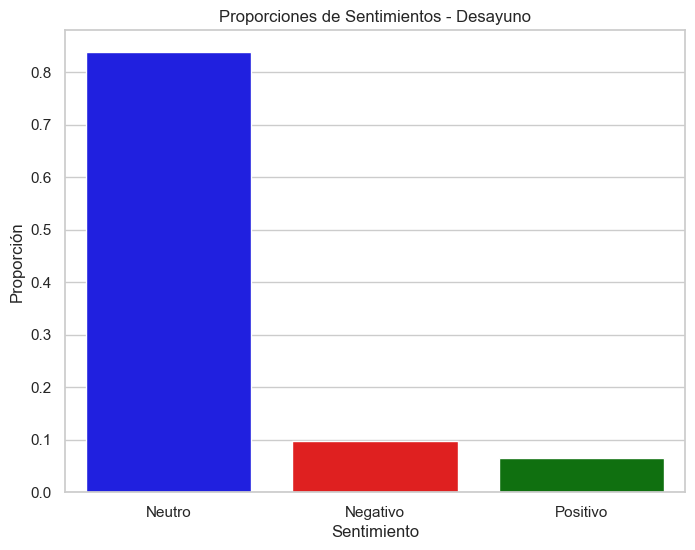

In [165]:
# Crear una paleta de colores personalizada
colores = {'Neutro': 'blue', 'Positivo': 'green', 'Negativo': 'red'}

# Definir los colores de las barras utilizando la columna 'Sentimiento'
df_proporciones['Color'] = df_proporciones['Sentimiento'].map(colores)

# Configurar el estilo de Seaborn
sns.set(style="whitegrid")

# Crear el gráfico de barras utilizando la paleta personalizada
plt.figure(figsize=(8, 6))
sns.barplot(x='Sentimiento', y='Proporcion', data=df_proporciones, palette=df_proporciones['Color'])

# Personalizar el gráfico
plt.title('Proporciones de Sentimientos - Desayuno')
plt.xlabel('Sentimiento')
plt.ylabel('Proporción')

# Mostrar el gráfico
plt.show()

# KPI 5

	Comparación de sentimiento: Comparar el sentimiento de las reviews de tu hotel con el de los competidores directos proporciona una visión comparativa y ayuda a identificar áreas en las que se puede aprender de la competencia o destacar por encima de ella.


Ratio de promedios de nuestro cliente sobre competencia

=  (Promedio de sentimiento de nuestro cliente)/(Promedio de sentimiento de la competencia)

In [166]:
# filtrar clientes de la competencia

competenciatx = model[(model['state'] == 'TX') & (model['lodging_name'] != cliente[4])]
competenciatx.shape

(739, 21)

In [167]:
cltx = tx['sentiment_score'].mean() 
comtx = competenciatx['sentiment_score'].mean()

# Crear un DataFrame con las proporciones
data = {'Holetes': ['Cliente', 'Competencia'],
        'Avg_Sentimiento': [cltx, comtx]}

ratio = pd.DataFrame(data)

# Ahora 'ratio' contiene las proporciones calculadas
ratio

,Holetes,Avg_Sentimiento
0,Cliente,0.186023
1,Competencia,0.460420


# INSIGHTS

## Relación entre el número de calificaciones y el promedio de las mismas por mes

# Ramada by Wyndham Houston Intercontinental Airport East -TX

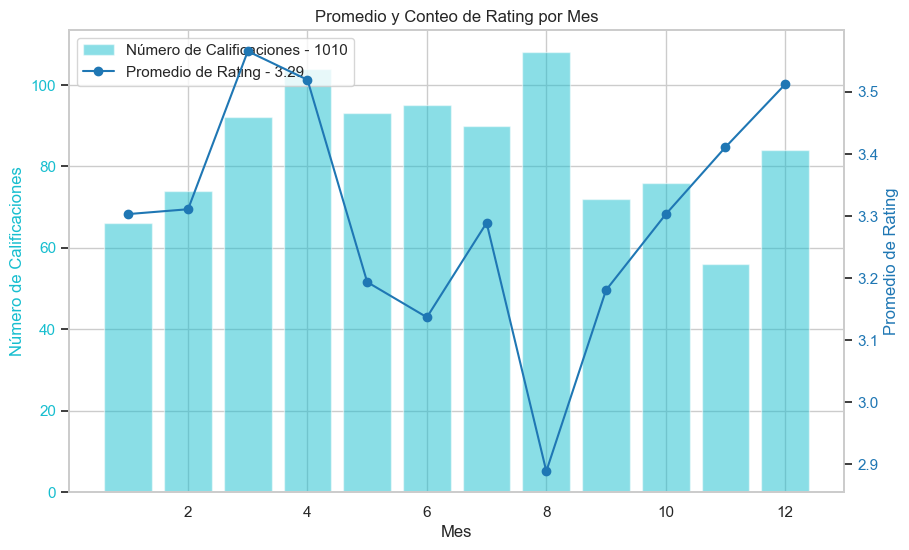

In [168]:
# Calcular el promedio del rating por mes y año para cada hotel
rtx = tx.groupby(['month'])['rating'].agg(['mean', 'count']).sort_index()
rtx.reset_index()

# Calcular el conteo y promedio de calificaciones
contca = tx['rating'].count()
avgca = round(tx['rating'].mean(),2)
# Crear una figura y ejes
fig, ax1 = plt.subplots(figsize=(10, 6))

# Configurar el primer eje y agregar el gráfico de barras para el conteo de ratings por mes
color = 'tab:cyan'
ax1.set_xlabel('Mes')
ax1.set_ylabel('Número de Calificaciones', color=color)
ax1.bar(rtx.index, rtx['count'], color=color, alpha=0.5, label=f'Número de Calificaciones - {contca}')
ax1.tick_params(axis='y', labelcolor=color)

# Crear un segundo eje compartiendo el mismo eje x
ax2 = ax1.twinx()

# Agregar el gráfico de línea para el promedio de rating por mes en el segundo eje
color = 'tab:blue'
ax2.set_ylabel('Promedio de Rating', color=color)
ax2.plot(rtx.index, rtx['mean'], marker='o', linestyle='-', color=color, label=f'Promedio de Rating - {avgca}')
ax2.tick_params(axis='y', labelcolor=color)

# Establecer título
plt.title('Promedio y Conteo de Rating por Mes')

# Agregar una leyenda combinada para ambos ejes
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
lines = lines1 + lines2
labels = labels1 + labels2
ax1.legend(lines, labels, loc='upper left')

# Mostrar el gráfico
plt.grid()
plt.show()

[nltk_data] Downloading package stopwords to /Users/hugo/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


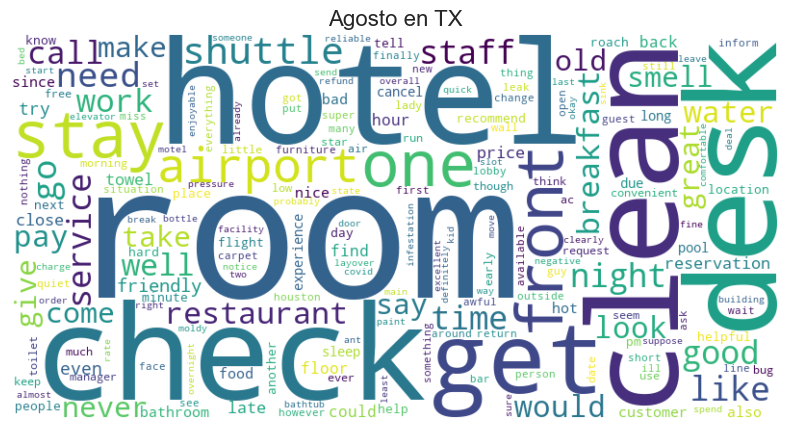

In [169]:
# Filtrar por Agosto para hacer nube de palabras

agosto = tx[tx['month']==8]
# tokenizando
text = agosto['clean_review'].str.cat()
text = text.lower()  # Convierte a minúsculas
text = ''.join([c for c in text if c.isalpha() or c.isspace()])  # Elimina caracteres no alfabéticos
# Tokenización
nltk.download('stopwords')
words = nltk.word_tokenize(text)
stop_words = set(stopwords.words('english'))
words = [word for word in words if word not in stop_words]  # Elimina palabras vacías

# Análisis de frecuencia de palabras
freq_dist = nltk.FreqDist(words)

# Creación de la Word Cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(freq_dist)

# Visualización
plt.figure(figsize=(10, 5))
plt.title('Agosto en TX', fontsize=16)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

[nltk_data] Downloading package stopwords to /Users/hugo/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


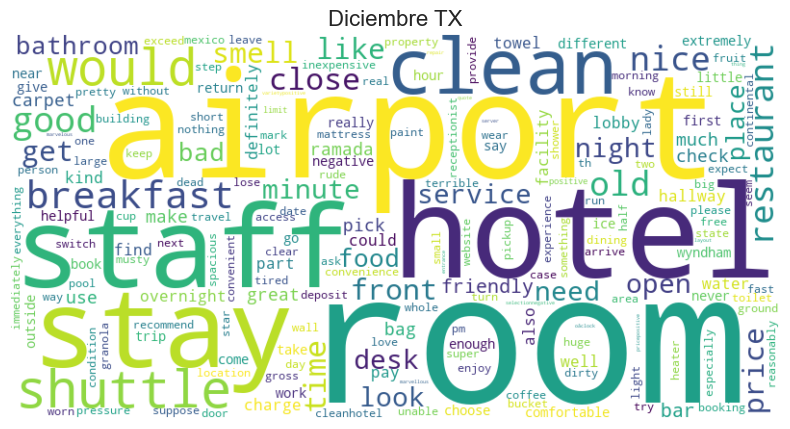

In [170]:
# Filtrar por diciembre para hacer nube de palabras

diciembre = tx[tx['month']==12]
# tokenizando
text = diciembre['clean_review'].str.cat()
text = text.lower()  # Convierte a minúsculas
text = ''.join([c for c in text if c.isalpha() or c.isspace()])  # Elimina caracteres no alfabéticos
# Tokenización
nltk.download('stopwords')
words = nltk.word_tokenize(text)
stop_words = set(stopwords.words('english'))
words = [word for word in words if word not in stop_words]  # Elimina palabras vacías

# Análisis de frecuencia de palabras
freq_dist = nltk.FreqDist(words)

# Creación de la Word Cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(freq_dist)

# Visualización
plt.figure(figsize=(10, 5))
plt.title('Diciembre TX', fontsize=16)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a futu

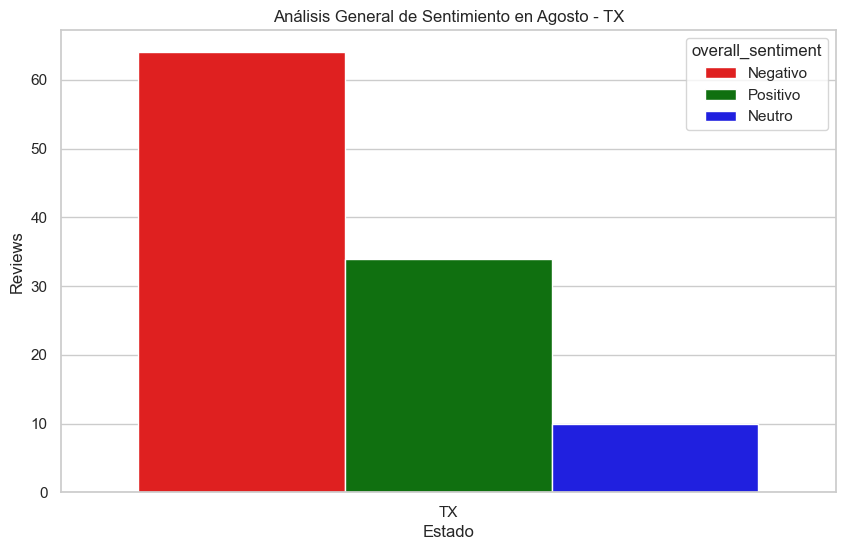

In [171]:
# Gráfico por sentimiento General en el mes de Agosto
# Crear una paleta de colores personalizada
colores = {'Neutro': 'blue', 'Positivo': 'green', 'Negativo': 'red'}
# Crear un gráfico de barras apiladas
sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))

# Agrupar por 'state' y 'overall_sentiment' y calcular la suma del conteo
dataov = agosto.groupby(['state', 'lodging_name'])['overall_sentiment'].value_counts().reset_index(name='conteo')
dataov['Color'] = dataov['overall_sentiment'].map(colores)
# Crear el gráfico de barras apiladas
ax = sns.barplot(x='state', y='conteo', hue='overall_sentiment', data=dataov, palette=dataov['Color'])

# Personalizar el gráfico
plt.title('Análisis General de Sentimiento en Agosto - TX')
plt.xlabel('Estado')
plt.ylabel('Reviews')

# Mostrar el gráfico
plt.show()

/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a futu

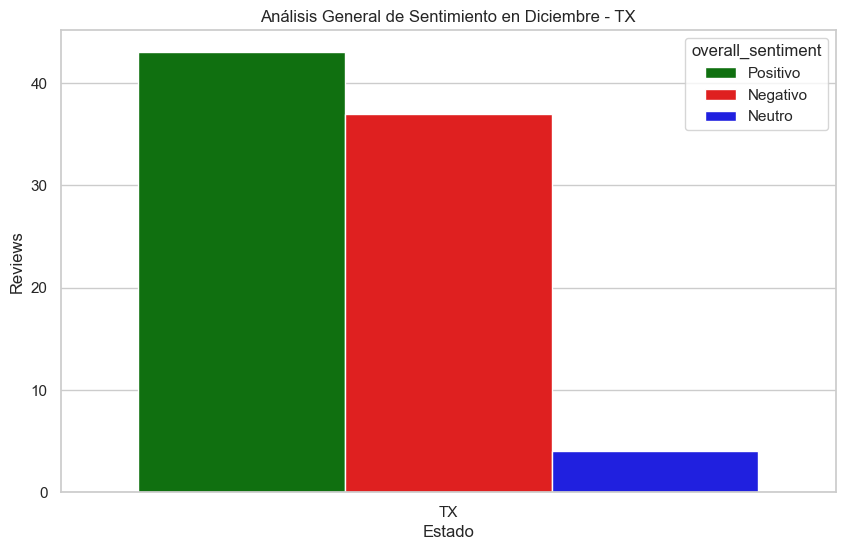

In [172]:
# Gráfico por sentimiento General en el mes de Diciembre
# Crear una paleta de colores personalizada
colores = {'Neutro': 'blue', 'Positivo': 'green', 'Negativo': 'red'}
# Crear un gráfico de barras apiladas
sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))

# Agrupar por 'state' y 'overall_sentiment' y calcular la suma del conteo
dataov = diciembre.groupby(['state', 'lodging_name'])['overall_sentiment'].value_counts().reset_index(name='conteo')
dataov['Color'] = dataov['overall_sentiment'].map(colores)
# Crear el gráfico de barras apiladas
ax = sns.barplot(x='state', y='conteo', hue='overall_sentiment', data=dataov, palette=dataov['Color'])

# Personalizar el gráfico
plt.title('Análisis General de Sentimiento en Diciembre - TX')
plt.xlabel('Estado')
plt.ylabel('Reviews')

# Mostrar el gráfico
plt.show()

# Ramada by Wyndham Reno Hotel & Casino - NV

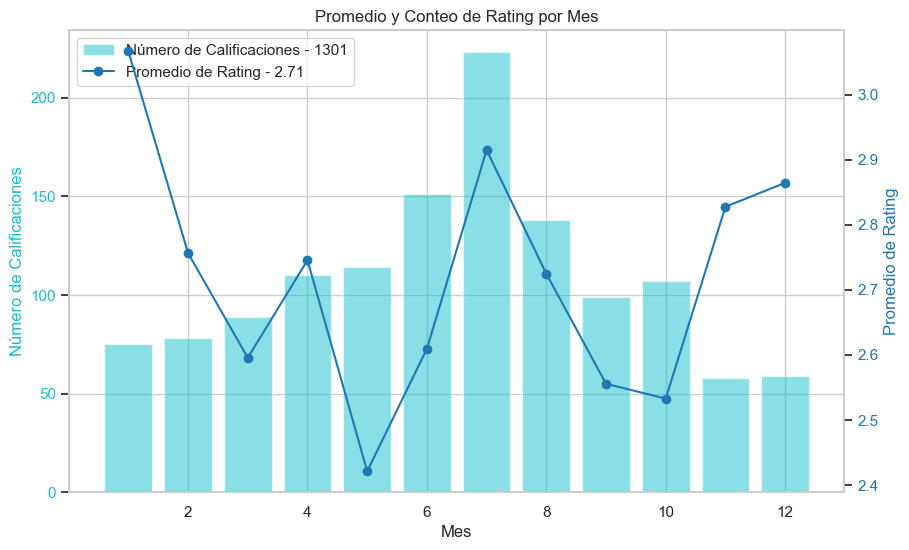

In [173]:
# Calcular el promedio del rating por mes y año para cada hotel
rnv = nv.groupby(['month'])['rating'].agg(['mean', 'count']).sort_index()
rnv.reset_index()

# Calcular el conteo y promedio de calificaciones
contca = nv['rating'].count()
avgca = round(nv['rating'].mean(),2)
# Crear una figura y ejes
fig, ax1 = plt.subplots(figsize=(10, 6))

# Configurar el primer eje y agregar el gráfico de barras para el conteo de ratings por mes
color = 'tab:cyan'
ax1.set_xlabel('Mes')
ax1.set_ylabel('Número de Calificaciones', color=color)
ax1.bar(rnv.index, rnv['count'], color=color, alpha=0.5, label=f'Número de Calificaciones - {contca}')
ax1.tick_params(axis='y', labelcolor=color)

# Crear un segundo eje compartiendo el mismo eje x
ax2 = ax1.twinx()

# Agregar el gráfico de línea para el promedio de rating por mes en el segundo eje
color = 'tab:blue'
ax2.set_ylabel('Promedio de Rating', color=color)
ax2.plot(rnv.index, rnv['mean'], marker='o', linestyle='-', color=color, label=f'Promedio de Rating - {avgca}')
ax2.tick_params(axis='y', labelcolor=color)

# Establecer título
plt.title('Promedio y Conteo de Rating por Mes')

# Agregar una leyenda combinada para ambos ejes
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
lines = lines1 + lines2
labels = labels1 + labels2
ax1.legend(lines, labels, loc='upper left')

# Mostrar el gráfico
plt.grid()
plt.show()

[nltk_data] Downloading package stopwords to /Users/hugo/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


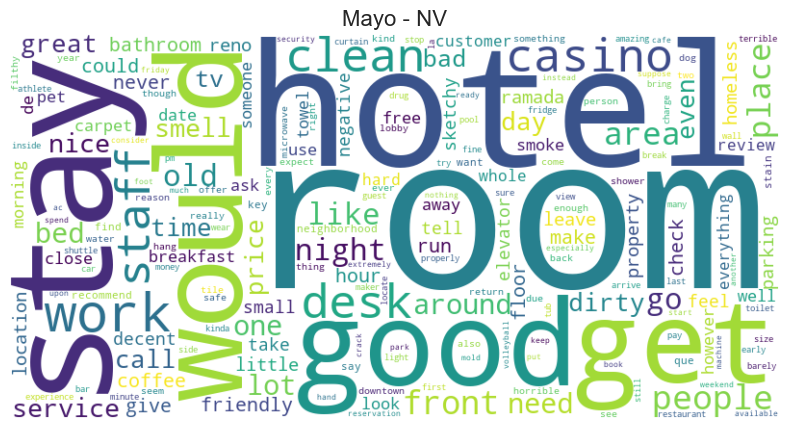

In [174]:
# Filtrar por Mayo para hacer nube de palabras

mayo = nv[nv['month']==5]
# tokenizando
text = mayo['clean_review'].str.cat()
text = text.lower()  # Convierte a minúsculas
text = ''.join([c for c in text if c.isalpha() or c.isspace()])  # Elimina caracteres no alfabéticos
# Tokenización
nltk.download('stopwords')
words = nltk.word_tokenize(text)
stop_words = set(stopwords.words('english'))
words = [word for word in words if word not in stop_words]  # Elimina palabras vacías

# Análisis de frecuencia de palabras
freq_dist = nltk.FreqDist(words)

# Creación de la Word Cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(freq_dist)

# Visualización
plt.figure(figsize=(10, 5))
plt.title('Mayo - NV', fontsize=16)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

[nltk_data] Downloading package stopwords to /Users/hugo/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


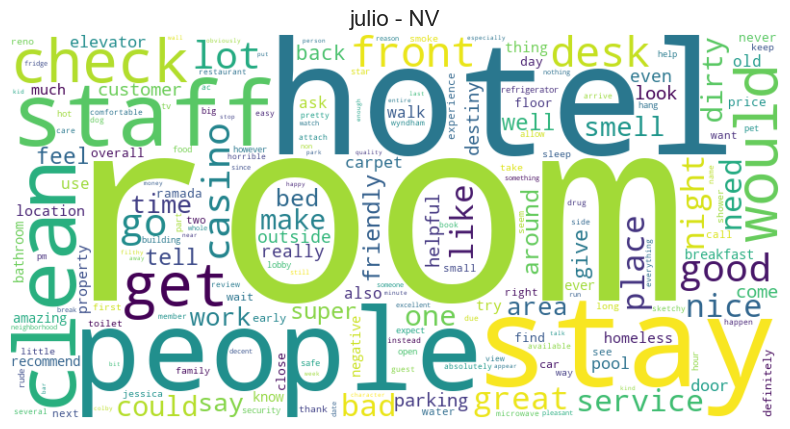

In [175]:
# Filtrar por Julio para hacer nube de palabras

julio = nv[nv['month']==7]
# tokenizando
text = julio['clean_review'].str.cat()
text = text.lower()  # Convierte a minúsculas
text = ''.join([c for c in text if c.isalpha() or c.isspace()])  # Elimina caracteres no alfabéticos
# Tokenización
nltk.download('stopwords')
words = nltk.word_tokenize(text)
stop_words = set(stopwords.words('english'))
words = [word for word in words if word not in stop_words]  # Elimina palabras vacías

# Análisis de frecuencia de palabras
freq_dist = nltk.FreqDist(words)

# Creación de la Word Cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(freq_dist)

# Visualización
plt.figure(figsize=(10, 5))
plt.title('julio - NV', fontsize=16)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a futu

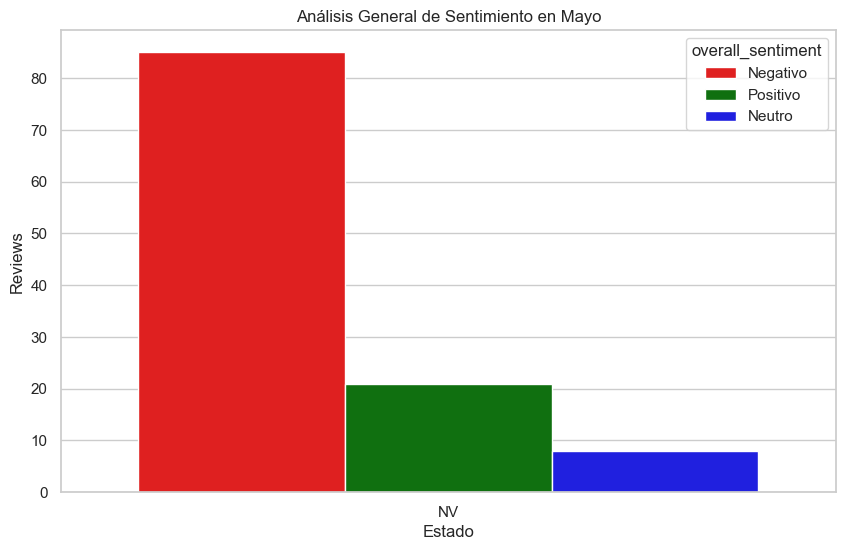

In [176]:
# Gráfico por sentimiento General en el mes de MAYO
# Crear una paleta de colores personalizada
colores = {'Neutro': 'blue', 'Positivo': 'green', 'Negativo': 'red'}
# Crear un gráfico de barras apiladas
sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))

# Agrupar por 'state' y 'overall_sentiment' y calcular la suma del conteo
dataov = mayo.groupby(['state', 'lodging_name'])['overall_sentiment'].value_counts().reset_index(name='conteo')
dataov['Color'] = dataov['overall_sentiment'].map(colores)
# Crear el gráfico de barras apiladas
ax = sns.barplot(x='state', y='conteo', hue='overall_sentiment', data=dataov, palette=dataov['Color'])

# Personalizar el gráfico
plt.title('Análisis General de Sentimiento en Mayo')
plt.xlabel('Estado')
plt.ylabel('Reviews')

# Mostrar el gráfico
plt.show()

/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a futu

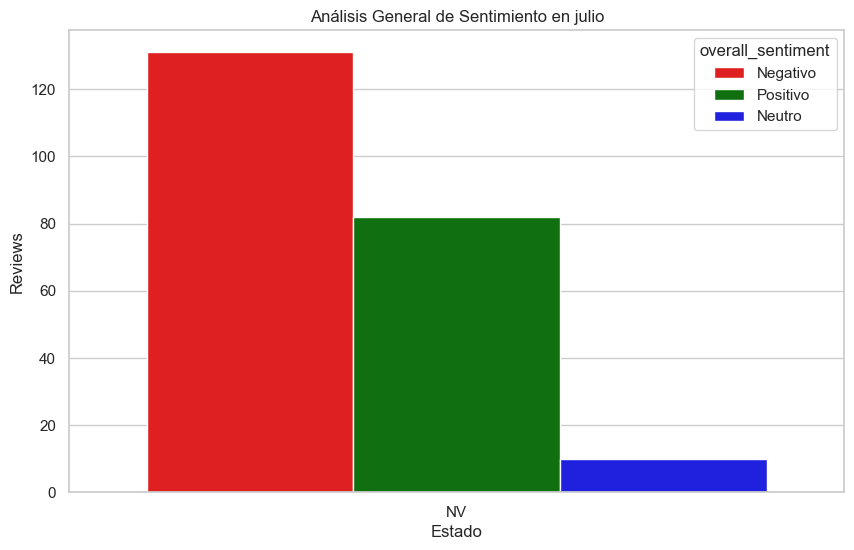

In [177]:
# Gráfico por sentimiento General en el mes de Julio
# Crear una paleta de colores personalizada
colores = {'Neutro': 'blue', 'Positivo': 'green', 'Negativo': 'red'}
# Crear un gráfico de barras apiladas
sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))

# Agrupar por 'state' y 'overall_sentiment' y calcular la suma del conteo
dataov = julio.groupby(['state', 'lodging_name'])['overall_sentiment'].value_counts().reset_index(name='conteo')
dataov['Color'] = dataov['overall_sentiment'].map(colores)
# Crear el gráfico de barras apiladas
ax = sns.barplot(x='state', y='conteo', hue='overall_sentiment', data=dataov, palette=dataov['Color'])

# Personalizar el gráfico
plt.title('Análisis General de Sentimiento en julio')
plt.xlabel('Estado')
plt.ylabel('Reviews')

# Mostrar el gráfico
plt.show()

# Ramada Plaza by Wyndham Orlando Resort & Suites Intl Drive - FL

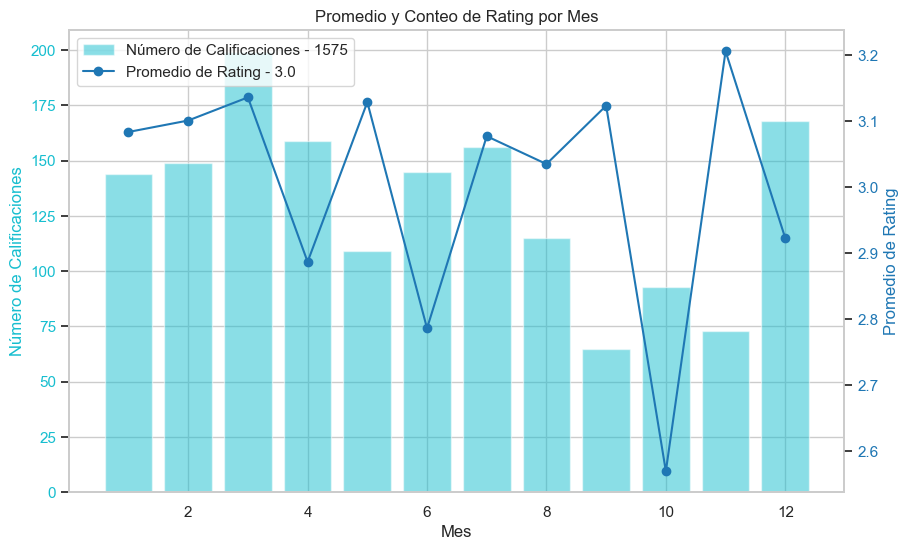

In [178]:
# Calcular el promedio del rating por mes y año para cada hotel
rfl = fl.groupby(['month'])['rating'].agg(['mean', 'count']).sort_index()
rfl.reset_index()

# Calcular el conteo y promedio de calificaciones
contca = fl['rating'].count()
avgca = round(fl['rating'].mean(),2)
# Crear una figura y ejes
fig, ax1 = plt.subplots(figsize=(10, 6))

# Configurar el primer eje y agregar el gráfico de barras para el conteo de ratings por mes
color = 'tab:cyan'
ax1.set_xlabel('Mes')
ax1.set_ylabel('Número de Calificaciones', color=color)
ax1.bar(rfl.index, rfl['count'], color=color, alpha=0.5, label=f'Número de Calificaciones - {contca}')
ax1.tick_params(axis='y', labelcolor=color)

# Crear un segundo eje compartiendo el mismo eje x
ax2 = ax1.twinx()

# Agregar el gráfico de línea para el promedio de rating por mes en el segundo eje
color = 'tab:blue'
ax2.set_ylabel('Promedio de Rating', color=color)
ax2.plot(rfl.index, rfl['mean'], marker='o', linestyle='-', color=color, label=f'Promedio de Rating - {avgca}')
ax2.tick_params(axis='y', labelcolor=color)

# Establecer título
plt.title('Promedio y Conteo de Rating por Mes')

# Agregar una leyenda combinada para ambos ejes
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
lines = lines1 + lines2
labels = labels1 + labels2
ax1.legend(lines, labels, loc='upper left')

# Mostrar el gráfico
plt.grid()
plt.show()

[nltk_data] Downloading package stopwords to /Users/hugo/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


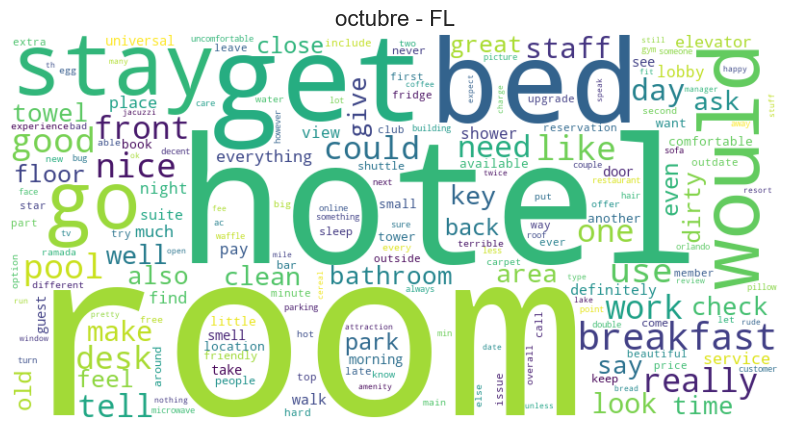

In [179]:
# Filtrar por octubre para hacer nube de palabras

octubre = fl[fl['month']==10]
# tokenizando
text = octubre['clean_review'].str.cat()
text = text.lower()  # Convierte a minúsculas
text = ''.join([c for c in text if c.isalpha() or c.isspace()])  # Elimina caracteres no alfabéticos
# Tokenización
nltk.download('stopwords')
words = nltk.word_tokenize(text)
stop_words = set(stopwords.words('english'))
words = [word for word in words if word not in stop_words]  # Elimina palabras vacías

# Análisis de frecuencia de palabras
freq_dist = nltk.FreqDist(words)

# Creación de la Word Cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(freq_dist)

# Visualización
plt.figure(figsize=(10, 5))
plt.title('octubre - FL', fontsize=16)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

[nltk_data] Downloading package stopwords to /Users/hugo/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


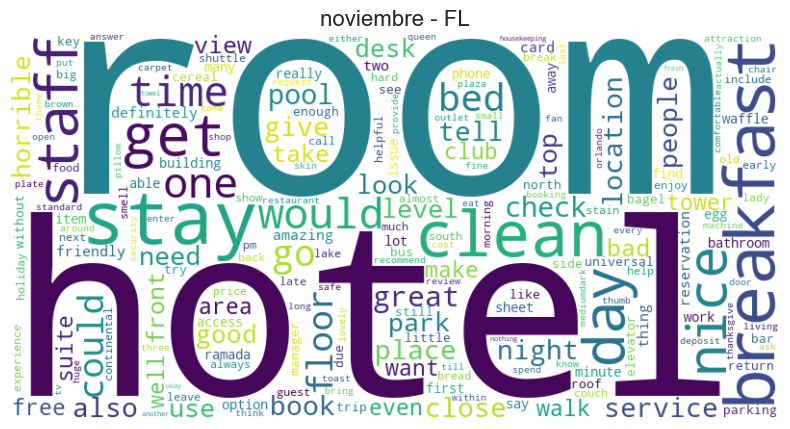

In [180]:
# Filtrar por noviembre para hacer nube de palabras

noviembre = fl[fl['month']==11]
# tokenizando
text = noviembre['clean_review'].str.cat()
text = text.lower()  # Convierte a minúsculas
text = ''.join([c for c in text if c.isalpha() or c.isspace()])  # Elimina caracteres no alfabéticos
# Tokenización
nltk.download('stopwords')
words = nltk.word_tokenize(text)
stop_words = set(stopwords.words('english'))
words = [word for word in words if word not in stop_words]  # Elimina palabras vacías

# Análisis de frecuencia de palabras
freq_dist = nltk.FreqDist(words)

# Creación de la Word Cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(freq_dist)

# Visualización
plt.figure(figsize=(10, 5))
plt.title('noviembre - FL', fontsize=16)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a futu

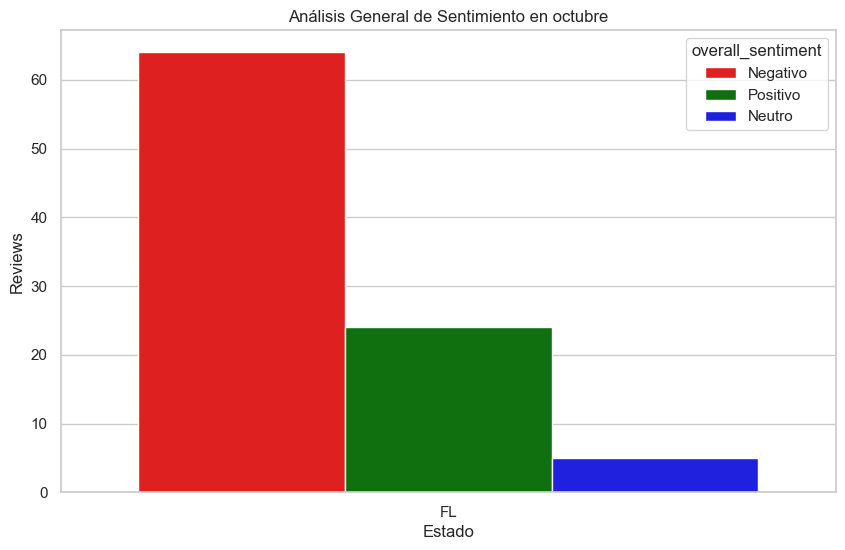

In [181]:
# Gráfico por sentimiento General en el mes de octubre
# Crear una paleta de colores personalizada
colores = {'Neutro': 'blue', 'Positivo': 'green', 'Negativo': 'red'}
# Crear un gráfico de barras apiladas
sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))

# Agrupar por 'state' y 'overall_sentiment' y calcular la suma del conteo
dataov = octubre.groupby(['state', 'lodging_name'])['overall_sentiment'].value_counts().reset_index(name='conteo')
dataov['Color'] = dataov['overall_sentiment'].map(colores)
# Crear el gráfico de barras apiladas
ax = sns.barplot(x='state', y='conteo', hue='overall_sentiment', data=dataov, palette=dataov['Color'])

# Personalizar el gráfico
plt.title('Análisis General de Sentimiento en octubre')
plt.xlabel('Estado')
plt.ylabel('Reviews')

# Mostrar el gráfico
plt.show()

/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a futu

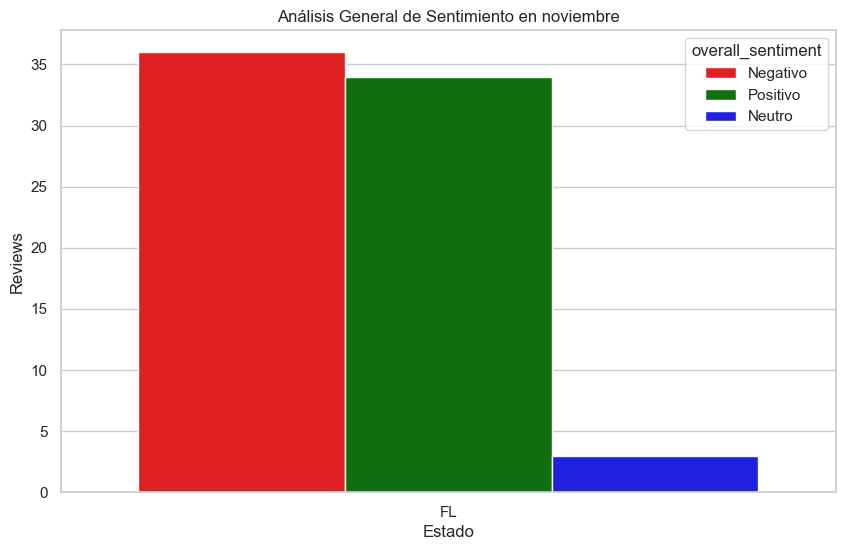

In [182]:
# Gráfico por sentimiento General en el mes de noviembre
# Crear una paleta de colores personalizada
colores = {'Neutro': 'blue', 'Positivo': 'green', 'Negativo': 'red'}
# Crear un gráfico de barras apiladas
sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))

# Agrupar por 'state' y 'overall_sentiment' y calcular la suma del conteo
dataov = noviembre.groupby(['state', 'lodging_name'])['overall_sentiment'].value_counts().reset_index(name='conteo')
dataov['Color'] = dataov['overall_sentiment'].map(colores)
# Crear el gráfico de barras apiladas
ax = sns.barplot(x='state', y='conteo', hue='overall_sentiment', data=dataov, palette=dataov['Color'])

# Personalizar el gráfico
plt.title('Análisis General de Sentimiento en noviembre')
plt.xlabel('Estado')
plt.ylabel('Reviews')

# Mostrar el gráfico
plt.show()

# Ramada by Wyndham New York Times Square West - NY

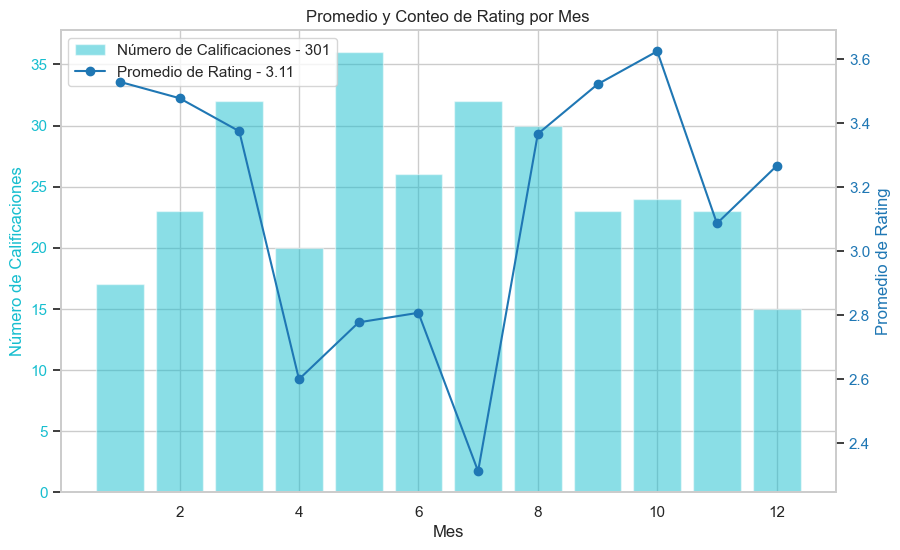

In [183]:
# Calcular el promedio del rating por mes y año para cada hotel
rny = ny.groupby(['month'])['rating'].agg(['mean', 'count']).sort_index()
rny.reset_index()

# Calcular el conteo y promedio de calificaciones
contca = ny['rating'].count()
avgca = round(ny['rating'].mean(),2)
# Crear una figura y ejes
fig, ax1 = plt.subplots(figsize=(10, 6))

# Configurar el primer eje y agregar el gráfico de barras para el conteo de ratings por mes
color = 'tab:cyan'
ax1.set_xlabel('Mes')
ax1.set_ylabel('Número de Calificaciones', color=color)
ax1.bar(rny.index, rny['count'], color=color, alpha=0.5, label=f'Número de Calificaciones - {contca}')
ax1.tick_params(axis='y', labelcolor=color)

# Crear un segundo eje compartiendo el mismo eje x
ax2 = ax1.twinx()

# Agregar el gráfico de línea para el promedio de rating por mes en el segundo eje
color = 'tab:blue'
ax2.set_ylabel('Promedio de Rating', color=color)
ax2.plot(rny.index, rny['mean'], marker='o', linestyle='-', color=color, label=f'Promedio de Rating - {avgca}')
ax2.tick_params(axis='y', labelcolor=color)

# Establecer título
plt.title('Promedio y Conteo de Rating por Mes')

# Agregar una leyenda combinada para ambos ejes
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
lines = lines1 + lines2
labels = labels1 + labels2
ax1.legend(lines, labels, loc='upper left')

# Mostrar el gráfico
plt.grid()
plt.show()

[nltk_data] Downloading package stopwords to /Users/hugo/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


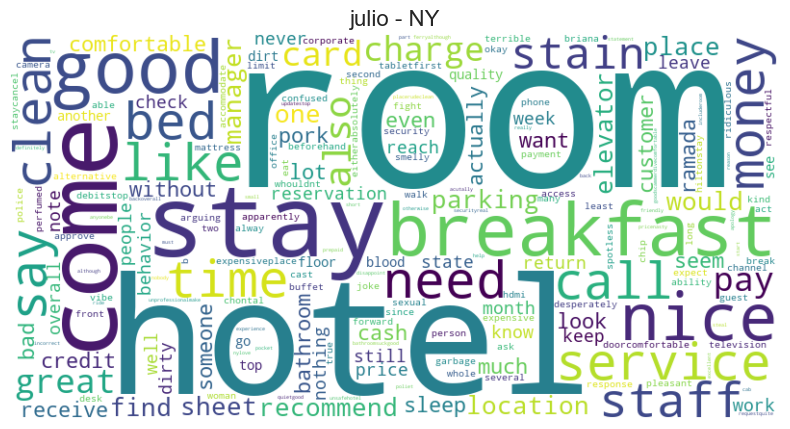

In [184]:
# Filtrar por julio para hacer nube de palabras

julio = ny[ny['month']==7]
# tokenizando
text = julio['clean_review'].str.cat()
text = text.lower()  # Convierte a minúsculas
text = ''.join([c for c in text if c.isalpha() or c.isspace()])  # Elimina caracteres no alfabéticos
# Tokenización
nltk.download('stopwords')
words = nltk.word_tokenize(text)
stop_words = set(stopwords.words('english'))
words = [word for word in words if word not in stop_words]  # Elimina palabras vacías

# Análisis de frecuencia de palabras
freq_dist = nltk.FreqDist(words)

# Creación de la Word Cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(freq_dist)

# Visualización
plt.figure(figsize=(10, 5))
plt.title('julio - NY', fontsize=16)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

[nltk_data] Downloading package stopwords to /Users/hugo/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


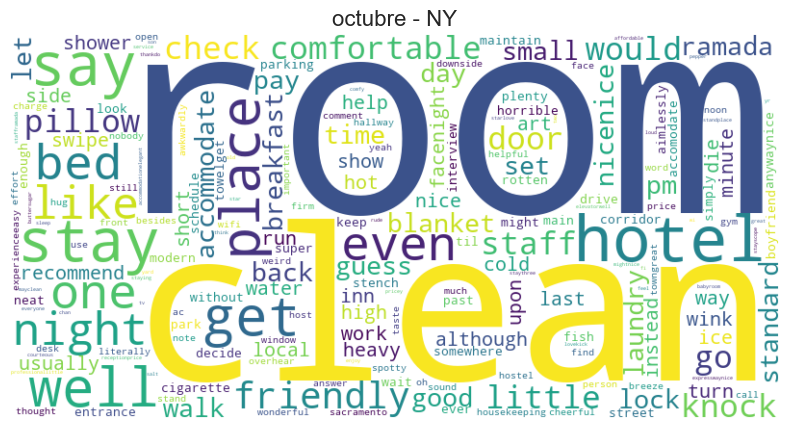

In [185]:
# Filtrar por octubre para hacer nube de palabras

octubre = ny[ny['month']==10]
# tokenizando
text = octubre['clean_review'].str.cat()
text = text.lower()  # Convierte a minúsculas
text = ''.join([c for c in text if c.isalpha() or c.isspace()])  # Elimina caracteres no alfabéticos
# Tokenización
nltk.download('stopwords')
words = nltk.word_tokenize(text)
stop_words = set(stopwords.words('english'))
words = [word for word in words if word not in stop_words]  # Elimina palabras vacías

# Análisis de frecuencia de palabras
freq_dist = nltk.FreqDist(words)

# Creación de la Word Cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(freq_dist)

# Visualización
plt.figure(figsize=(10, 5))
plt.title('octubre - NY', fontsize=16)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a futu

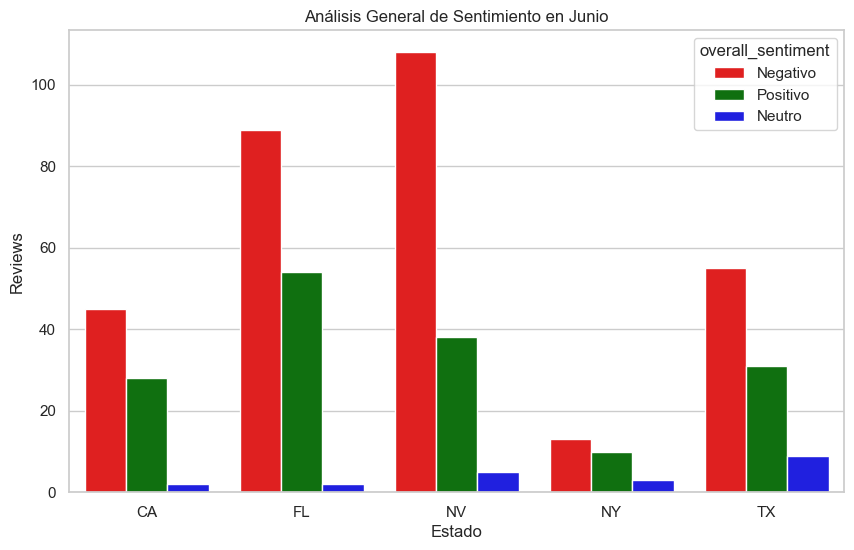

In [186]:
# Gráfico por sentimiento General en el mes de Junio
# Crear una paleta de colores personalizada
colores = {'Neutro': 'blue', 'Positivo': 'green', 'Negativo': 'red'}
# Crear un gráfico de barras apiladas
sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))

# Agrupar por 'state' y 'overall_sentiment' y calcular la suma del conteo
dataov = junio.groupby(['state', 'lodging_name'])['overall_sentiment'].value_counts().reset_index(name='conteo')
dataov['Color'] = dataov['overall_sentiment'].map(colores)
# Crear el gráfico de barras apiladas
ax = sns.barplot(x='state', y='conteo', hue='overall_sentiment', data=dataov, palette=dataov['Color'])

# Personalizar el gráfico
plt.title('Análisis General de Sentimiento en Junio')
plt.xlabel('Estado')
plt.ylabel('Reviews')

# Mostrar el gráfico
plt.show()

/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a futu

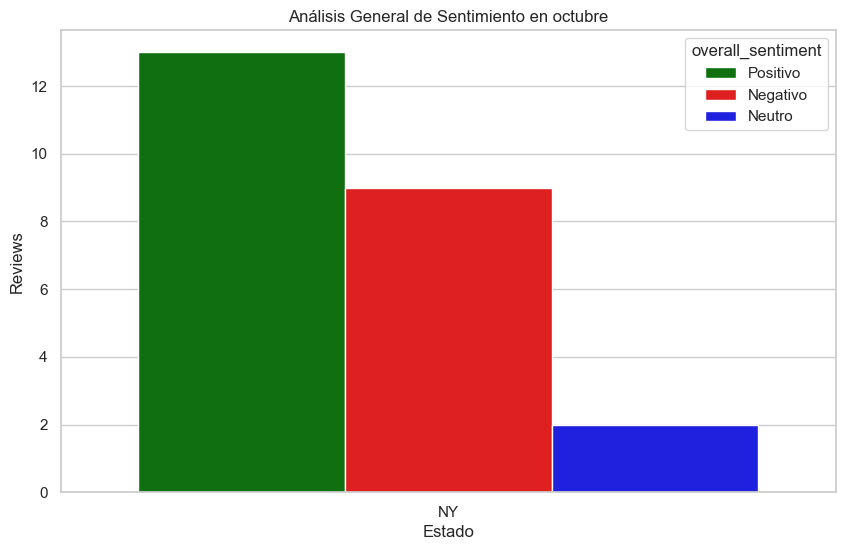

In [187]:
# Gráfico por sentimiento General en el mes de octubre
# Crear una paleta de colores personalizada
colores = {'Neutro': 'blue', 'Positivo': 'green', 'Negativo': 'red'}
# Crear un gráfico de barras apiladas
sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))

# Agrupar por 'state' y 'overall_sentiment' y calcular la suma del conteo
dataov = octubre.groupby(['state', 'lodging_name'])['overall_sentiment'].value_counts().reset_index(name='conteo')
dataov['Color'] = dataov['overall_sentiment'].map(colores)
# Crear el gráfico de barras apiladas
ax = sns.barplot(x='state', y='conteo', hue='overall_sentiment', data=dataov, palette=dataov['Color'])

# Personalizar el gráfico
plt.title('Análisis General de Sentimiento en octubre')
plt.xlabel('Estado')
plt.ylabel('Reviews')

# Mostrar el gráfico
plt.show()

# Ramada Plaza by Wyndham West Hollywood Hotel & Suites - CA

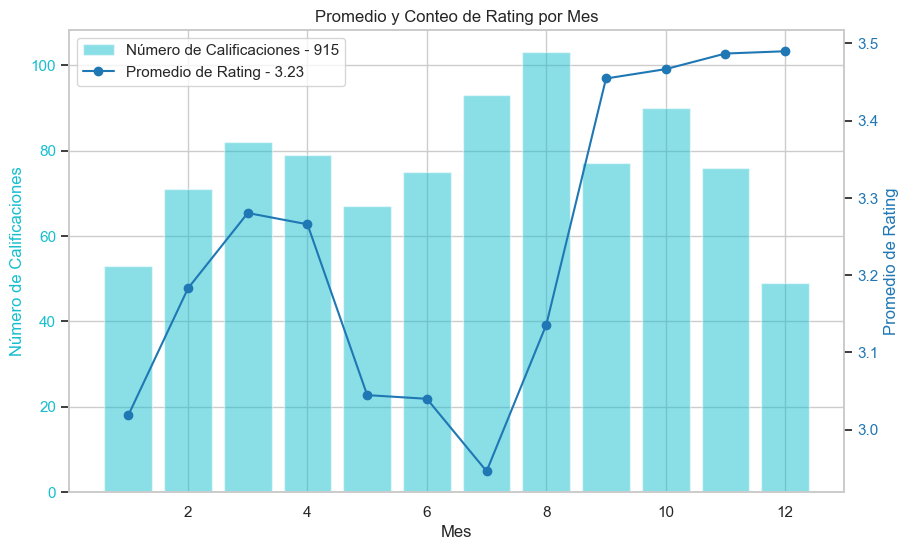

In [188]:
# Calcular el promedio del rating por mes y año para cada hotel
rca = ca.groupby(['month'])['rating'].agg(['mean', 'count']).sort_index()
rca.reset_index()

# Calcular el conteo y promedio de calificaciones
contca = ca['rating'].count()
avgca = round(ca['rating'].mean(),2)
# Crear una figura y ejes
fig, ax1 = plt.subplots(figsize=(10, 6))

# Configurar el primer eje y agregar el gráfico de barras para el conteo de ratings por mes
color = 'tab:cyan'
ax1.set_xlabel('Mes')
ax1.set_ylabel('Número de Calificaciones', color=color)
ax1.bar(rca.index, rca['count'], color=color, alpha=0.5, label=f'Número de Calificaciones - {contca}')
ax1.tick_params(axis='y', labelcolor=color)

# Crear un segundo eje compartiendo el mismo eje x
ax2 = ax1.twinx()

# Agregar el gráfico de línea para el promedio de rating por mes en el segundo eje
color = 'tab:blue'
ax2.set_ylabel('Promedio de Rating', color=color)
ax2.plot(rca.index, rca['mean'], marker='o', linestyle='-', color=color, label=f'Promedio de Rating - {avgca}')
ax2.tick_params(axis='y', labelcolor=color)

# Establecer título
plt.title('Promedio y Conteo de Rating por Mes')

# Agregar una leyenda combinada para ambos ejes
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
lines = lines1 + lines2
labels = labels1 + labels2
ax1.legend(lines, labels, loc='upper left')

# Mostrar el gráfico
plt.grid()
plt.show()

/var/folders/7b/x372r2jn4b95xj0_xs49ys4h0000gn/T/ipykernel_13079/310793924.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  julio = ca[cliente_filtrado['month']==7]
[nltk_data] Downloading package stopwords to /Users/hugo/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


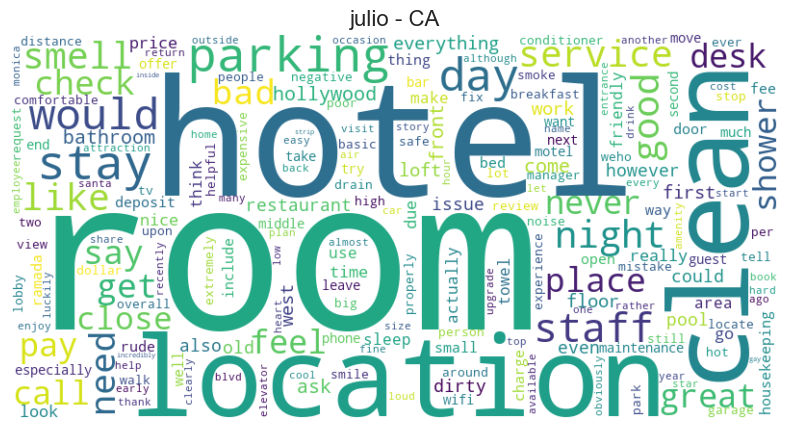

In [189]:
# Filtrar por julio para hacer nube de palabras

julio = ca[cliente_filtrado['month']==7]
# tokenizando
text = julio['clean_review'].str.cat()
text = text.lower()  # Convierte a minúsculas
text = ''.join([c for c in text if c.isalpha() or c.isspace()])  # Elimina caracteres no alfabéticos
# Tokenización
nltk.download('stopwords')
words = nltk.word_tokenize(text)
stop_words = set(stopwords.words('english'))
words = [word for word in words if word not in stop_words]  # Elimina palabras vacías

# Análisis de frecuencia de palabras
freq_dist = nltk.FreqDist(words)

# Creación de la Word Cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(freq_dist)

# Visualización
plt.figure(figsize=(10, 5))
plt.title('julio - CA', fontsize=16)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

/var/folders/7b/x372r2jn4b95xj0_xs49ys4h0000gn/T/ipykernel_13079/1477997494.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  diciembre = ca[cliente_filtrado['month']==12]
[nltk_data] Downloading package stopwords to /Users/hugo/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


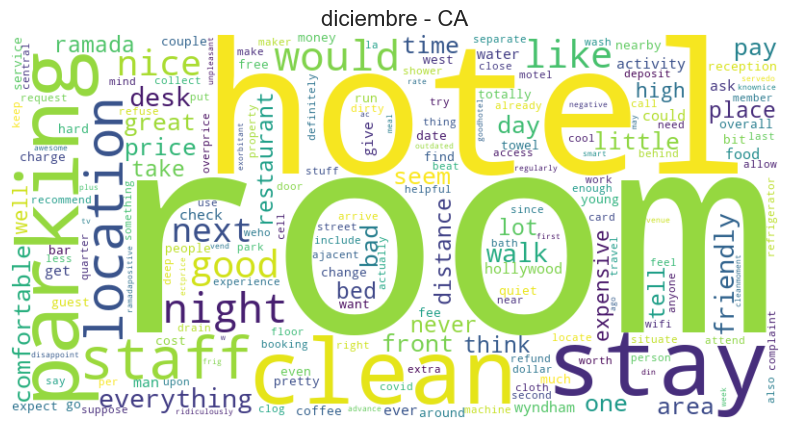

In [190]:
# Filtrar por diciembre para hacer nube de palabras

diciembre = ca[cliente_filtrado['month']==12]
# tokenizando
text = diciembre['clean_review'].str.cat()
text = text.lower()  # Convierte a minúsculas
text = ''.join([c for c in text if c.isalpha() or c.isspace()])  # Elimina caracteres no alfabéticos
# Tokenización
nltk.download('stopwords')
words = nltk.word_tokenize(text)
stop_words = set(stopwords.words('english'))
words = [word for word in words if word not in stop_words]  # Elimina palabras vacías

# Análisis de frecuencia de palabras
freq_dist = nltk.FreqDist(words)

# Creación de la Word Cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(freq_dist)

# Visualización
plt.figure(figsize=(10, 5))
plt.title('diciembre - CA', fontsize=16)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a futu

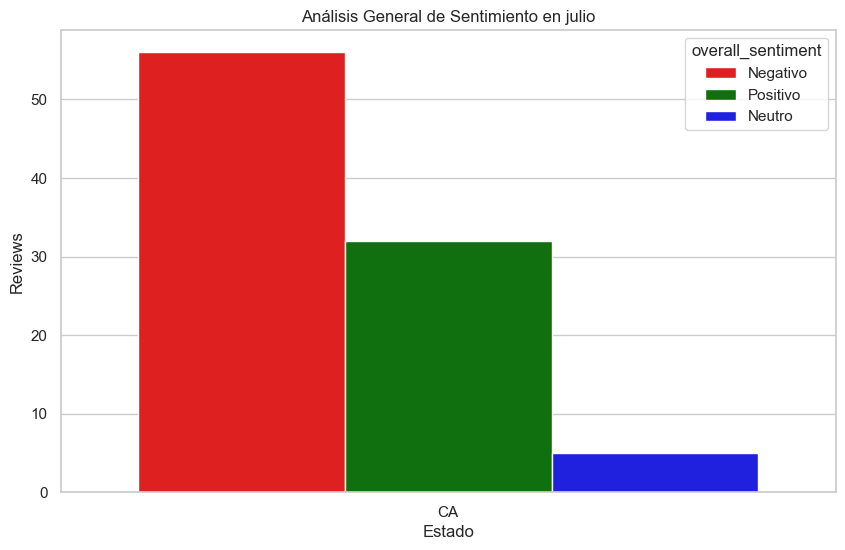

In [191]:
# Gráfico por sentimiento General en el mes de Julio
# Crear una paleta de colores personalizada
colores = {'Neutro': 'blue', 'Positivo': 'green', 'Negativo': 'red'}
# Crear un gráfico de barras apiladas
sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))

# Agrupar por 'state' y 'overall_sentiment' y calcular la suma del conteo
dataov = julio.groupby(['state', 'lodging_name'])['overall_sentiment'].value_counts().reset_index(name='conteo')
dataov['Color'] = dataov['overall_sentiment'].map(colores)
# Crear el gráfico de barras apiladas
ax = sns.barplot(x='state', y='conteo', hue='overall_sentiment', data=dataov, palette=dataov['Color'])

# Personalizar el gráfico
plt.title('Análisis General de Sentimiento en julio')
plt.xlabel('Estado')
plt.ylabel('Reviews')

# Mostrar el gráfico
plt.show()

/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/hugo/.pyenv/versions/3.10.9/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a futu

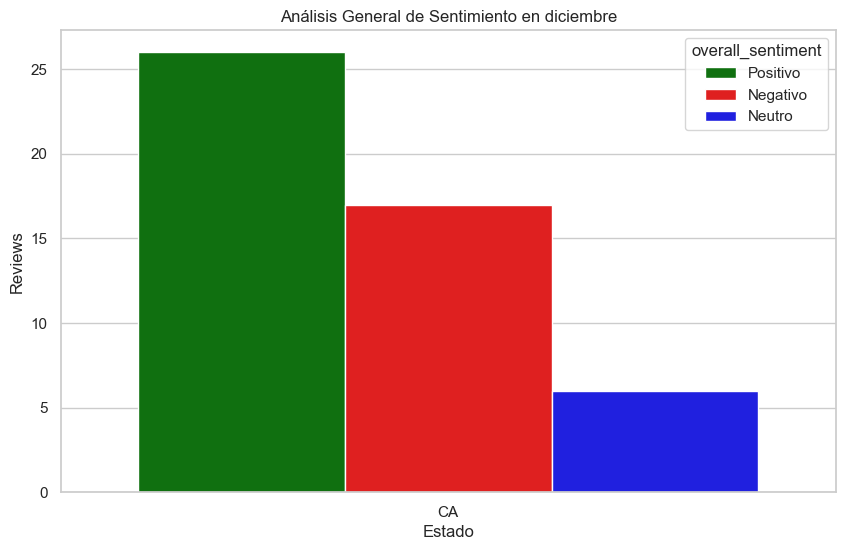

In [192]:
# Gráfico por sentimiento General en el mes de diciembre
# Crear una paleta de colores personalizada
colores = {'Neutro': 'blue', 'Positivo': 'green', 'Negativo': 'red'}
# Crear un gráfico de barras apiladas
sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))

# Agrupar por 'state' y 'overall_sentiment' y calcular la suma del conteo
dataov = diciembre.groupby(['state', 'lodging_name'])['overall_sentiment'].value_counts().reset_index(name='conteo')
dataov['Color'] = dataov['overall_sentiment'].map(colores)
# Crear el gráfico de barras apiladas
ax = sns.barplot(x='state', y='conteo', hue='overall_sentiment', data=dataov, palette=dataov['Color'])

# Personalizar el gráfico
plt.title('Análisis General de Sentimiento en diciembre')
plt.xlabel('Estado')
plt.ylabel('Reviews')

# Mostrar el gráfico
plt.show()